# Mod 4 Project - Gina Durante

## Overview

The Module 4 Project in the Flatiron School Data Science Version 2 Curriculum is meant to provide students with experience in working with time series data--in this case, monthly housing values from 04/01/1996 to 03/01/2018 for over 14,000 ZIP Codes in the U.S.  Skill sets required to complete this project include dataframe manipulation, data cleaning, data visualization, and time series analysis, and other areas (e.g., using github, Jupyter notebooks for data science projects, and writing and posting a blog).  

## Project topic

The project asks the student to identify the 5 "best" ZIP codes for investment, as defined by the student, and develop support for these recommendations to a hypothetical client (e.g., a real estate investment trust).  The student must develop a methodology for evaluating ZIP codes as potential investment targets and support these findings through a technical Jupyter notebook, a non-technical PowerPoint presentation, and a blog post.  

## My focus:  Sacramento metro area

Because the investment group is located in Sacramento, and because the Sacramento area has experience steady group over the last few decades (fueled in part by skyrocketing costs in the SF Bay Area, prompting some businesses to launch or relocate to the Sacramento region), I focused most of my efforts on the Sacramento metro area.  Because I have lived here for a number of years, I have some knowledge of the region, which has provided some helpful insights informing the analysis.

### Sacramento metro area (counties)

<center><img src='images/Sac_metro_counties_map.png' height=80% width=80%>

### Sacramento metro area (cities)

<center><img src='images/Sac_metro_cities_map.png' height=80% width=80%>

## Methodology, in brief

### Visualization of values by city and/or ZIP code, as well as of predictions of model

I developed iterative functions to visualize values by city within a metro area and across zip codes within cities in a metro area, using lists and dictionaries to iterate through the geographic areas of interest.  Using this approach, I identified 19 ZIP codes in the Sacramento region of possible interest.  Time series analysis of these 19 ZIP codes suggested 11 finalist ZIP codes to explore further.  From those, I selected 5 that I thought provided good (potentially great) returns, while limiting downside risk.  

### Consideration of predicted values, worst- and best-case scenarios, and other factors in the selection process

While the predicted returns over the forecast time horizon were of primary concern, I also took into account the worst-case scenario returns, the best-case scenario returns, the population in the ZIP code, the geographic location of the ZIP code, and personal knowledge of the area to inform my decision-making process.  More information is provided in the "Decision-making process" section of the "Recommended ZIP codes" section at the end of this notebook.


### County representation in finalist and top 5 selected ZIP codes

One of those ZIP codes was in El Dorado County, and the other four were in Placer County.  While there may be promising ZIP codes in both Sacramento and Yolo Counties, Sacramento City ZIP codes that I analyzed were not as competitive as those of Placer County.  I only analyzed one ZIP code in Yolo County (95616 in Davis), though others looked similar in terms of their pattern and trends.  It would probably be worthwhile to analyze one of the two ZIP codes in West Sacramento, as West Sac is an area that has been on the upswing for several years.  


## Possible future directions

Beyond analysis of at least one more ZIP code in the Sacramento area, I've identified several other possible future directions for this work:
- While time limitations prevented a broader evaluation of investment opportunities across the country, the functions I developed allow visualizations of broader swaths of the data (e.g., values by metro area, values by city within a metro area, values by zip codes and cities within a metro area).  
  - Creating visualizations at various geographic levels was very useful for identifying patterns that could signify promising investment opportunities.  
  - From this effort, I identified some geographic areas, such as the Dallas-Fort Worth and the Pittsburg metro areas, that could be worthwhile to explore in future efforts.  
- It could be interesting and potentially valuable to do some backtesting on the model to see how well it predicts the last 24 months for which we have data (May 2016 through April 2018).
- Analyzing shorter time frames (e.g., 2013-2018)
- Scaling investment by population size 
- Construct a basket of investments (e.g., $10M, weighted by ZIP population?)

## A few words on the notebook that follows...

The notebook below is what I used for performing my analyses and arriving at results.  Thus, it is technical and includes all code.  It will most likely be revised over time, so individuals interested in this work should check back periodically.  At the very end of this notebook is a table (small dataframe) that summarizes my analyses.  

# Step 1: Load the Data/Filtering for Chosen Zipcodes

In [6]:
import numpy as np
import pandas as pd
import matplotlib 
import matplotlib.pyplot as plt
import matplotlib as mpl
%matplotlib inline
import seaborn as sn

from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from pandas.plotting import autocorrelation_plot, lag_plot

import warnings
from statsmodels.tsa.arima_model import ARIMA
import statsmodels.api as sm
from sklearn.metrics import mean_squared_error

from collections import defaultdict
from collections import OrderedDict

In [431]:
pd.set_option("display.max_rows", 300)

In [432]:
pd.get_option("display.max_rows")

300

In [9]:
df = pd.read_csv('zillow_data.csv')

In [10]:
df.head()

,RegionID,RegionName,City,State,Metro,CountyName,SizeRank,1996-04,1996-05,1996-06,...,2017-07,2017-08,2017-09,2017-10,2017-11,2017-12,2018-01,2018-02,2018-03,2018-04
0,84654,60657,Chicago,IL,Chicago,Cook,1,334200.0,335400.0,336500.0,...,1005500,1007500,1007800,1009600,1013300,1018700,1024400,1030700,1033800,1030600
1,90668,75070,McKinney,TX,Dallas-Fort Worth,Collin,2,235700.0,236900.0,236700.0,...,308000,310000,312500,314100,315000,316600,318100,319600,321100,321800
2,91982,77494,Katy,TX,Houston,Harris,3,210400.0,212200.0,212200.0,...,321000,320600,320200,320400,320800,321200,321200,323000,326900,329900
3,84616,60614,Chicago,IL,Chicago,Cook,4,498100.0,500900.0,503100.0,...,1289800,1287700,1287400,1291500,1296600,1299000,1302700,1306400,1308500,1307000
4,93144,79936,El Paso,TX,El Paso,El Paso,5,77300.0,77300.0,77300.0,...,119100,119400,120000,120300,120300,120300,120300,120500,121000,121500


# Step 2: Data Preprocessing

## Convert time data type to datetime format

In [11]:
def get_datetimes(df):
    return pd.to_datetime(df.columns.values[7:], format='%Y-%m', errors = 'raise')

In [12]:
get_datetimes(df)

DatetimeIndex(['1996-04-01', '1996-05-01', '1996-06-01', '1996-07-01',
               '1996-08-01', '1996-09-01', '1996-10-01', '1996-11-01',
               '1996-12-01', '1997-01-01',
               ...
               '2017-07-01', '2017-08-01', '2017-09-01', '2017-10-01',
               '2017-11-01', '2017-12-01', '2018-01-01', '2018-02-01',
               '2018-03-01', '2018-04-01'],
              dtype='datetime64[ns]', length=265, freq=None)

## Fix problem with ZIP codes beginning with '0'

I have surmised that RegionName is the ZIP code for each entry.  RegionName values with only 4 digits represent ZIP codes that actually begin with '0'.  So that I can work with ZIP codes in the data set, I will need to add that zero onto every 4-digit RegionName value.  Once that's completed, I'll rename this column "ZipCode".  

In [13]:
df.head()

,RegionID,RegionName,City,State,Metro,CountyName,SizeRank,1996-04,1996-05,1996-06,...,2017-07,2017-08,2017-09,2017-10,2017-11,2017-12,2018-01,2018-02,2018-03,2018-04
0,84654,60657,Chicago,IL,Chicago,Cook,1,334200.0,335400.0,336500.0,...,1005500,1007500,1007800,1009600,1013300,1018700,1024400,1030700,1033800,1030600
1,90668,75070,McKinney,TX,Dallas-Fort Worth,Collin,2,235700.0,236900.0,236700.0,...,308000,310000,312500,314100,315000,316600,318100,319600,321100,321800
2,91982,77494,Katy,TX,Houston,Harris,3,210400.0,212200.0,212200.0,...,321000,320600,320200,320400,320800,321200,321200,323000,326900,329900
3,84616,60614,Chicago,IL,Chicago,Cook,4,498100.0,500900.0,503100.0,...,1289800,1287700,1287400,1291500,1296600,1299000,1302700,1306400,1308500,1307000
4,93144,79936,El Paso,TX,El Paso,El Paso,5,77300.0,77300.0,77300.0,...,119100,119400,120000,120300,120300,120300,120300,120500,121000,121500


In [14]:
df.sort_values(by="RegionName").head()

,RegionID,RegionName,City,State,Metro,CountyName,SizeRank,1996-04,1996-05,1996-06,...,2017-07,2017-08,2017-09,2017-10,2017-11,2017-12,2018-01,2018-02,2018-03,2018-04
5850,58196,1001,Agawam,MA,Springfield,Hampden,5851,113100.0,112800.0,112600.0,...,213900,215700,218200,220100,221100,221700,221700,221700,222700,223600
4199,58197,1002,Amherst,MA,Springfield,Hampshire,4200,161000.0,160100.0,159300.0,...,333700,334800,336700,338900,340400,342000,344500,347400,350600,353300
11213,58200,1005,Barre,MA,Worcester,Worcester,11214,103100.0,103400.0,103600.0,...,205600,206800,208800,210400,211300,213300,215600,217900,219500,220700
6850,58201,1007,Belchertown,MA,Springfield,Hampshire,6851,133400.0,132700.0,132000.0,...,266100,266300,267000,267500,268000,268100,268100,268800,270000,270600
14547,58202,1008,Blandford,MA,Springfield,Hampden,14548,117500.0,117300.0,117100.0,...,202400,202900,205900,208500,207500,205400,204500,206800,210900,214200


In [15]:
df['RegionName'] = df.RegionName.astype(str)
df['RegionName'].dtype


dtype('O')

In [16]:
df.rename(columns={'RegionName': 'Zip'}, inplace=True)
df.columns
df.head()

,RegionID,Zip,City,State,Metro,CountyName,SizeRank,1996-04,1996-05,1996-06,...,2017-07,2017-08,2017-09,2017-10,2017-11,2017-12,2018-01,2018-02,2018-03,2018-04
0,84654,60657,Chicago,IL,Chicago,Cook,1,334200.0,335400.0,336500.0,...,1005500,1007500,1007800,1009600,1013300,1018700,1024400,1030700,1033800,1030600
1,90668,75070,McKinney,TX,Dallas-Fort Worth,Collin,2,235700.0,236900.0,236700.0,...,308000,310000,312500,314100,315000,316600,318100,319600,321100,321800
2,91982,77494,Katy,TX,Houston,Harris,3,210400.0,212200.0,212200.0,...,321000,320600,320200,320400,320800,321200,321200,323000,326900,329900
3,84616,60614,Chicago,IL,Chicago,Cook,4,498100.0,500900.0,503100.0,...,1289800,1287700,1287400,1291500,1296600,1299000,1302700,1306400,1308500,1307000
4,93144,79936,El Paso,TX,El Paso,El Paso,5,77300.0,77300.0,77300.0,...,119100,119400,120000,120300,120300,120300,120300,120500,121000,121500


In [17]:
zips = []

for i in df['Zip']:
    if len(i) < 5:
        i = '0' + i
        zips.append(i)
    else:
        zips.append(i)

zips
df['Zip'] = pd.Series(zips)
df.sort_values(by='Zip').head()
# df.head()

,RegionID,Zip,City,State,Metro,CountyName,SizeRank,1996-04,1996-05,1996-06,...,2017-07,2017-08,2017-09,2017-10,2017-11,2017-12,2018-01,2018-02,2018-03,2018-04
5850,58196,01001,Agawam,MA,Springfield,Hampden,5851,113100.0,112800.0,112600.0,...,213900,215700,218200,220100,221100,221700,221700,221700,222700,223600
4199,58197,01002,Amherst,MA,Springfield,Hampshire,4200,161000.0,160100.0,159300.0,...,333700,334800,336700,338900,340400,342000,344500,347400,350600,353300
11213,58200,01005,Barre,MA,Worcester,Worcester,11214,103100.0,103400.0,103600.0,...,205600,206800,208800,210400,211300,213300,215600,217900,219500,220700
6850,58201,01007,Belchertown,MA,Springfield,Hampshire,6851,133400.0,132700.0,132000.0,...,266100,266300,267000,267500,268000,268100,268100,268800,270000,270600
14547,58202,01008,Blandford,MA,Springfield,Hampden,14548,117500.0,117300.0,117100.0,...,202400,202900,205900,208500,207500,205400,204500,206800,210900,214200


## Creating dataframes by various groupings and geographies

### Creating US dataframe (df_melt) using melt function

In [18]:
def melt_data(df):
    melted = pd.melt(df, id_vars=['RegionID', 'Zip', 'City', 'State', 'Metro', 'CountyName', 'SizeRank'], var_name='time')
    melted['time'] = pd.to_datetime(melted['time'], infer_datetime_format=False)
    melted = melted.dropna(subset=['value'])
    return melted   

In [19]:
df_melt = melt_data(df)


In [20]:
df_melt.head()

,RegionID,Zip,City,State,Metro,CountyName,SizeRank,time,value
0,84654,60657,Chicago,IL,Chicago,Cook,1,1996-04-01,334200.0
1,90668,75070,McKinney,TX,Dallas-Fort Worth,Collin,2,1996-04-01,235700.0
2,91982,77494,Katy,TX,Houston,Harris,3,1996-04-01,210400.0
3,84616,60614,Chicago,IL,Chicago,Cook,4,1996-04-01,498100.0
4,93144,79936,El Paso,TX,El Paso,El Paso,5,1996-04-01,77300.0


In [21]:
df_melt.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3744704 entries, 0 to 3901594
Data columns (total 9 columns):
RegionID      int64
Zip           object
City          object
State         object
Metro         object
CountyName    object
SizeRank      int64
time          datetime64[ns]
value         float64
dtypes: datetime64[ns](1), float64(1), int64(2), object(5)
memory usage: 285.7+ MB


In [22]:
df_melt.set_index('time')

,RegionID,Zip,City,State,Metro,CountyName,SizeRank,value
time,,,,,,,,
1996-04-01,84654,60657,Chicago,IL,Chicago,Cook,1,334200.0
1996-04-01,90668,75070,McKinney,TX,Dallas-Fort Worth,Collin,2,235700.0
1996-04-01,91982,77494,Katy,TX,Houston,Harris,3,210400.0
1996-04-01,84616,60614,Chicago,IL,Chicago,Cook,4,498100.0
1996-04-01,93144,79936,El Paso,TX,El Paso,El Paso,5,77300.0
...,...,...,...,...,...,...,...,...
2018-04-01,58333,01338,Ashfield,MA,Greenfield Town,Franklin,14719,209300.0
2018-04-01,59107,03293,Woodstock,NH,Claremont,Grafton,14720,225800.0
2018-04-01,75672,40404,Berea,KY,Richmond,Madison,14721,133400.0


In [23]:
## Dropping RegionID:

df_melt.drop('RegionID', axis=1, inplace=True)

In [24]:
df_melt.head()

,Zip,City,State,Metro,CountyName,SizeRank,time,value
0,60657,Chicago,IL,Chicago,Cook,1,1996-04-01,334200.0
1,75070,McKinney,TX,Dallas-Fort Worth,Collin,2,1996-04-01,235700.0
2,77494,Katy,TX,Houston,Harris,3,1996-04-01,210400.0
3,60614,Chicago,IL,Chicago,Cook,4,1996-04-01,498100.0
4,79936,El Paso,TX,El Paso,El Paso,5,1996-04-01,77300.0


Dataframe is sorted by SizeRank by default.

In [25]:
df_melt.isna().sum()

Zip                0
City               0
State              0
Metro         236023
CountyName         0
SizeRank           0
time               0
value              0
dtype: int64

In [26]:
df_melt['Metro'].fillna('Missing', inplace=True)
df_melt.isna().sum()

Zip           0
City          0
State         0
Metro         0
CountyName    0
SizeRank      0
time          0
value         0
dtype: int64

In [27]:
# Sorting by zip code, then time

df_melt.sort_values(by=['Zip', 'time'])

,Zip,City,State,Metro,CountyName,SizeRank,time,value
5850,01001,Agawam,MA,Springfield,Hampden,5851,1996-04-01,113100.0
20573,01001,Agawam,MA,Springfield,Hampden,5851,1996-05-01,112800.0
35296,01001,Agawam,MA,Springfield,Hampden,5851,1996-06-01,112600.0
50019,01001,Agawam,MA,Springfield,Hampden,5851,1996-07-01,112300.0
64742,01001,Agawam,MA,Springfield,Hampden,5851,1996-08-01,112100.0
...,...,...,...,...,...,...,...,...
3835273,99901,Ketchikan,AK,Ketchikan,Ketchikan Gateway,7294,2017-12-01,291900.0
3849996,99901,Ketchikan,AK,Ketchikan,Ketchikan Gateway,7294,2018-01-01,294200.0
3864719,99901,Ketchikan,AK,Ketchikan,Ketchikan Gateway,7294,2018-02-01,297500.0
3879442,99901,Ketchikan,AK,Ketchikan,Ketchikan Gateway,7294,2018-03-01,302100.0


Note that a few zip codes are missing; these rows were eliminated when Zip codes with NaN values in the 'value' column were dropped.

In [28]:
df_melt.nunique()

Zip           14723
City           7554
State            51
Metro           702
CountyName     1212
SizeRank      14723
time            265
value         24372
dtype: int64

### Creating new column, MetroState, to address duplicate metro names in different states (e.g., Aberdeen in multiple states)

Wanted to make sure that the values from totally unrelated metro areas in different states weren't inadvertently merged together.

In [29]:
df_melt['MetroState'] = df_melt['Metro'] + ' ' + df_melt['State']

In [30]:
df_melt.head()

,Zip,City,State,Metro,CountyName,SizeRank,time,value,MetroState
0,60657,Chicago,IL,Chicago,Cook,1,1996-04-01,334200.0,Chicago IL
1,75070,McKinney,TX,Dallas-Fort Worth,Collin,2,1996-04-01,235700.0,Dallas-Fort Worth TX
2,77494,Katy,TX,Houston,Harris,3,1996-04-01,210400.0,Houston TX
3,60614,Chicago,IL,Chicago,Cook,4,1996-04-01,498100.0,Chicago IL
4,79936,El Paso,TX,El Paso,El Paso,5,1996-04-01,77300.0,El Paso TX


### Creating df_metro (US metro df) with monthly values by Zip

In [31]:
df_melt.set_index('time', inplace=True)

In [32]:
df_melt.head()

,Zip,City,State,Metro,CountyName,SizeRank,value,MetroState
time,,,,,,,,
1996-04-01,60657,Chicago,IL,Chicago,Cook,1,334200.0,Chicago IL
1996-04-01,75070,McKinney,TX,Dallas-Fort Worth,Collin,2,235700.0,Dallas-Fort Worth TX
1996-04-01,77494,Katy,TX,Houston,Harris,3,210400.0,Houston TX
1996-04-01,60614,Chicago,IL,Chicago,Cook,4,498100.0,Chicago IL
1996-04-01,79936,El Paso,TX,El Paso,El Paso,5,77300.0,El Paso TX


Note:  the dataframe is sorted by zipcode SizeRank by default.  

In [33]:
df_metro = df_melt.groupby(['Metro', 'MetroState', 'CountyName', 'City', 'Zip', 'time']).mean().reset_index()


In [34]:
df_metro.head(10)

,Metro,MetroState,CountyName,City,Zip,time,SizeRank,value
0,Aberdeen,Aberdeen WA,Grays Harbor,Aberdeen,98520,1996-04-01,5029,86600.0
1,Aberdeen,Aberdeen WA,Grays Harbor,Aberdeen,98520,1996-05-01,5029,86300.0
2,Aberdeen,Aberdeen WA,Grays Harbor,Aberdeen,98520,1996-06-01,5029,86100.0
3,Aberdeen,Aberdeen WA,Grays Harbor,Aberdeen,98520,1996-07-01,5029,85900.0
4,Aberdeen,Aberdeen WA,Grays Harbor,Aberdeen,98520,1996-08-01,5029,85700.0
5,Aberdeen,Aberdeen WA,Grays Harbor,Aberdeen,98520,1996-09-01,5029,85600.0
6,Aberdeen,Aberdeen WA,Grays Harbor,Aberdeen,98520,1996-10-01,5029,85600.0
7,Aberdeen,Aberdeen WA,Grays Harbor,Aberdeen,98520,1996-11-01,5029,85700.0
8,Aberdeen,Aberdeen WA,Grays Harbor,Aberdeen,98520,1996-12-01,5029,85800.0
9,Aberdeen,Aberdeen WA,Grays Harbor,Aberdeen,98520,1997-01-01,5029,85900.0


In [35]:
df_metro.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3744704 entries, 0 to 3744703
Data columns (total 8 columns):
Metro         object
MetroState    object
CountyName    object
City          object
Zip           object
time          datetime64[ns]
SizeRank      int64
value         float64
dtypes: datetime64[ns](1), float64(1), int64(1), object(5)
memory usage: 228.6+ MB


In [36]:
df_metro.set_index('time', inplace=True)

In [37]:
df_metro.head()

,Metro,MetroState,CountyName,City,Zip,SizeRank,value
time,,,,,,,
1996-04-01,Aberdeen,Aberdeen WA,Grays Harbor,Aberdeen,98520,5029,86600.0
1996-05-01,Aberdeen,Aberdeen WA,Grays Harbor,Aberdeen,98520,5029,86300.0
1996-06-01,Aberdeen,Aberdeen WA,Grays Harbor,Aberdeen,98520,5029,86100.0
1996-07-01,Aberdeen,Aberdeen WA,Grays Harbor,Aberdeen,98520,5029,85900.0
1996-08-01,Aberdeen,Aberdeen WA,Grays Harbor,Aberdeen,98520,5029,85700.0


In [38]:
df_metro.nunique()

Metro           702
MetroState      865
CountyName     1212
City           7554
Zip           14723
SizeRank      14723
value         24372
dtype: int64

### Creating df_metro_cities (US Metros df with *City* mean values)

In [39]:
df_metro_cities = df_metro.groupby(['MetroState', 'CountyName', 'City', 'time']).mean().reset_index()

In [40]:
df_metro_cities.head(10)

,MetroState,CountyName,City,time,SizeRank,value
0,Aberdeen WA,Grays Harbor,Aberdeen,1996-04-01,5029.0,86600.0
1,Aberdeen WA,Grays Harbor,Aberdeen,1996-05-01,5029.0,86300.0
2,Aberdeen WA,Grays Harbor,Aberdeen,1996-06-01,5029.0,86100.0
3,Aberdeen WA,Grays Harbor,Aberdeen,1996-07-01,5029.0,85900.0
4,Aberdeen WA,Grays Harbor,Aberdeen,1996-08-01,5029.0,85700.0
5,Aberdeen WA,Grays Harbor,Aberdeen,1996-09-01,5029.0,85600.0
6,Aberdeen WA,Grays Harbor,Aberdeen,1996-10-01,5029.0,85600.0
7,Aberdeen WA,Grays Harbor,Aberdeen,1996-11-01,5029.0,85700.0
8,Aberdeen WA,Grays Harbor,Aberdeen,1996-12-01,5029.0,85800.0
9,Aberdeen WA,Grays Harbor,Aberdeen,1997-01-01,5029.0,85900.0


In [41]:
df_metro_cities.set_index('time', inplace=True)

In [42]:
df_metro_cities.drop('SizeRank', axis=1, inplace=True)

In [43]:
df_metro_cities.head()

,MetroState,CountyName,City,value
time,,,,
1996-04-01,Aberdeen WA,Grays Harbor,Aberdeen,86600.0
1996-05-01,Aberdeen WA,Grays Harbor,Aberdeen,86300.0
1996-06-01,Aberdeen WA,Grays Harbor,Aberdeen,86100.0
1996-07-01,Aberdeen WA,Grays Harbor,Aberdeen,85900.0
1996-08-01,Aberdeen WA,Grays Harbor,Aberdeen,85700.0


In [44]:
df_metro_cities.nunique()

MetroState      865
CountyName     1212
City           7554
value         83532
dtype: int64

### df_geog:  Function for creating a sub-dataframe of a particular geographic unit (e.g., MetroState area, City, CountyName)

In [45]:
def df_geog(df, col, geog):
    
    '''Creates subset dataframe containing just the geographic unit 
    (e.g., 'MetroState' == 'Sacramento CA', 'City' == 'Davis', etc.) of interest.  
    It is necessary to set df equal to a dataframe with the appropriate geographic grouping: 
    e.g., to plot values by city in a metro aree, df = df_metro_cities, col = 'MetroState',
    geog = 'Sacramento CA' (or metro area of interest). 
    '''
    df_metro_cities_geog = df.loc[df[col] == geog]
    return df_metro_cities_geog


### df_sac:  Sac Metro dataframe, values by Zip code

In [46]:
# df_sac = df_melt.loc[df_melt.Metro == 'Sacramento']  # use if function throws an error

df_sac = df_geog(df=df_metro, col = 'MetroState', geog = 'Sacramento CA')

In [47]:
df_sac

,Metro,MetroState,CountyName,City,Zip,SizeRank,value
time,,,,,,,
1996-04-01,Sacramento,Sacramento CA,El Dorado,Camino,95709,10422,141500.0
1996-05-01,Sacramento,Sacramento CA,El Dorado,Camino,95709,10422,141500.0
1996-06-01,Sacramento,Sacramento CA,El Dorado,Camino,95709,10422,141500.0
1996-07-01,Sacramento,Sacramento CA,El Dorado,Camino,95709,10422,141500.0
1996-08-01,Sacramento,Sacramento CA,El Dorado,Camino,95709,10422,141600.0
...,...,...,...,...,...,...,...
2017-12-01,Sacramento,Sacramento CA,Yolo,Woodland,95776,5094,391100.0
2018-01-01,Sacramento,Sacramento CA,Yolo,Woodland,95776,5094,397800.0
2018-02-01,Sacramento,Sacramento CA,Yolo,Woodland,95776,5094,401000.0


In [48]:
df_sac.drop('SizeRank', axis=1, inplace=True)

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/pandas/core/frame.py:4102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


In [49]:
df_sac

,Metro,MetroState,CountyName,City,Zip,value
time,,,,,,
1996-04-01,Sacramento,Sacramento CA,El Dorado,Camino,95709,141500.0
1996-05-01,Sacramento,Sacramento CA,El Dorado,Camino,95709,141500.0
1996-06-01,Sacramento,Sacramento CA,El Dorado,Camino,95709,141500.0
1996-07-01,Sacramento,Sacramento CA,El Dorado,Camino,95709,141500.0
1996-08-01,Sacramento,Sacramento CA,El Dorado,Camino,95709,141600.0
...,...,...,...,...,...,...
2017-12-01,Sacramento,Sacramento CA,Yolo,Woodland,95776,391100.0
2018-01-01,Sacramento,Sacramento CA,Yolo,Woodland,95776,397800.0
2018-02-01,Sacramento,Sacramento CA,Yolo,Woodland,95776,401000.0


### df_sac_cities:  Sacramento, CA metro area values by city

In [50]:
df_sac_cities = df_geog(df=df_metro_cities, col = 'MetroState', geog = 'Sacramento CA')

In [51]:
df_sac_cities.head()

,MetroState,CountyName,City,value
time,,,,
1996-04-01,Sacramento CA,El Dorado,Camino,141500.0
1996-05-01,Sacramento CA,El Dorado,Camino,141500.0
1996-06-01,Sacramento CA,El Dorado,Camino,141500.0
1996-07-01,Sacramento CA,El Dorado,Camino,141500.0
1996-08-01,Sacramento CA,El Dorado,Camino,141600.0


### df_sac_cities:  Sacramento, CA metro area values by city

In [52]:
df_sac_cities = df_geog(df=df_metro_cities, col = 'MetroState', geog = 'Sacramento CA')

In [53]:
df_sac_cities.head()

,MetroState,CountyName,City,value
time,,,,
1996-04-01,Sacramento CA,El Dorado,Camino,141500.0
1996-05-01,Sacramento CA,El Dorado,Camino,141500.0
1996-06-01,Sacramento CA,El Dorado,Camino,141500.0
1996-07-01,Sacramento CA,El Dorado,Camino,141500.0
1996-08-01,Sacramento CA,El Dorado,Camino,141600.0


## Creating dictionaries -- Sac Metro region

### Function to print first n number of items in a dictionary


In [54]:
# function to print first n number of items in a dictionary

def print_first_n(dictionary, n):
    return {k: dictionary[k] for k in list(dictionary)[:n]}

### Creating sac_metro_cities list from df_sac

In [55]:
sac_metro_cities = list(set(df_sac.City))
sac_metro_cities[:5]

['Loomis', 'Davis', 'Lincoln', 'Meadow Vista', 'Florin']

In [56]:
sac_metro_cities.sort()
sac_metro_cities[:5]


['Applegate', 'Arden-Arcade', 'Auburn', 'Camino', 'Carmichael']

### Creating sac_metro_zips list from zips in Sac Metro area

In [57]:
sac_metro_zips = list(set(df_sac.Zip))
sac_metro_zips[:5]

['96143', '95827', '95630', '95693', '95677']

### Creating dict_zips_cities dictionary to graph zips by city

In [58]:
df_sac_one_val = df_sac.groupby(['CountyName', 'City', 'Zip']).mean().reset_index()

In [59]:
df_sac_one_val.sort_values(by=['Zip']).head()

#### Seeking to create the dictionary showing just the unique zip code instance rather than repeating it for each row of data) 

,CountyName,City,Zip,value
17,Placer,Auburn,95602,348386.415094
18,Placer,Auburn,95603,311752.830189
87,Yolo,West Sacramento,95605,160125.283019
41,Sacramento,Carmichael,95608,286006.415094
42,Sacramento,Citrus Heights,95610,235864.150943


In [60]:
from collections import defaultdict

dict_sac_zips_cities = defaultdict(list)

for idx,row in df_sac_one_val.iterrows():
    dict_sac_zips_cities[row['City']].append(row['Zip'])
    
print(dict_sac_zips_cities)

defaultdict(<class 'list'>, {'Camino': ['95709'], 'Cool': ['95614'], 'Diamond Springs': ['95619'], 'El Dorado': ['95623'], 'El Dorado Hills': ['95762'], 'Garden Valley': ['95633'], 'Georgetown': ['95634'], 'Pilot Hill': ['95664'], 'Placerville': ['95667'], 'Pollock Pines': ['95726'], 'Rescue': ['95672'], 'Shingle Springs': ['95682'], 'Somerset': ['95636', '95684'], 'South Lake Tahoe': ['96150'], 'Tahoma': ['96142'], 'Applegate': ['95703'], 'Auburn': ['95602', '95603'], 'Carnelian Bay': ['96140'], 'Colfax': ['95713'], 'Foresthill': ['95631'], 'Granite Bay': ['95746'], 'Homewood': ['96141'], 'Kings Beach': ['96143'], 'Lincoln': ['95648'], 'Loomis': ['95650'], 'Meadow Vista': ['95722'], 'Newcastle': ['95658'], 'Penryn': ['95663'], 'Rocklin': ['95677', '95765'], 'Roseville': ['95661', '95678', '95747'], 'Tahoe City': ['96145', '96146'], 'Tahoe Vista': ['96148'], 'Arden-Arcade': ['95821', '95825', '95864'], 'Carmichael': ['95608'], 'Citrus Heights': ['95610', '95621'], 'Elk Grove': ['95624'

In [61]:
from collections import OrderedDict

# Create Ordered dictionary of cities and zip codes

ordict_sac_zips_cities = OrderedDict(sorted(dict_sac_zips_cities.items()))
                                     
type(ordict_sac_zips_cities)


collections.OrderedDict

In [62]:
print_first_n(ordict_sac_zips_cities, n=10)

{'Applegate': ['95703'],
 'Arden-Arcade': ['95821', '95825', '95864'],
 'Auburn': ['95602', '95603'],
 'Camino': ['95709'],
 'Carmichael': ['95608'],
 'Carnelian Bay': ['96140'],
 'Citrus Heights': ['95610', '95621'],
 'Colfax': ['95713'],
 'Cool': ['95614'],
 'Davis': ['95616', '95618']}

In [63]:
dict_sac_zips_cities = dict(sorted(ordict_sac_zips_cities.items()))
print_first_n(dict_sac_zips_cities, n=10)

{'Applegate': ['95703'],
 'Arden-Arcade': ['95821', '95825', '95864'],
 'Auburn': ['95602', '95603'],
 'Camino': ['95709'],
 'Carmichael': ['95608'],
 'Carnelian Bay': ['96140'],
 'Citrus Heights': ['95610', '95621'],
 'Colfax': ['95713'],
 'Cool': ['95614'],
 'Davis': ['95616', '95618']}

### Function to return slice of an ordered dictionary (for use in plotting)

In [59]:
def return_slice(dictionary, m, n):
    sub_dict = {k: dictionary[k] for k in list(dictionary)[m:n]}
    return sub_dict

In [60]:
dict_0_6 = return_slice(dict_sac_zips_cities, 0, 6)
dict_0_6

{'Applegate': ['95703'],
 'Arden-Arcade': ['95821', '95825', '95864'],
 'Auburn': ['95602', '95603'],
 'Camino': ['95709'],
 'Carmichael': ['95608'],
 'Carnelian Bay': ['96140']}

In [61]:
dict_6_12 = return_slice(dict_sac_zips_cities, 6, 12)
dict_6_12

{'Citrus Heights': ['95610', '95621'],
 'Colfax': ['95713'],
 'Cool': ['95614'],
 'Davis': ['95616', '95618'],
 'Diamond Springs': ['95619'],
 'El Dorado': ['95623']}

In [62]:
dict_12_18 = return_slice(dict_sac_zips_cities, 12, 18)
dict_12_18

{'El Dorado Hills': ['95762'],
 'Elk Grove': ['95624', '95757', '95758'],
 'Elverta': ['95626'],
 'Esparto': ['95627'],
 'Fair Oaks': ['95628'],
 'Florin': ['95828']}

In [63]:
dict_18_24 = return_slice(dict_sac_zips_cities, 18, 24)
dict_18_24

{'Folsom': ['95630'],
 'Foresthill': ['95631'],
 'Galt': ['95632'],
 'Garden Valley': ['95633'],
 'Georgetown': ['95634'],
 'Granite Bay': ['95746']}

In [64]:
dict_24_30 = return_slice(dict_sac_zips_cities, 24, 30)
dict_24_30

{'Herald': ['95638'],
 'Homewood': ['96141'],
 'Kings Beach': ['96143'],
 'Lincoln': ['95648'],
 'Loomis': ['95650'],
 'Mather Air Force Base': ['95655']}

In [65]:
dict_30_36 = return_slice(dict_sac_zips_cities, 30, 36)
dict_30_36

{'Meadow Vista': ['95722'],
 'Newcastle': ['95658'],
 'Orangevale': ['95662'],
 'Penryn': ['95663'],
 'Pilot Hill': ['95664'],
 'Placerville': ['95667']}

In [66]:
dict_36_42 = return_slice(dict_sac_zips_cities, 36, 42)
dict_36_42

{'Pollock Pines': ['95726'],
 'Rancho Cordova': ['95670', '95742', '95827'],
 'Rescue': ['95672'],
 'Rio Linda': ['95673'],
 'Rocklin': ['95677', '95765'],
 'Rosemont': ['95826']}

In [67]:
dict_42_48 = return_slice(dict_sac_zips_cities, 42, 48)
dict_42_48

{'Roseville': ['95661', '95678', '95747'],
 'Sacramento': ['95660',
  '95811',
  '95815',
  '95816',
  '95817',
  '95818',
  '95819',
  '95820',
  '95822',
  '95823',
  '95824',
  '95829',
  '95831',
  '95832',
  '95833',
  '95834',
  '95835',
  '95838',
  '95841',
  '95842',
  '95843'],
 'Shingle Springs': ['95682'],
 'Sloughhouse': ['95683'],
 'Somerset': ['95636', '95684'],
 'South Lake Tahoe': ['96150']}

In [68]:
dict_48_54 = return_slice(dict_sac_zips_cities, 48, 54)
dict_48_54

{'Tahoe City': ['96145', '96146'],
 'Tahoe Vista': ['96148'],
 'Tahoma': ['96142'],
 'Walnut Grove': ['95690'],
 'West Sacramento': ['95605', '95691'],
 'Wilton': ['95693']}

In [69]:
dict_54_56 = return_slice(dict_sac_zips_cities, 54, 56)
dict_54_56

{'Winters': ['95694'], 'Woodland': ['95695', '95776']}

# Step 3: EDA/Visualizations

## Plotting functions

### Plotting function:  plot_single_geog function (plots a single geographic unit)

In [64]:
# Be sure to use df with appropriate value grouping (e.g., metro, city, zip)

def plot_single_geog(df, geog_area, col1, col2, figsize=(12, 6), fontsize1=12, fontsize2=16):
    
    ''' Plots housing values for individual geographic unit, e.g., MetroState, City, County.  
    Be sure to use the appropriate dataframe for the selected grouping (df_metro_cities for 
    cities in a metro area, for example).  Specify nrows, ncols, and figsize to match size of list.
    '''
    
    ts = df[col1].loc[df[col2] == geog_area]
    ax = ts.plot(figsize=figsize, fontsize=fontsize1, label = 'Raw Price')
    plt.title(geog_area, fontsize=fontsize2)
    plt.xlabel('')

    max_ = ts.loc['2004':'2010'].idxmax()  
    crash = '01-2009'
    min_ = ts.loc[crash:].idxmin()
    val_2003 = ts.loc['2003-01-01']

    ax.axvline(max_, label='Max price during bubble', color = 'green', ls=':')
    ax.axvline(crash, label = 'Housing Index Drops', color='red', ls=':')
    ax.axvline(min_, label=f'Min price post-crash {min_}', color = 'black', ls=':')
    ax.axhline(val_2003, label='Value on 2003-01-01', color = 'blue', ls='-.', alpha=0.15)

    ax.legend(loc='upper left', fontsize=fontsize1)



### Plotting function:   plot_ts_cities (plot values by city)

In [65]:
# Adapted from James Irving's study group:
    
def plot_ts_cities(df, cities, col='value', figsize = (18, 100), fontsize1=14, fontsize2=20, nrows=30, ncols=2, 
                   legend=True, set_ylim = False, ylim = 1400000):
    
    '''Plots housing values by city within a metro area.  Need to use dataframe 
    with values by CITY for just that METRO (specify .loc in arguments that 
    column 'MetroState' == METRO). Need LIST of CITIES within that METRO area.  
    Specify nrows, ncols, and figsize to match size of dataset.
    '''
    
    fig = plt.figure(figsize=figsize)
    
    for i, city in enumerate(cities, start=1):
        ax = fig.add_subplot(nrows, ncols, i)
        
        ts = df[col].loc[df['City'] == city]
        ts = ts.rename('Average home values')
        ts.plot(fontsize=fontsize1, ax=ax)
        plt.title(city, fontsize=fontsize2)
        plt.xlabel('')

        try:
            max_ = ts.loc['2004':'2011'].idxmax() 
        except:
            continue
            
        crash = '01-2009'
        min_ = ts.loc[crash:].idxmin()
        try:
            val_2003 = ts.loc['2003-01-01']
        except:
            continue

        ax.axvline(max_, label=f'Max price during \nbubble', color = 'orange', ls=':')
        ax.axvline(crash, label = 'US median house \nprice bottom (crash)', color='black', ls=':')
        ax.axvline(min_, label=f'Min price post-crash', color = 'red', ls=':')
       
        try:
            ax.axhline(val_2003, label='Value on 2003-01-01', color = 'blue', ls='-.', alpha=0.15)
        except:
            continue
            
        if set_ylim:
            ax.set_ylim(ylim)
        if legend:
            ax.legend(loc="upper left", fontsize=fontsize1)
            
        fig.tight_layout()
    
    return fig, ax


### Plotting function:  plot_ts_zips (plots individual zip codes in a list provided to the function)

In [66]:
# Adapted from James Irving's study group:
    
def plot_ts_zips(df, zipcodes, col='value', figsize = (12, 6), fontsize1=14, fontsize2=18, nrows=2, ncols=2, 
                 legend=True, set_ylim = False, ylim = 800000):
        
    ''' Plots multiple zip codes in a single axes/figure.  For each zip code, marks dates of:
    1) maximum value reached during the housing bubble; 2) minimum value after the crash;
    3) absolute minimum across entire time horizon (e.g., 1996 if you go back that far);
    4) absolute minimum across entire time horizon (may or may not be the height of the bubble);
    5) date when the national housing index (Case-Schiller) dropped.  
    ''' 

    fig = plt.figure(figsize=figsize)
    
    for i, zc in enumerate(zipcodes, start=1):
        ax = fig.add_subplot(nrows, ncols, i)
        
        ts = df[col].loc[df['Zip'] == zc]
        ts = ts.rename(zc)
        ts.plot(ax=ax, fontsize=fontsize1)
        plt.title(zc, fontsize=fontsize2)
        plt.xlabel('')
        
        try: 
            max_ = ts.loc['2004':'2011'].idxmax()  
        except:
            continue

        crash = '01-2009'
        min_ = ts.loc[crash:].idxmin()
        val_2003 = ts.loc['2003-01-01']

        ax.axvline(max_, label=f'Max price during bubble', color = 'orange', ls=':')
        ax.axvline(crash, label = 'US median home price, \npost-bubble low', color='black', ls=':')
        ax.axvline(min_, label=f'ZIP code min price, \npost-crash', color = 'red', ls=':')
        ax.axhline(val_2003, label='Value on \n01/01/2003', color = 'blue', ls='-.', alpha=0.15)
        if set_ylim:
            ax.set_ylim(ylim)
        if legend:
            ax.legend(loc='upper left', fontsize=fontsize1)
    
        fig.tight_layout()
    
    return fig, ax


### Plotting function:  plot_ts_zips_by_city (plot of each city with values by zip codes in a metro area)

In [67]:
# Function below adapted from James Irving's study group:
    
def plot_ts_zips_by_city(df, dict_zips_cities, col='value', figsize = (18, 120), fontsize1=14, fontsize2=18, 
                         nrows=30, ncols=2, legend=True, set_ylim = False, ylim = 1400000):
        
    '''Plots values for zip codes by city within a metro area.  Need to use dataframe 
    with values by ZIP code and CITY for just that METRO (or specify .loc in arguments that 
    column 'MetroState' == METRO). Need DICTIONARY of ZIPS by CITY within that METRO area.  
    Specify nrows, ncols, and figsize to match size of dataset.
    '''

    fig = plt.figure(figsize=figsize)
    
    for i, key in enumerate(sorted(dict_zips_cities.keys()), start=1):
        ax = fig.add_subplot(nrows, ncols, i)

        for val in dict_zips_cities[key]:
            ts = df[col].loc[df['Zip'] == val]
            ts = ts.rename(val)
            ts.plot(ax=ax, fontsize=fontsize1)   
            plt.title(key, fontsize=fontsize2)
            plt.xlabel('')
            
            try: 
                max_ = ts.loc['2004':'2011'].idxmax()  
            except:
                continue

            crash = '01-2009'
            min_ = ts.loc[crash:].idxmin()
            
#             val_2003 = ts.loc['2003-01-01']

#             ax.axvline(max_, label=f'Max price during bubble for {val}', color = 'orange', ls=':')               
#             ax.axvline(min_, label=f'Min Price Post Crash for {val}', color = 'red', ls=':')
#             ax.axvline(crash, color='black')            # if label is desired, insert the following:  label = 'Case-Schiller index declines'
#             ax.axvline('2003-01-01', color = 'blue', ls='-.', alpha=0.15)   # for label, insert the following:  label='2003-01-01'
#             ax.axhline(ts.loc['2003-01-01'], label='2003-01-01 value for {val}', ls='-.', alpha = 0.15)  # can't get this to work on multiple zip plots 
    
            if set_ylim:
                ax.set_ylim(ylim)
            if legend:
                ax.legend(loc="upper left", fontsize=fontsize1)
        
        peak = '01-2007'
        crash = '01-2009'
        ax.axvline(crash, label = 'US median home price, \npost-bubble low', color='red', ls=':')   
        ax.axvline(peak, label = 'US median home price \npeak during bubble', color='black', ls=':')
        ax.axvline('2003-01-01', label = 'Beginning of bubble', color = 'blue', ls='-.', alpha=0.25)
        
        if legend:
            ax.legend(loc='upper left', fontsize=fontsize1)

        fig.tight_layout()
    
    return fig, ax


### Plotting function:  single_zip_boxplot (boxplots of a single ZIP code)

In [68]:
def single_zip_boxplot(df, geog_area, col1 = 'value', col2 = 'Zip', figsize=(8, 4)):
    
    '''Plots boxplots of each zipcode within a city.  Need to use dataframe with values by ZIP 
    for just that CITY (or specify .loc in arguments that column 'City' == CITY in question).
    Need LIST of ZIP codes for that particular CITY.  Need to specify nrows, ncols, and figsize.
    '''
    
    fig = plt.figure(figsize=figsize)
    ts = df.loc[df[col2] == geog_area]
    ts.boxplot(column = col1)
    plt.title(f'{geog_area}')
    

### Plotting function:  city_zips_boxplot (boxplots of zip codes in a city)

In [69]:
def city_zips_boxplot(df, city_zips, nrows, ncols, figsize=(18, 30)):
    
    '''Plots boxplots of each zipcode within a city.  Need to use dataframe with values by ZIP 
    for just that CITY (or specify .loc in arguments that column 'City' == CITY in question).
    Need LIST of ZIP codes for that particular CITY.  Need to specify nrows, ncols, and figsize.
    '''
    
    fig = plt.figure(figsize=figsize)
    
    for i, zc in enumerate(city_zips, start=1):
        ax = fig.add_subplot(nrows, ncols, i)
        ts = df.loc[df['Zip'] == zc]
        ts.boxplot(column = 'value', ax = ax)
        ax.set_title(f'{zc}')
        fig.tight_layout()


### Plotting function:  metro_zips_boxplot (boxplots by zip in metro area)

In [70]:
def metro_zips_boxplot(df, metro_zips, nrows, ncols, figsize=(18, 100)):
    
    '''Plots boxplots of each zipcode within a city.  Need to use dataframe with values by ZIP 
    for just that METRO area (or specify .loc in arguments that column 'MetroState' == METRO).
    Need a LIST of ZIP codes within that METRO area.  Need to specify nrows, ncols, and figsize.
    '''
    
    fig = plt.figure(figsize=figsize)
    
    for i, zc in enumerate(metro_zips, start=1):
        ax = fig.add_subplot(nrows, ncols, i)
        ts = df.loc[df['Zip'] == zc]
        ts.boxplot(column = 'value', ax = ax)
        ax.set_title(f'{zc}')
        fig.tight_layout()


### Plotting function:  metro_cities_boxplot (boxplots by city in metro area)

In [71]:
def metro_cities_boxplot(df, metro_cities, nrows, ncols, figsize=(18, 30)):
    
    '''Plots boxplots of each city within a metro area.  Need to use dataframe with values 
    by CITY for just that METRO (or specify .loc in arguments that column 'MetroState' == METRO.
    Need LIST of CITIES within a particular metro area.  Need to specify nrows, ncols, and figsize.
    '''
    
    fig = plt.figure(figsize=figsize)
    
    for i, city in enumerate(metro_cities, start=1):
        ax = fig.add_subplot(nrows, ncols, i)
        ts = df.loc[df['City'] == city]
        ts.boxplot(column = 'value', ax = ax)
        ax.set_title(f'{city}')
        fig.tight_layout()


### Plotting function:  metro_cities_zips_boxplot (boxplots by city and zip code in metro area)

In [72]:
def metro_cities_zips_boxplot(df, dict_metro_cities_zips, nrows, ncols, figsize=(18, 40)):
    
    '''Plots boxplots of all zip codes in each city within a metro area.  Need to use dataframe 
    with values by ZIP code and CITY for just that METRO (or specify .loc in arguments that 
    column 'MetroState' == METRO). Need DICTIONARY of ZIPS by CITY within that METRO area.  
    Need to specify nrows, ncols, and figsize.
    '''
    
    fig = plt.figure(figsize=figsize)
    
    for i, (city, zc) in enumerate(dict_metro_cities_zips.copy().items(), start=1):
        ax = fig.add_subplot(nrows, ncols, i)
        ax.set_title(f'{city}')
        for i, zc in enumerate(dict_metro_cities_zips.copy()[city], start=1):
            ts = df.loc[df['Zip'] == zc]
            ts.boxplot(column = 'value', ax = ax)
            ax.set_title(f'{city}')
            fig.tight_layout()


### Plotting function: violin plot for zip codes in a city or metro area

In [73]:
# got figure size  modification example from https://exceptionshub.com/how-do-i-change-the-figure-size-for-a-seaborn-plot.html

# fig, ax = plt.subplots()
# fig.set_size_inches(16, 6)
# sns.violinplot(x="Zip", y="value", data=df_44, scale="count", inner="stick", ax=ax)

def violin_plt(x, y, data, scale="width", inner="quartile", set_size_inches=(16, 6)):
    
    '''Plots zip codes within a city on one violin plot.  Set defaults to x='Zip', y='value', 
    data=df_sac_city, scale="width", inner="quartile", set_size_inches=(16, 6), ax=ax)
    '''
    
    import seaborn as sns
    fig, ax = plt.subplots()
    fig.set_size_inches
    sns.violinplot(x, y, data, scale, inner, ax)
    
    

### Creating ACF and PACF plots

In [74]:
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from pandas.plotting import autocorrelation_plot, lag_plot

In [75]:
# Adapted from James Irving's study group discussion

def plot_acf_pacf(ts, figsize=(10,6), lags=15):
    
    ''' Plots both ACF and PACF for given times series (ts).  Time series needs to be a Series 
    (not DataFrame) of values.  Can modify figsize and number of lags if desired.'''

    fig, ax = plt.subplots(nrows=2, figsize=figsize)
    plot_acf(ts, ax=ax[0], lags=lags)
    plot_pacf(ts, ax=ax[1], lags=lags)
    plt.tight_layout()
    
    for a in ax:
        a.xaxis.set_major_locator(mpl.ticker.MaxNLocator(min_n_ticks=lags, integer=True))
        a.xaxis.grid()
#         a.xaxis_date()
    

### Seasonal Decomposition

In [76]:
# from James Irving's study group
# plot seasonal decomposition

def plot_seasonal_decomp(ts):
    decomp = seasonal_decompose(ts)
    ts_seasonal = decomp.seasonal

    ax = ts_seasonal.plot()
    fig = ax.get_figure()
    fig.set_size_inches(18,6)

    min_ = ts_seasonal.idxmin()
    max_ = ts_seasonal.idxmax()
    max_2 = ts_seasonal.loc[min_:].idxmax()
    min_2 = ts_seasonal.loc[max_2:].idxmin()


    ax.axvline(min_, label=min_, c='orange')
    ax.axvline(max_, c='orange', ls=':')
    ax.axvline(min_2, c='orange')
    ax.axvline(max_2, c='orange', ls=':')

    period = min_2 - min_ 
    ax.set_title(f'Season Length = {period}')
    
    return fig, ax


## Plotting Sacramento values by zip code, grouped by city or within a city

### Plotting values by city

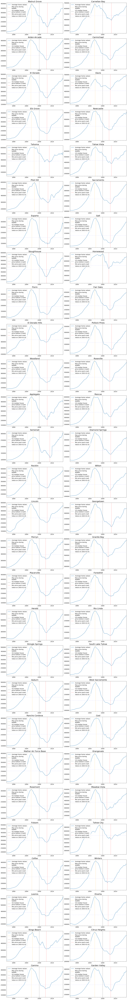

In [119]:
plot_ts_cities(df_sac_cities, sac_metro_cities, col='value', figsize=(18, 150));


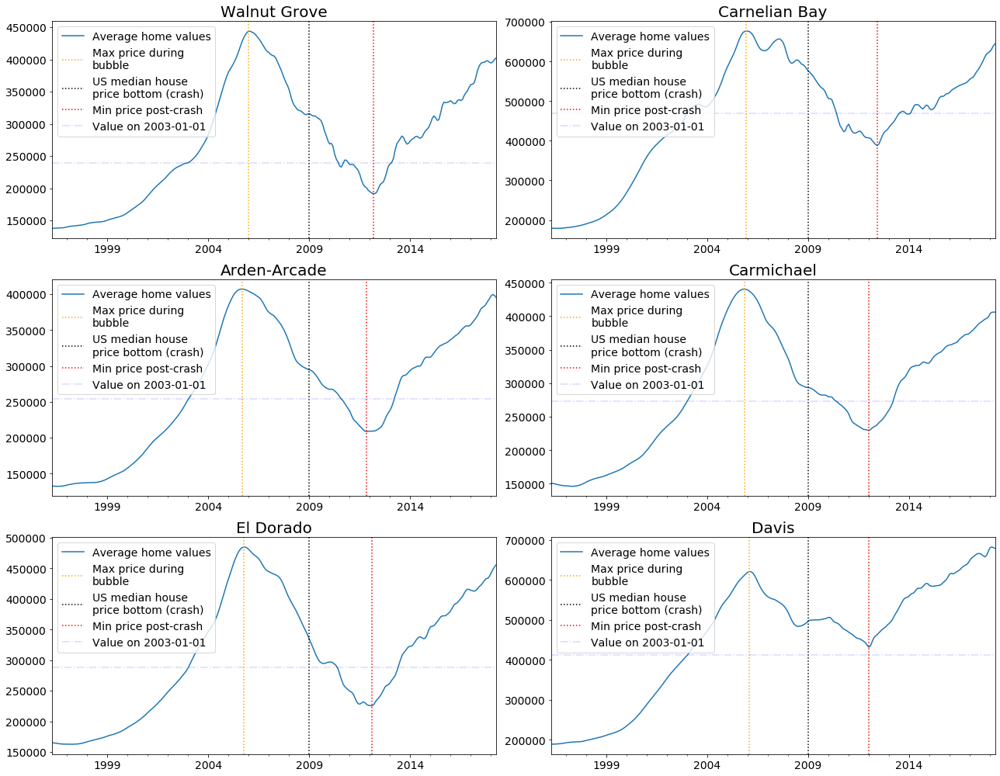

In [120]:
plot_ts_cities(df_sac_cities, sac_metro_cities[:6], nrows = 3, ncols = 2, figsize=(18,14), col='value', legend=True);

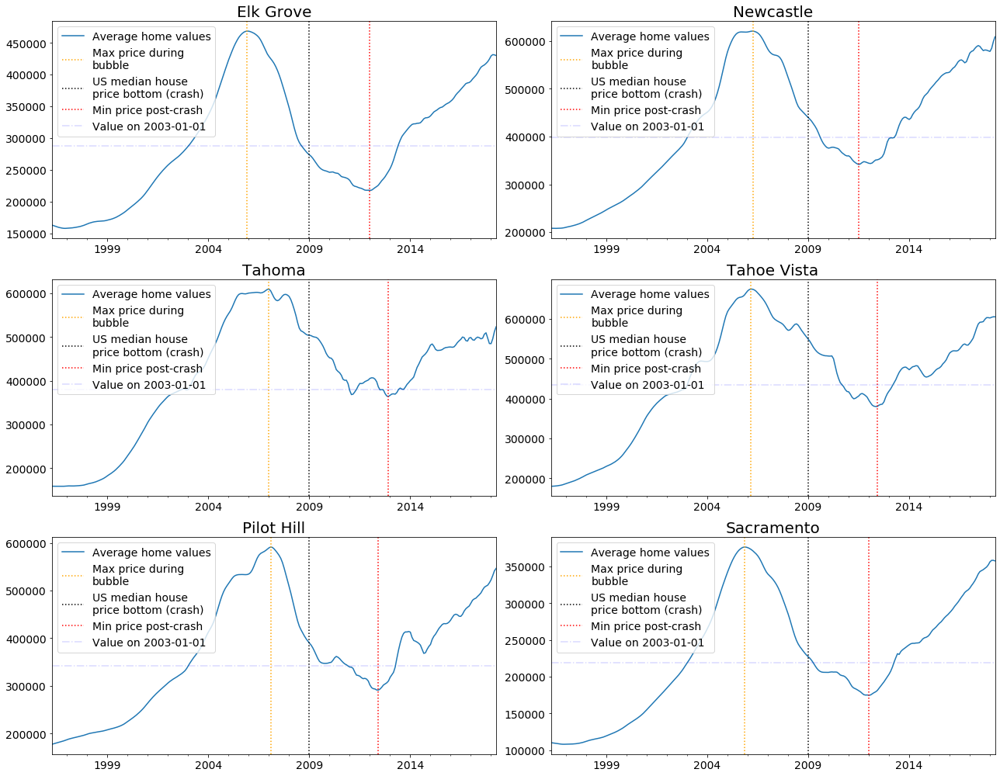

In [121]:
plot_ts_cities(df_sac_cities, sac_metro_cities[6:12], nrows = 3, ncols = 2, figsize=(18,14), col='value', legend=True);

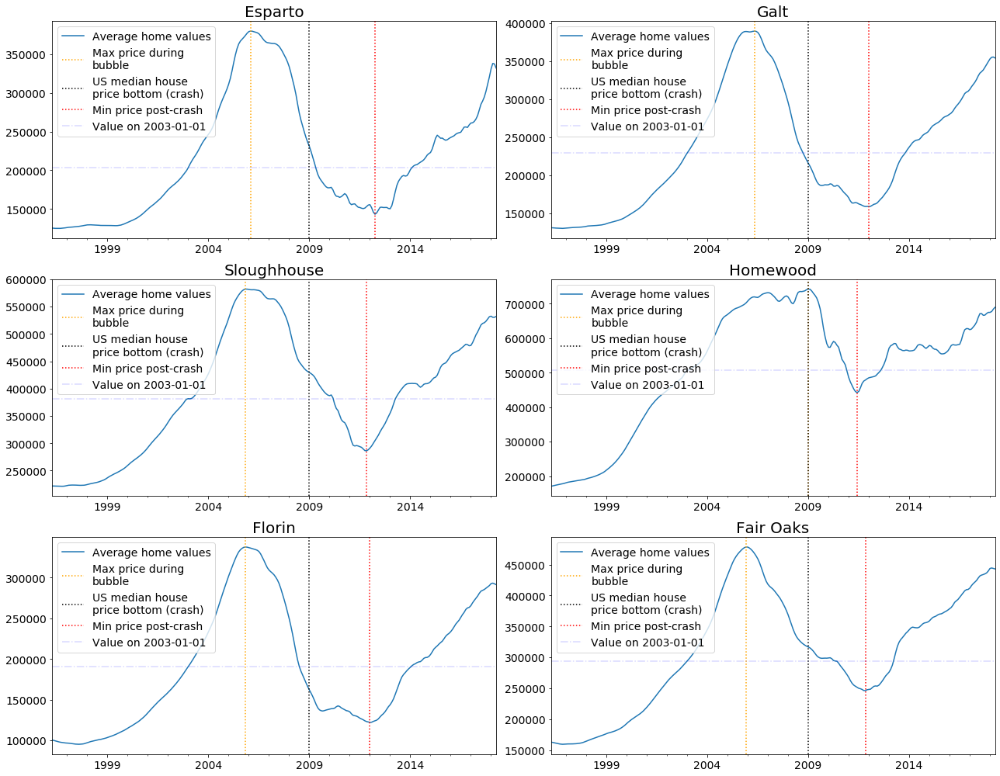

In [122]:
plot_ts_cities(df_sac_cities, sac_metro_cities[12:18], nrows = 3, ncols = 2, figsize=(18,14), col='value', legend=True);


(<Figure size 1152x1008 with 6 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x1c28fb6f98>)

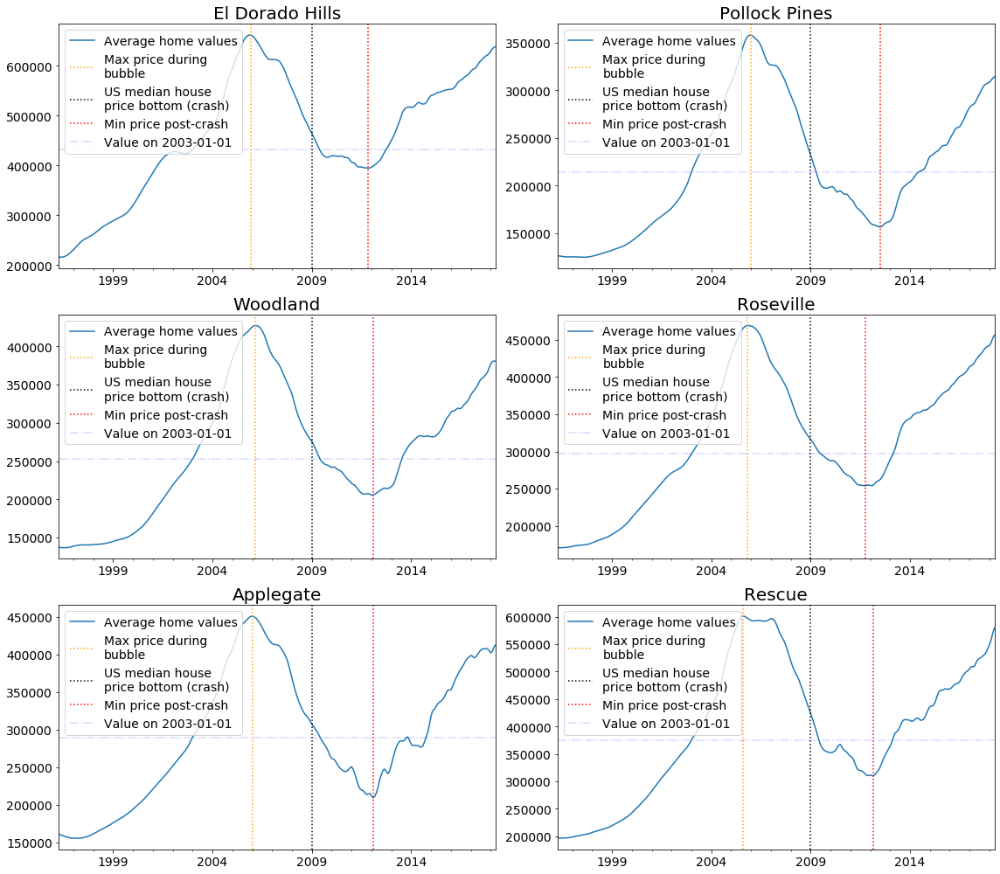

In [123]:
plot_ts_cities(df_sac_cities, sac_metro_cities[18:24], nrows = 3, ncols = 2, figsize=(16,14), col='value', legend=True)

(<Figure size 1152x1008 with 6 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x1c1fe6fd68>)

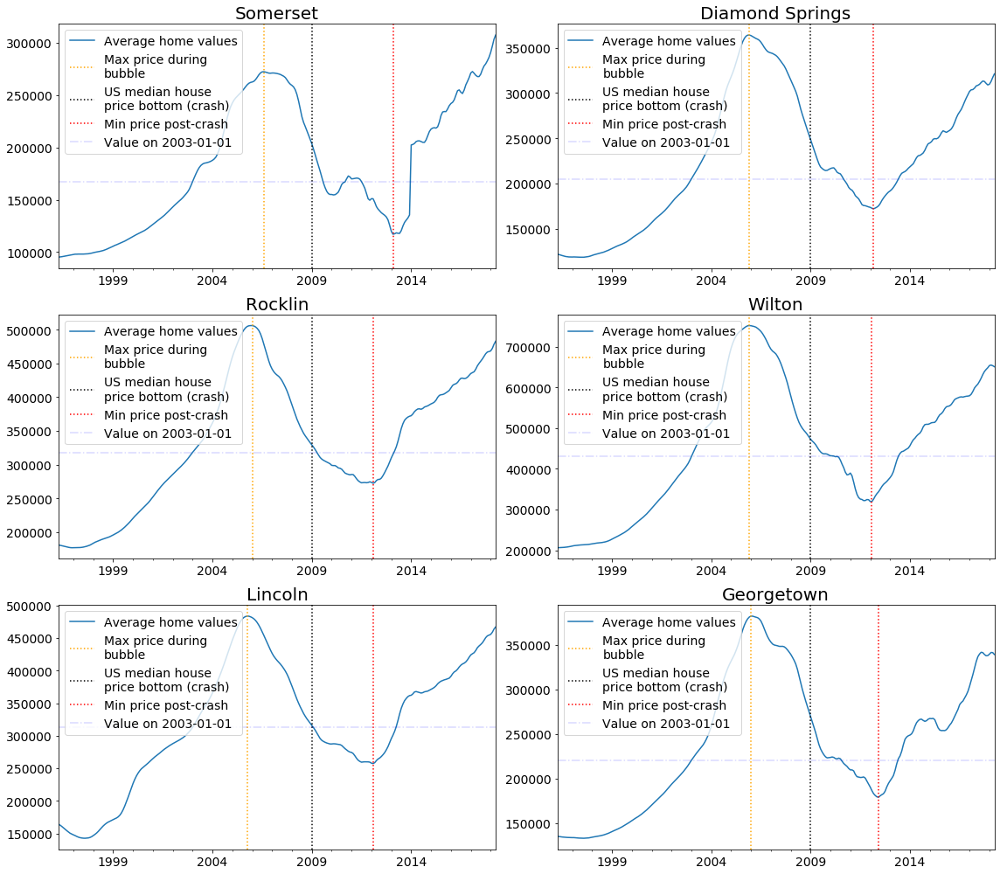

In [124]:
plot_ts_cities(df_sac_cities, sac_metro_cities[24:30], nrows = 3, ncols = 2, figsize=(16,14), col='value', legend=True)

(<Figure size 1152x1008 with 6 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x1c4d142940>)

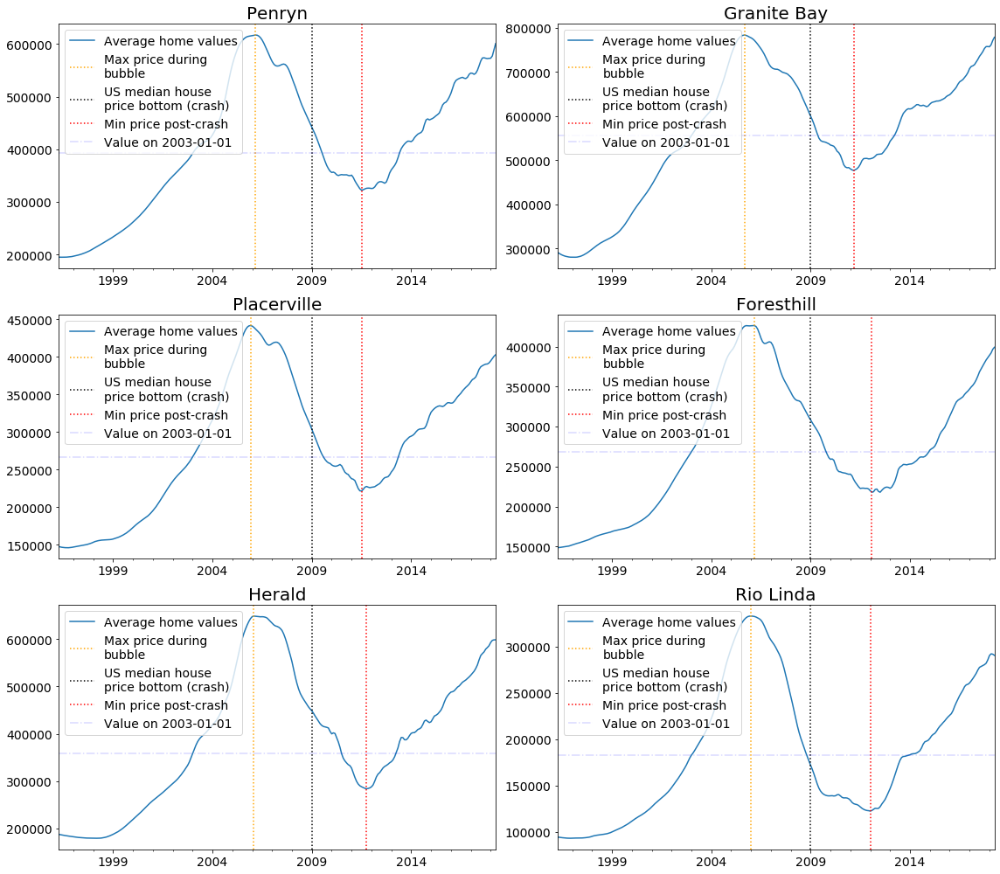

In [125]:
plot_ts_cities(df_sac_cities, sac_metro_cities[30:36], nrows = 3, ncols = 2, figsize=(16,14), col='value', legend=True)

(<Figure size 1152x1008 with 6 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x1c1f2a2438>)

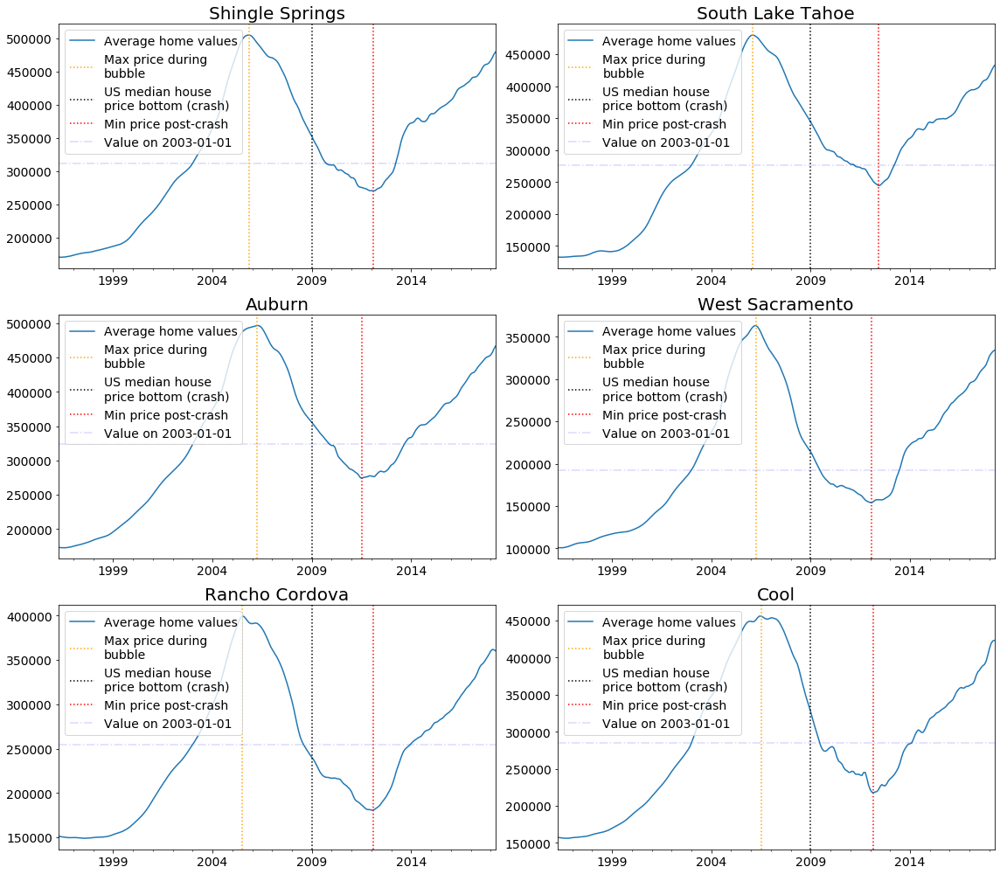

In [126]:
plot_ts_cities(df_sac_cities, sac_metro_cities[36:42], nrows = 3, ncols = 2, figsize=(16,14), col='value', legend=True)

(<Figure size 1152x1008 with 6 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x1cad7f0dd8>)

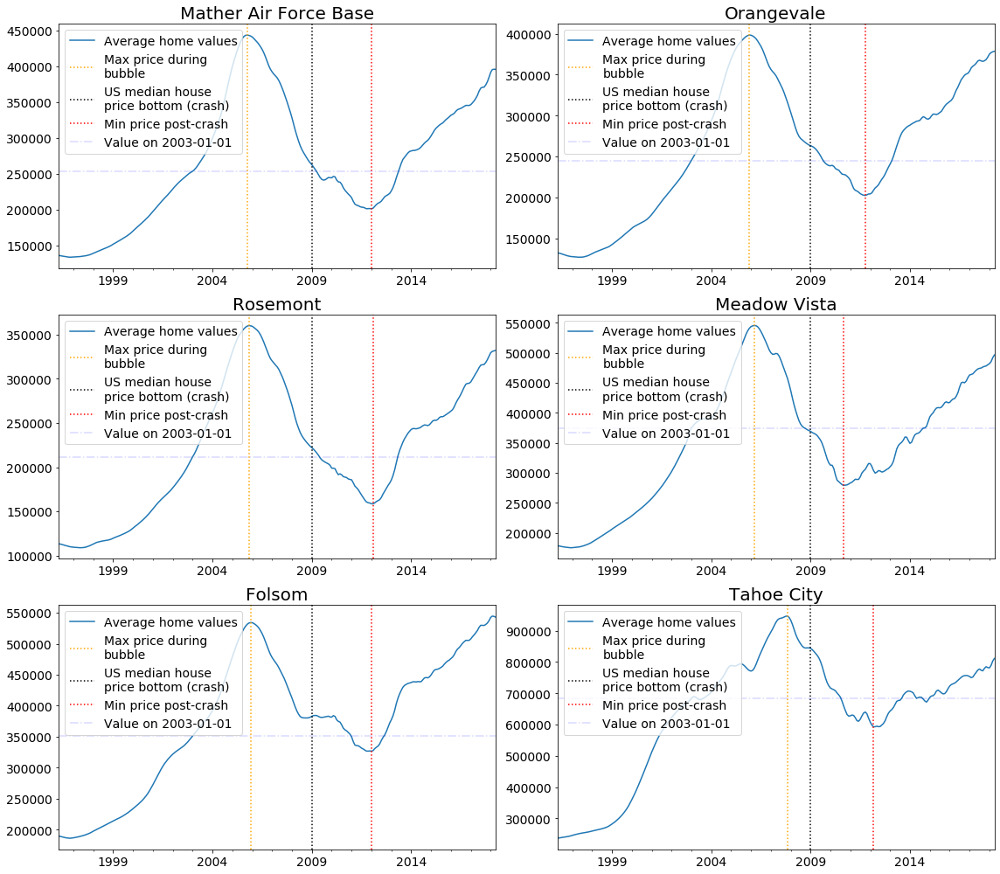

In [127]:
plot_ts_cities(df_sac_cities, sac_metro_cities[42:48], nrows = 3, ncols = 2, figsize=(16,14), col='value', legend=True)

(<Figure size 1152x1008 with 6 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x1c674c9e48>)

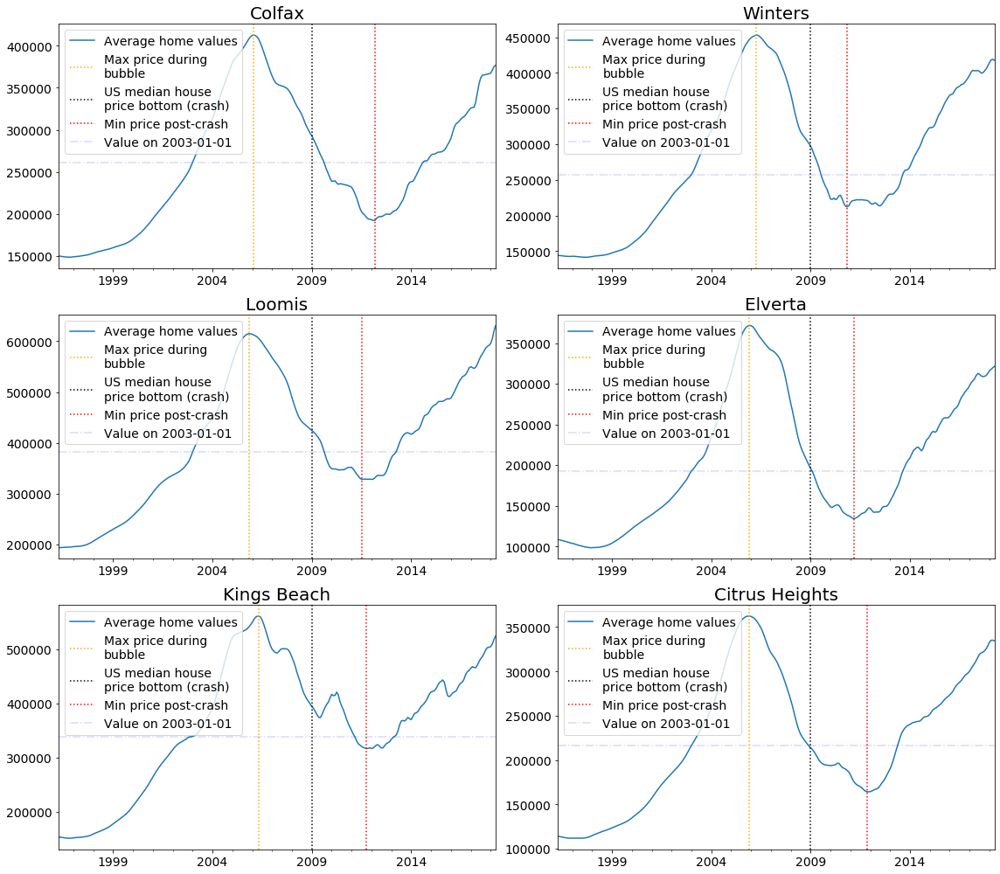

In [128]:
plot_ts_cities(df_sac_cities, sac_metro_cities[48:54], nrows = 3, ncols = 2, figsize=(16,14), col='value', legend=True)

(<Figure size 1152x1008 with 2 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x1c1f597518>)

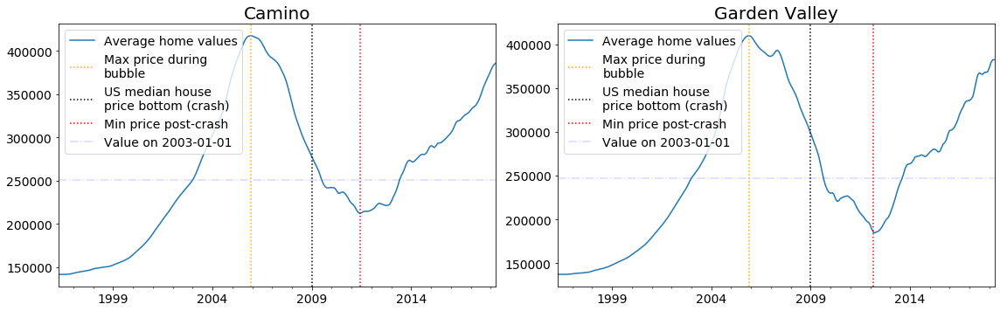

In [129]:
plot_ts_cities(df_sac_cities, sac_metro_cities[54:56], nrows = 3, ncols = 2, figsize=(16,14), col='value', legend=True)

### Plots of zip codes within City of Sacramento

In [130]:
df_sacto_city_zips = df_sac.loc[df_sac['City'] == 'Sacramento']
df_sacto_city_zips.head()

,Metro,MetroState,CountyName,City,Zip,value
time,,,,,,
1996-04-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95660,73200.0
1996-05-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95660,72500.0
1996-06-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95660,71900.0
1996-07-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95660,71300.0
1996-08-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95660,70700.0


In [131]:
df_sacto_city_zips['Zip'].value_counts()

95811    265
95833    265
95818    265
95822    265
95823    265
95819    265
95824    265
95841    265
95835    265
95832    265
95831    265
95660    265
95829    265
95816    265
95817    265
95843    265
95834    265
95838    265
95820    265
95842    265
95815     58
Name: Zip, dtype: int64

In [132]:
sacto_zips = list(set(df_sacto_city_zips['Zip']))
len(sacto_zips)

21

In [133]:
ts = df_sacto_city_zips['value'].loc[df_sacto_city_zips['Zip'] == '95823']
ts.head()

time
1996-04-01    91500.0
1996-05-01    90800.0
1996-06-01    90000.0
1996-07-01    89200.0
1996-08-01    88400.0
Name: value, dtype: float64

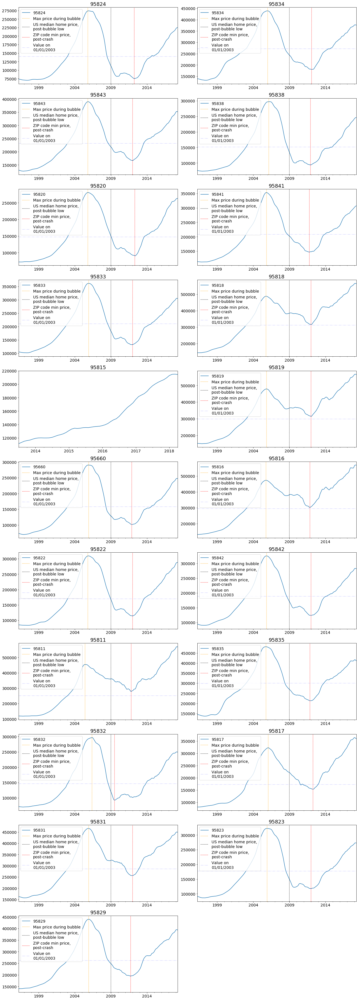

In [134]:
fig, ax = plot_ts_zips(df_sac, sacto_zips, nrows=11, ncols=2, figsize=(18, 50), legend=True);


### Plotting cities and zip codes within Sacramento Metro area 

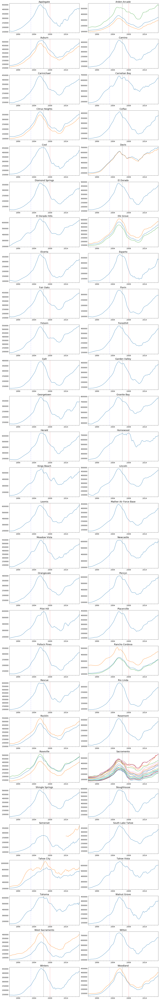

In [135]:
fig, ax = plot_ts_zips_by_city(df_sac, dict_sac_zips_cities, figsize=(18, 120), nrows=30, ncols=2, legend=False);


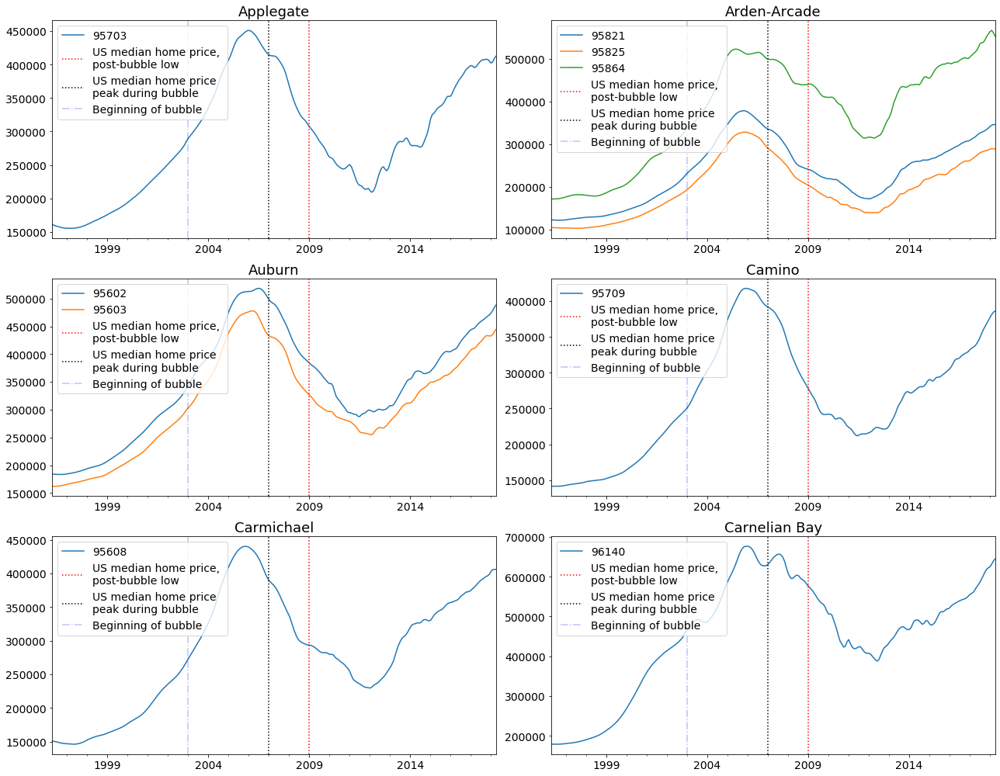

In [136]:
fig, ax = plot_ts_zips_by_city(df_sac, dict_0_6, figsize=(18, 14), nrows=3, ncols=2, legend=True);

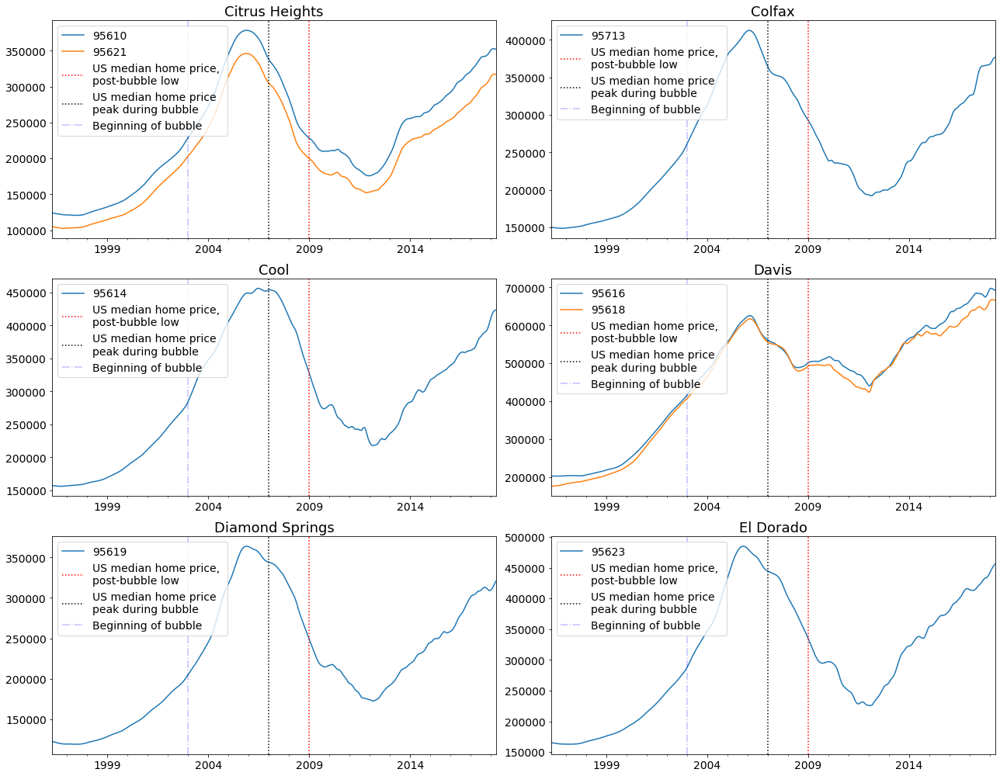

In [137]:
fig, ax = plot_ts_zips_by_city(df_sac, dict_6_12, figsize=(18, 14), nrows=3, ncols=2, legend=True);

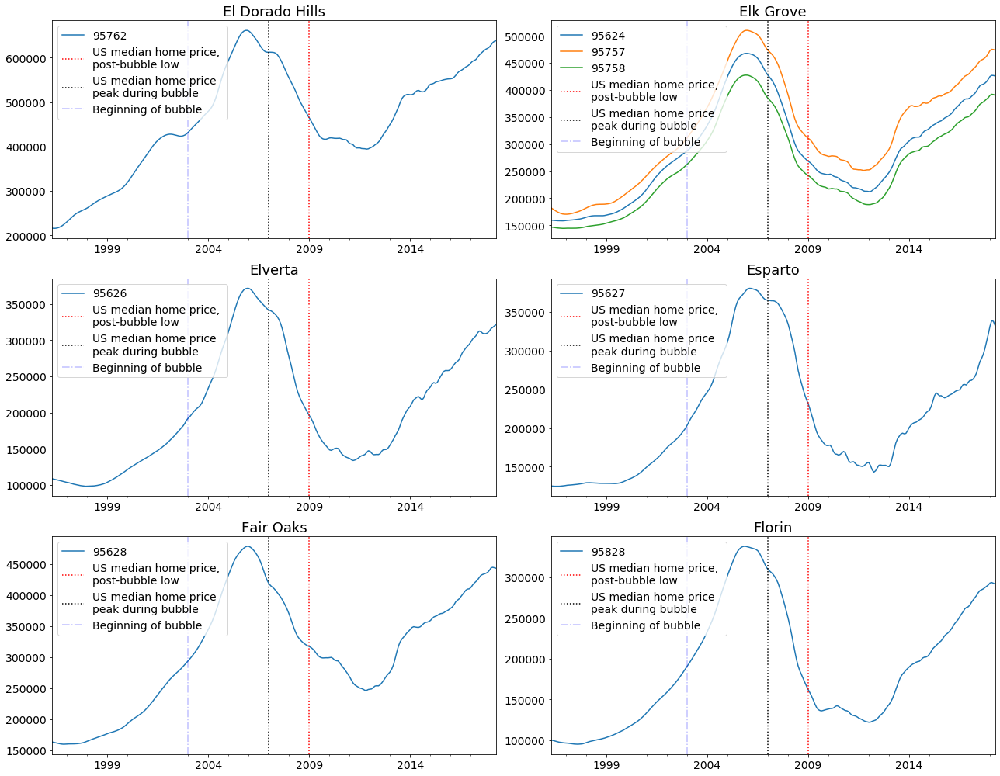

In [138]:
fig, ax = plot_ts_zips_by_city(df_sac, dict_12_18, figsize=(18, 14), nrows=3, ncols=2, legend=True);

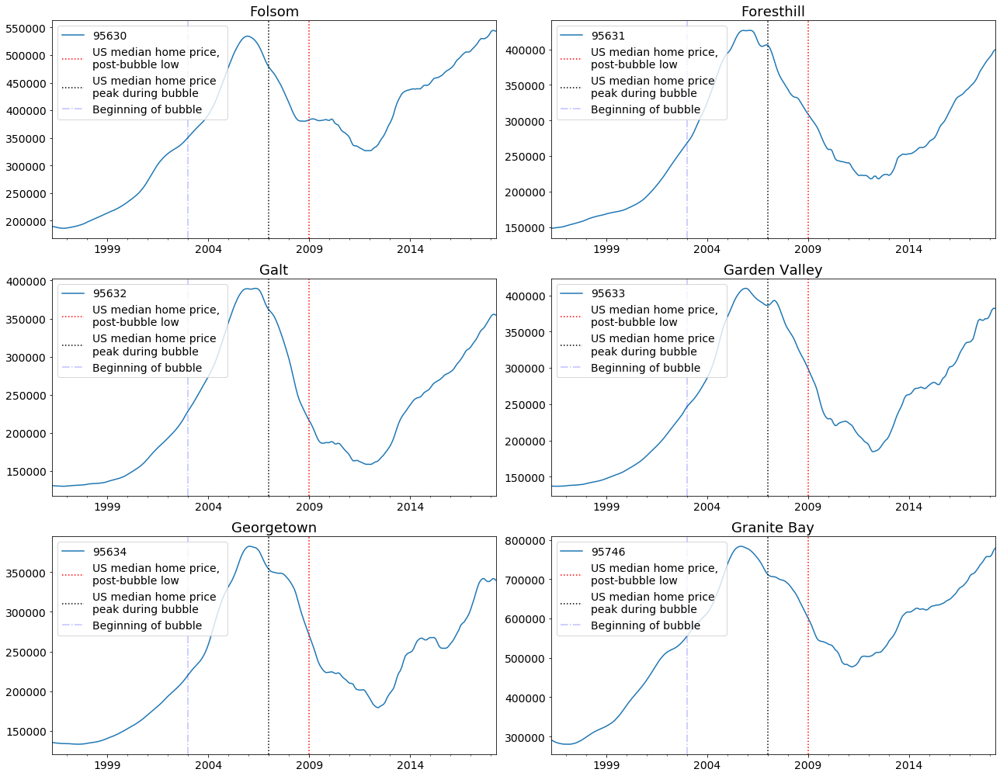

In [139]:
fig, ax = plot_ts_zips_by_city(df_sac, dict_18_24, figsize=(18, 14), nrows=3, ncols=2, legend=True);

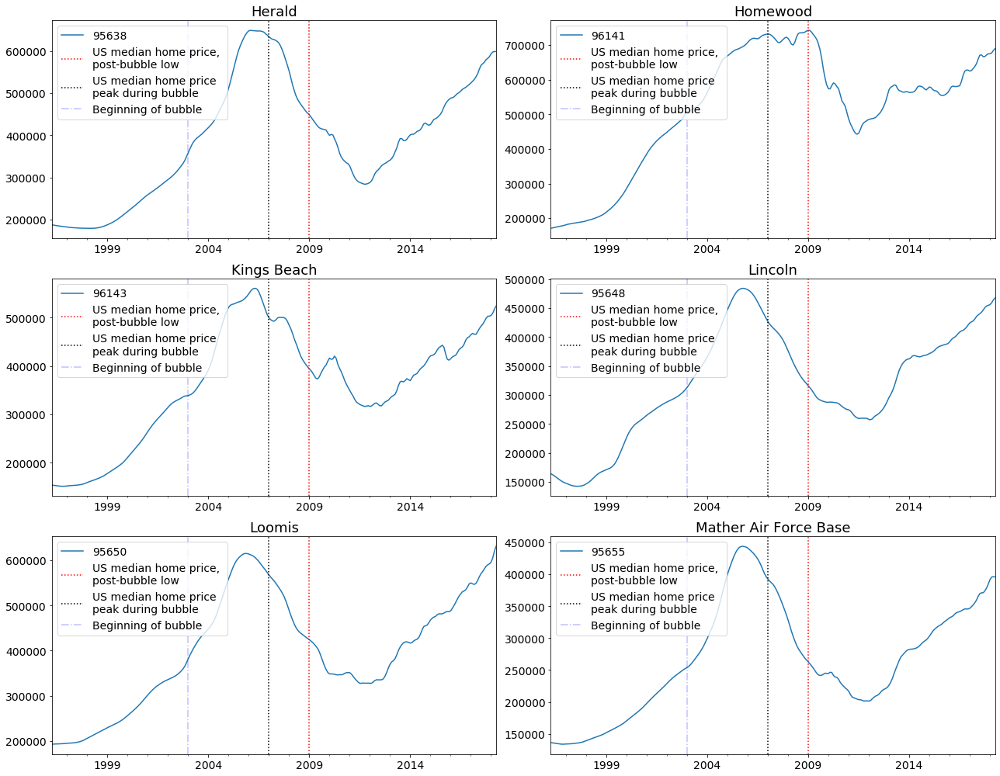

In [140]:
fig, ax = plot_ts_zips_by_city(df_sac, dict_24_30, figsize=(18, 14), nrows=3, ncols=2, legend=True);

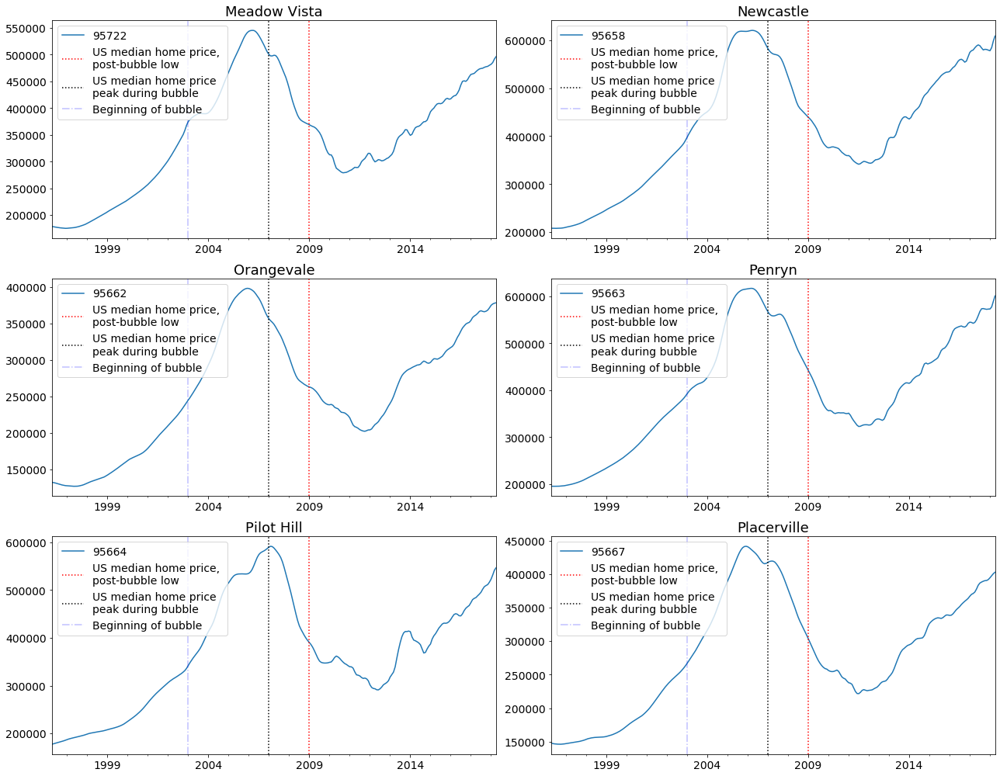

In [141]:
fig, ax = plot_ts_zips_by_city(df_sac, dict_30_36, figsize=(18, 14), nrows=3, ncols=2, legend=True);

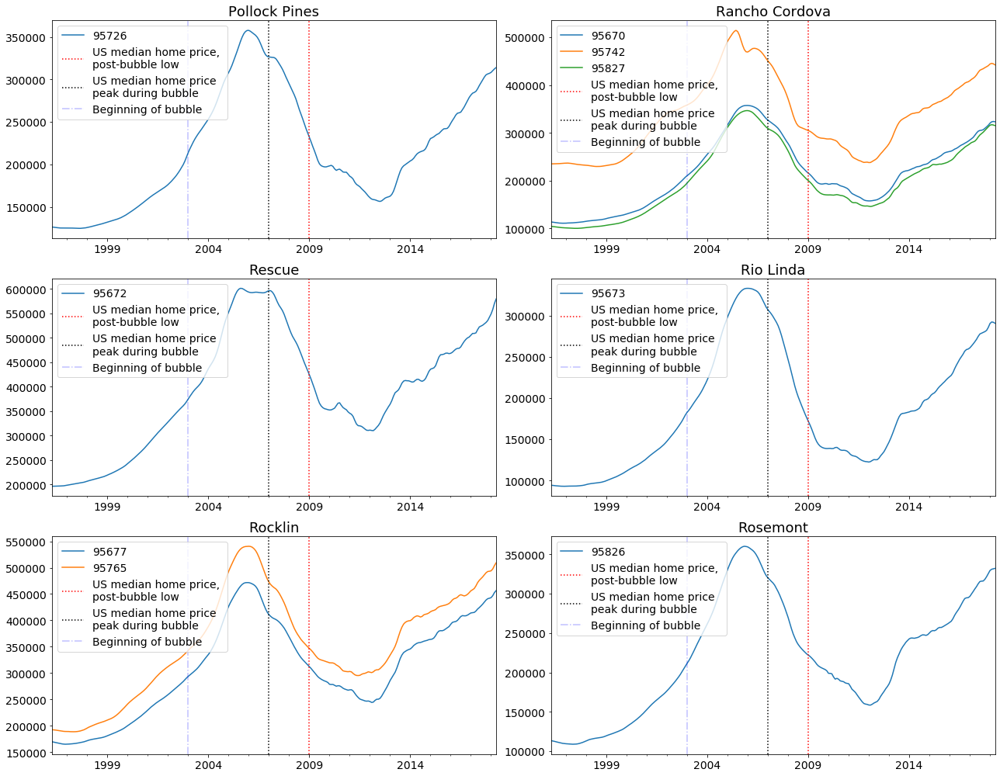

In [142]:
fig, ax = plot_ts_zips_by_city(df_sac, dict_36_42, figsize=(18, 14), nrows=3, ncols=2, legend=True);

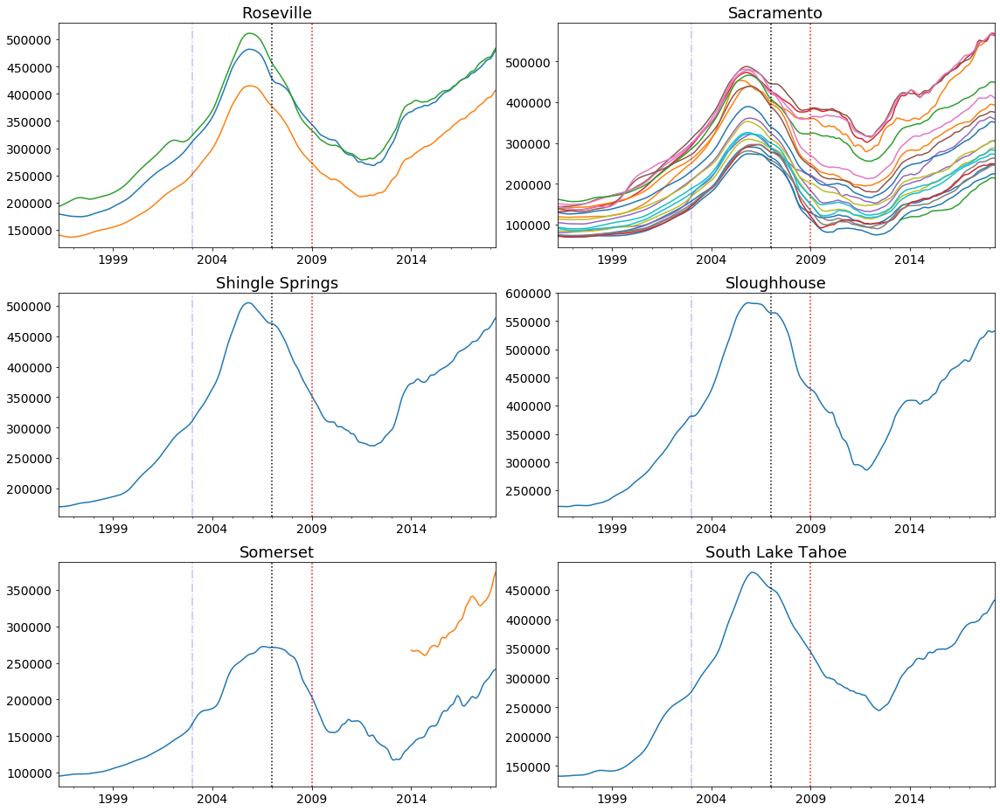

In [143]:
fig, ax = plot_ts_zips_by_city(df_sac, dict_42_48, figsize=(16, 13), nrows=3, ncols=2, legend=False);

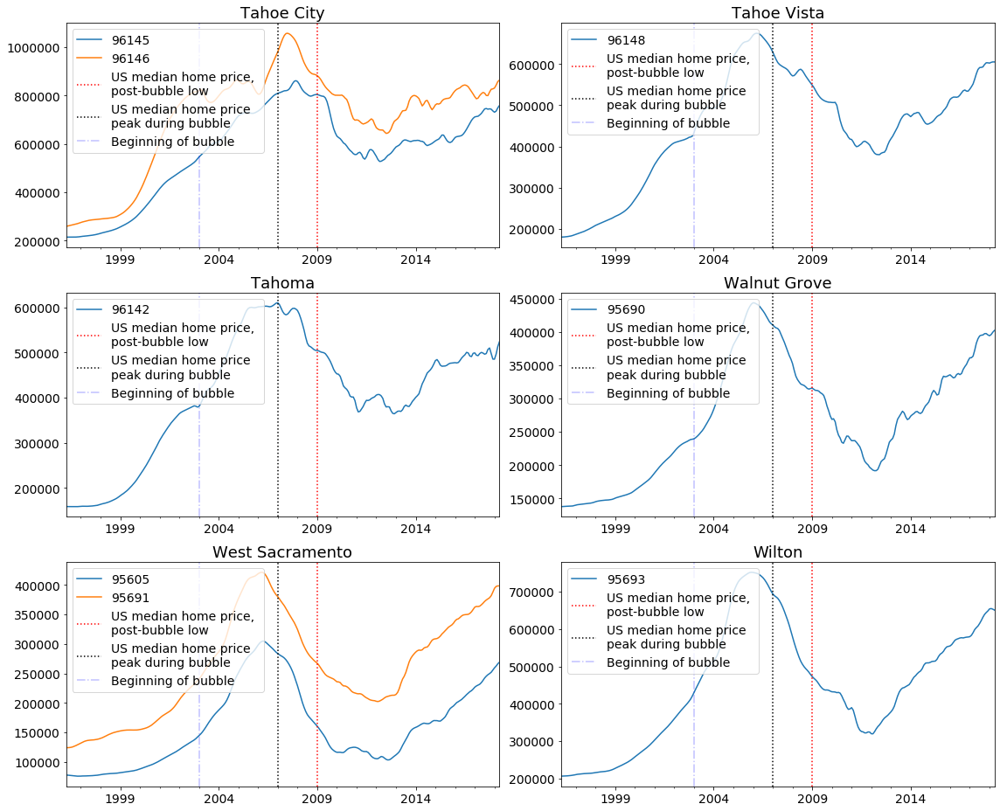

In [144]:
fig, ax = plot_ts_zips_by_city(df_sac, dict_48_54, figsize=(16, 13), nrows=3, ncols=2, legend=True);

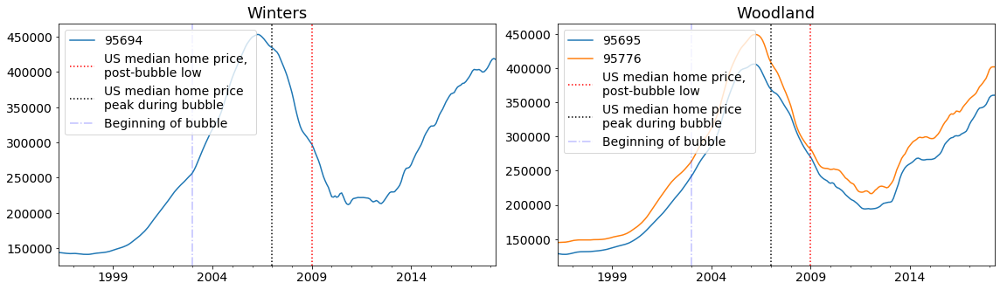

In [145]:
fig, ax = plot_ts_zips_by_city(df_sac, dict_54_56, figsize=(16, 13), nrows=3, ncols=2, legend=True);

### Plotting boxplots for each city in Sacto Metro region

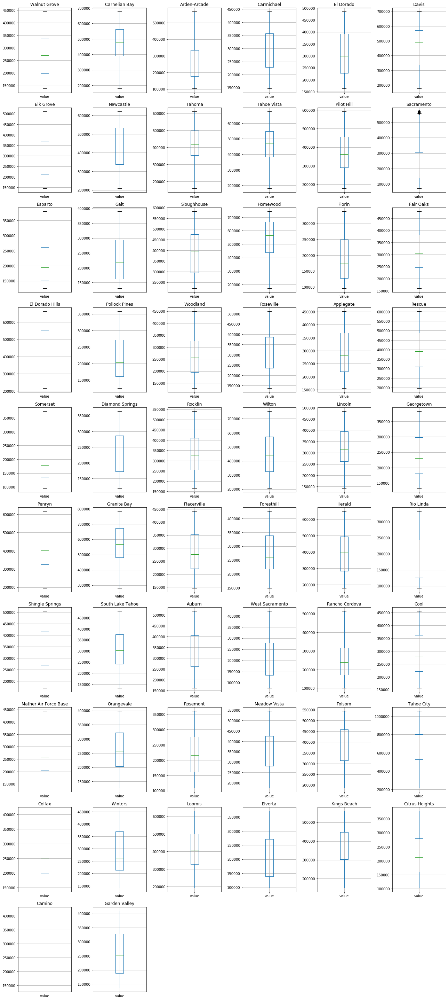

In [146]:
metro_cities_boxplot(df_sac, sac_metro_cities, nrows=10, ncols=6, figsize=(18, 40))


### Plotting boxplots for each zip in Sacramento metro region

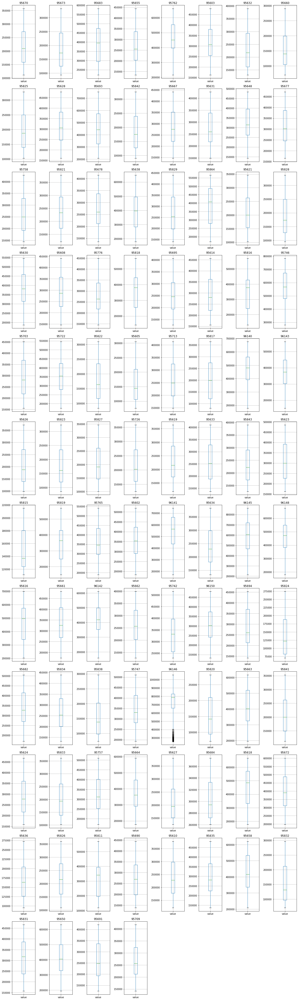

In [147]:
metro_zips_boxplot(df_sac, sac_metro_zips, nrows = 12, ncols=8, figsize=(18, 60))


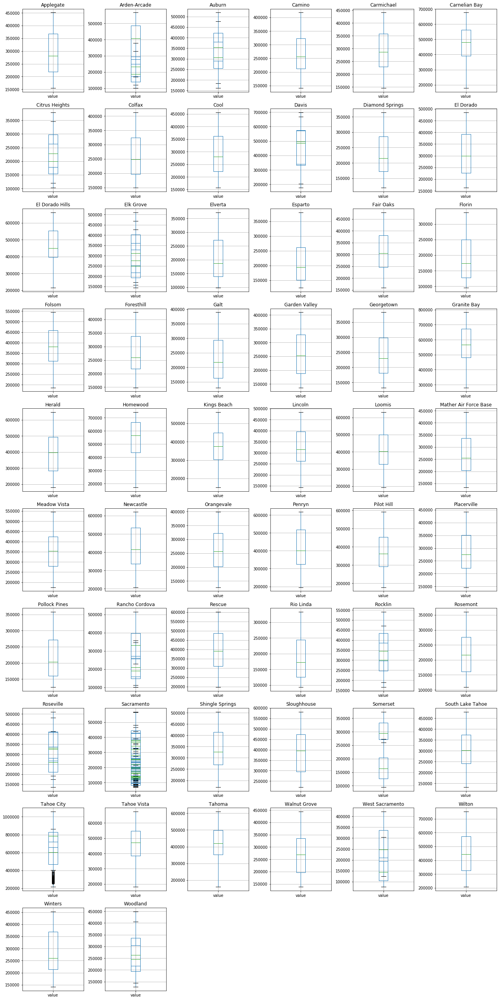

In [148]:
metro_cities_zips_boxplot(df_sac, dict_sac_zips_cities, nrows=14, ncols=6, figsize=(18, 50))


In [149]:
df_sac_city = df_sac.loc[df_sac['City'] == 'Sacramento']

df_sac_city.head()

,Metro,MetroState,CountyName,City,Zip,value
time,,,,,,
1996-04-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95660,73200.0
1996-05-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95660,72500.0
1996-06-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95660,71900.0
1996-07-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95660,71300.0
1996-08-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95660,70700.0


In [150]:
sacto_zips = list(set(df_sac_city['Zip']))
len(sacto_zips)


21

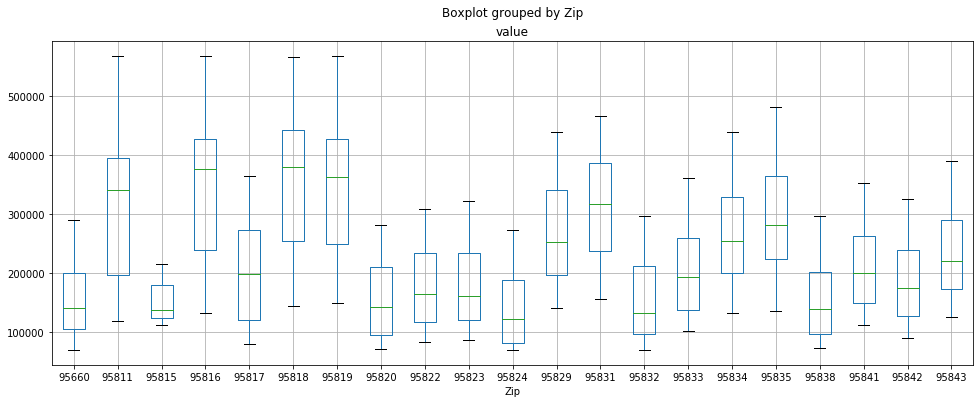

In [151]:
df_sac_city.boxplot(by='Zip', column = 'value', figsize=(16, 6))


### Violin plot for Sacramento city zip codes

In [152]:
import seaborn as sns


In [153]:
# got figure size  modification example from https://exceptionshub.com/how-do-i-change-the-figure-size-for-a-seaborn-plot.html

# fig, ax = plt.subplots()
# fig.set_size_inches(16, 6)
# sns.violinplot(x="Zip", y="value", data=df_44, scale="count", inner="stick", ax=ax)

def violin_plt(x, y, data, scale="width", inner="quartile", set_size_inches=(16, 6)):
    
    '''Plots zip codes within a city on one violin plot.  Set defaults to x='Zip', y='value', 
    data=df_sac_city, scale="width", inner="quartile", set_size_inches=(16, 6), ax=ax)
    '''
    
    import seaborn as sns
    fig, ax = plt.subplots()
    fig.set_size_inches
    sns.violinplot(x, y, data, scale, inner, ax)
    
    

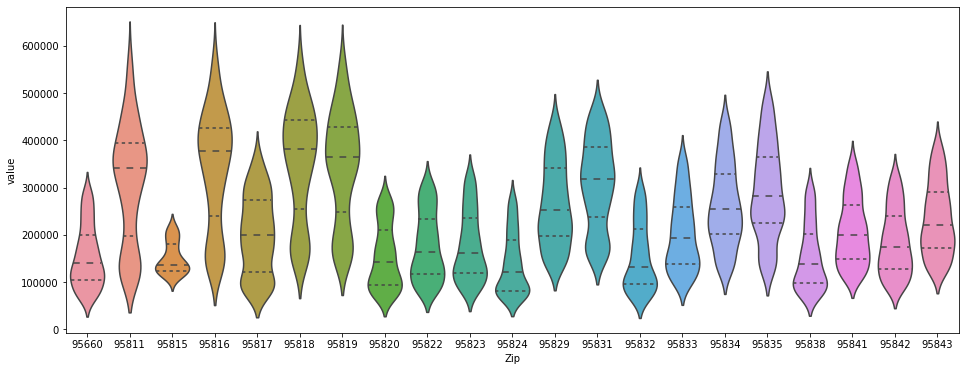

In [154]:
# got figure size  modification example from https://exceptionshub.com/how-do-i-change-the-figure-size-for-a-seaborn-plot.html

# fig, ax = plt.subplots()
# fig.set_size_inches(16, 6)
# sns.violinplot(x="Zip", y="value", data=df_44, scale="count", inner="stick", ax=ax)

import seaborn as sns

fig, ax = plt.subplots()
fig.set_size_inches(16, 6)
sns.violinplot(x="Zip", y="value", data=df_sac_city, scale="width", inner="quartile", ax=ax)

In [155]:
df_sac_city_1996_1999 = df_sac_city.loc['1996-04-01':'1999-12-01']
df_sac_city_1996_1999.tail()

,Metro,MetroState,CountyName,City,Zip,value
time,,,,,,
1999-08-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95843,146400.0
1999-09-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95843,147600.0
1999-10-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95843,149000.0
1999-11-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95843,150300.0
1999-12-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95843,151800.0


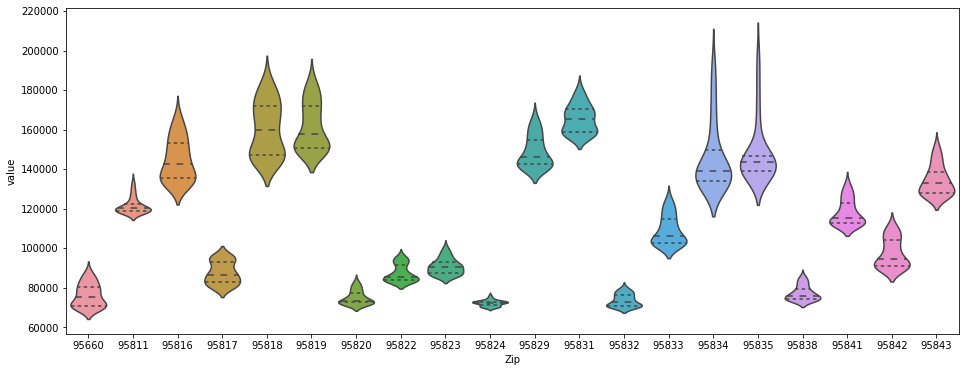

In [156]:
fig, ax = plt.subplots()
fig.set_size_inches(16, 6)
sns.violinplot(x="Zip", y="value", data=df_sac_city_1996_1999, scale="width", inner="quartile", ax=ax)

In [157]:
df_sac_city_2000_2003 = df_sac_city.loc['2000-01-01':'2003-12-01']
df_sac_city_2000_2003.head()

,Metro,MetroState,CountyName,City,Zip,value
time,,,,,,
2000-01-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95660,89100.0
2000-02-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95660,90100.0
2000-03-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95660,91200.0
2000-04-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95660,92200.0
2000-05-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95660,93300.0


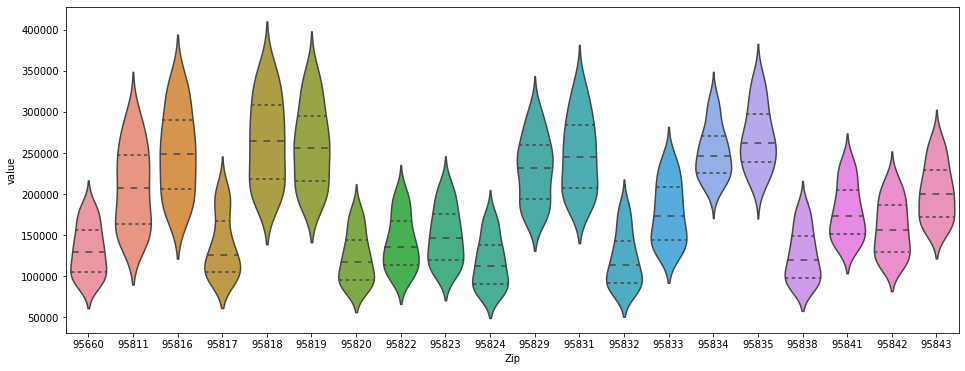

In [158]:
fig, ax = plt.subplots()
fig.set_size_inches(16, 6)
sns.violinplot(x="Zip", y="value", data=df_sac_city_2000_2003, scale="width", inner="quartile", ax=ax)

In [159]:
df_sac_city_2004_2006 = df_sac_city.loc['2004-01-01':'2006-12-01']
df_sac_city_2004_2006.head()

,Metro,MetroState,CountyName,City,Zip,value
time,,,,,,
2004-01-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95660,191900.0
2004-02-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95660,195700.0
2004-03-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95660,200200.0
2004-04-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95660,205300.0
2004-05-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95660,211100.0


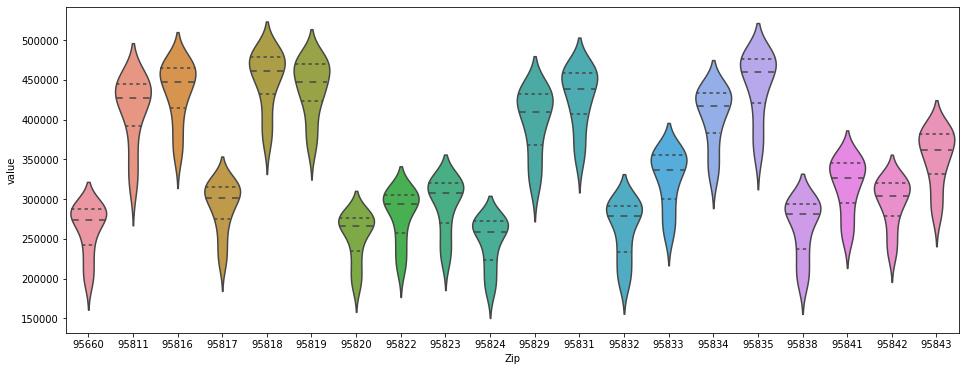

In [160]:
fig, ax = plt.subplots()
fig.set_size_inches(16, 6)
sns.violinplot(x="Zip", y="value", data=df_sac_city_2004_2006, scale="width", inner="quartile", ax=ax)

In [161]:
df_sac_city_2007_2012 = df_sac_city.loc['2007-01-01':'2012-12-01']
df_sac_city_2007_2012.head()

,Metro,MetroState,CountyName,City,Zip,value
time,,,,,,
2007-01-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95660,264800.0
2007-02-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95660,263000.0
2007-03-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95660,261000.0
2007-04-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95660,258400.0
2007-05-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95660,254800.0


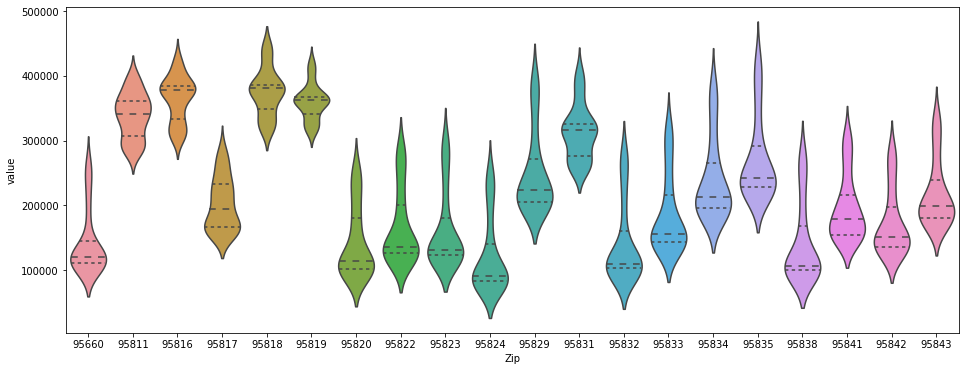

In [162]:
fig, ax = plt.subplots()
fig.set_size_inches(16, 6)
sns.violinplot(x="Zip", y="value", data=df_sac_city_2007_2012, scale="width", inner="quartile", ax=ax)

In [163]:
df_sac_city_2013_2018 = df_sac_city.loc['2013-01-01':'2018']
df_sac_city_2013_2018.tail()

,Metro,MetroState,CountyName,City,Zip,value
time,,,,,,
2017-12-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95843,345600.0
2018-01-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95843,350100.0
2018-02-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95843,352500.0
2018-03-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95843,352400.0
2018-04-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95843,351400.0


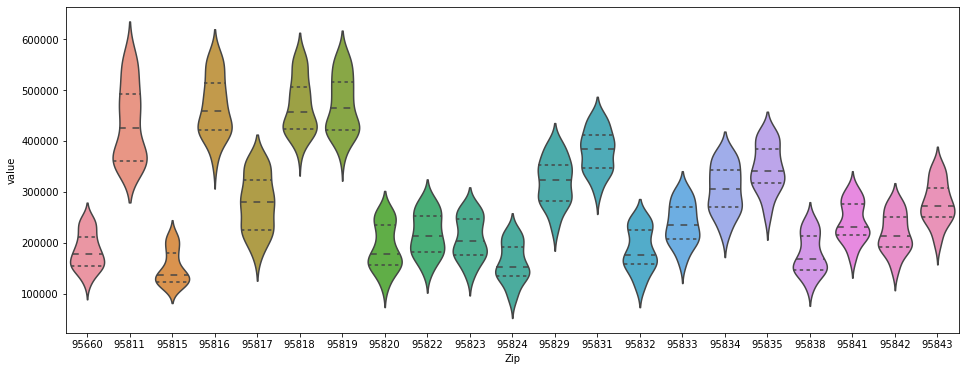

In [164]:
fig, ax = plt.subplots()
fig.set_size_inches(16, 6)
sns.violinplot(x="Zip", y="value", data=df_sac_city_2013_2018, scale="width", inner="quartile", ax=ax)

# Step 4:  ARIMA Modeling

## Setting up functions for running ARIMA models

In [77]:
import warnings
from statsmodels.tsa.arima_model import ARIMA
import statsmodels.api as sm
from sklearn.metrics import mean_squared_error


## Parameter fine-tuning function

### Creating p, d, q, and m values for running ARIMA model

In [78]:
# evaluate parameters
p_values = [0, 1, 2, 4, 6, 8, 10]
d_values = range(0, 3)
q_values = range(0, 3)
warnings.filterwarnings("ignore")


In [79]:
# add each order tuple and mse to lists to create a table of the results

# order_tuples = []
# mse_results = []

# evaluate an ARIMA model for a given order (p,d,q)
def evaluate_arima_model(X, arima_order):
    # prepare training dataset
    train_size = int(len(X) * 0.66)
    train, test = X[0:train_size], X[train_size:]
    history = [x for x in train]
    # make predictions
    predictions = list()
    for t in range(len(test)):
        model = ARIMA(history, order=arima_order)
        model_fit = model.fit(disp=0)
        yhat = model_fit.forecast()[0]
        predictions.append(yhat)
        history.append(test[t])
    # calculate out of sample error
    error = mean_squared_error(test, predictions)
    return error

def eval_params_and_lists(dataset, p_values, d_values, q_values):
    order_tuples = []
    mse_results = []
    dataset = dataset.astype('float32')
    best_score, best_cfg = float("inf"), None
    for p in p_values:
        for d in d_values:
            for q in q_values:
                order = (p,d,q)
                try:
                    mse = evaluate_arima_model(dataset, order)
                    order_tuples.append(order)
                    mse_results.append(mse)
                    if mse < best_score:
                        best_score, best_cfg = mse, order
                    print('ARIMA%s MSE=%.3f' % (order,mse))
                except:
                    continue
    print('Best ARIMA%s MSE=%.3f' % (best_cfg, best_score))
    return order_tuples, mse_results, best_cfg, best_score   # adding to Jeff's function; output will be taken into forecast function that follows



# Step 5: Functions for Interpreting Results

## Elements of ARIMA model fit, forecast, and summary


### Create ARIMA model show summary results table

In [80]:
# Define function

def arima_zipcode(ts, order):
    ts_value = ts.value
    model = ARIMA(ts_value, order)
    model_fit = model.fit(disp=0)
    print(model_fit.summary())
    return model_fit

# model_fit = arima_zipcode(ts_values, order = order)

### Create forecast model

In [81]:
# Define function

def forecast(model_fit, months=24, confint=2):
    forecast = model_fit.forecast(months)
    actual_forecast = forecast[0]
    std_error = forecast[1]
    forecast_confint = forecast[confint]
    return actual_forecast, std_error, forecast_confint   

# actual_forecast, std_error, forecast_confint = forecast(model_fit)

### Create dataframe to hold these values and join to existing dataframe

In [82]:
# Define function

def forecast_df(actual_forecast, forecast_confint, std_error, col = 'time', 
                daterange = pd.date_range(start='2018-05-01', end='2020-04-01', freq='MS')):
    df_forecast = pd.DataFrame({col: daterange})
    df_forecast['forecast'] = actual_forecast
    df_forecast['forecast_lower'] = forecast_confint[:, 0]
    df_forecast['forecast_upper'] = forecast_confint[:, 1]
    df_forecast['standard error'] = std_error
    df_forecast.set_index('time', inplace=True)
    return df_forecast


### Create df_new with historical and forecasted values

In [83]:
def concat_values_forecast(ts, df_forecast):
    df_new = pd.concat([ts, df_forecast])
    df_new = df_new.rename(columns = {0: 'value'})
    return df_new

### Plot forecast results

In [84]:
def plot_forecast(df_new, geog_area, figsize=(12,8)):
    fig = plt.figure(figsize=figsize)
    plt.plot(df_new['value'], label='Raw Data')
    plt.plot(df_new['forecast'], label='Forecast')
    plt.fill_between(df_new.index, df_new['forecast_lower'], df_new['forecast_upper'], color='k', alpha = 0.2, 
                 label='Confidence Interval')
    plt.legend(loc = 'upper left')
    plt.title(f'Forecast for {geog_area}')


### Figure out percent change in home values

In [85]:
def forecast_values(df_new, date = '2020-04-01'):
    forecasted_price = df_new.loc[date, 'forecast']
    forecasted_lower = df_new.loc[date, 'forecast_lower']
    forecasted_upper = df_new.loc[date, 'forecast_upper']    
    return forecasted_price, forecasted_lower, forecasted_upper


### Compute and print predicted, best, and worst case scenarios

In [86]:
def pred_best_worst(pred, low, high, last):
    
    '''Prints out predicted, best-case, and worst-case scencarios from forecast'''
    
    pred_pct_change = (((pred - last) / last) * 100)
    print(f'By the model prediction, I would expect to see a {round(pred_pct_change, 3)}% change in price by April 1, 2020.')
    print(type(pred_pct_change))
    lower_pct_change = (((low - last) / last) * 100)
    print(f'At the lower bound of the confidence interval, I would expect to see a {round(lower_pct_change, 3)}% change in price by April 1, 2020.')
    print(type(lower_pct_change))
    upper_pct_change = (((high - last) / last) * 100)
    print(f'At the upper bound of the confidence interval, I would expect to see a {round(upper_pct_change, 3)}% change in price by April 1, 2020.')
    print(type(upper_pct_change))
    return round(pred_pct_change, 3), round(lower_pct_change, 3), round(upper_pct_change, 3)
        

## Function to perform ARIMA modeling and display forecast results

In [448]:
# original function  -- unfortunately, this one throws an error when I set run_pdq=True

p_values = [0, 1, 2, 4, 6, 8, 10]
d_values = range(0, 3)
q_values = range(0, 3)

def arima_forecast(ts, geog_area, city, county, p_values, d_values, q_values, best_pdq, confint=2, run_pdq = False):     # months = 24 by default
    
    '''This function attempts to combine the steps of the ARIMA process, starting with parameter fine tuning and
    going all the way through the steps following (ARIMA model fit, forecast, computing percentage changes 
    for each of the forecast values, plotting of historical values and projected values, and printing out 
    the forecasted results.  
    It also appends the lists set up to capture each model's output for a summary dataframe table.
    (Unforunately, this function throws an error if run_pdq is set = True.)'''

    
    # evaluate parameters
    print(f'For {geog_area} ({city}):')
    p_values = [0, 1, 2, 4, 6, 8, 10]
    d_values = range(0, 3)
    q_values = range(0, 3)
    warnings.filterwarnings("ignore")
    
    if run_pdq:
        best_cfg, best_score = eval_arima_models(ts, p_values, d_values, q_values)     # returns order (variable best_cfg)
        order = best_cfg
    else:
        order = best_pdq
        
    print(f'Best ARIMA order = {order}')
    model_fit = arima_zipcode(ts, order)                                # returns model_fit
    actual_forecast, forecast_confint, std_error = forecast(model_fit)  # returns actual_forecast, forecast_confint, std_error
    df_forecast = forecast_df(actual_forecast, std_error, forecast_confint, col = 'time',     # returns df_forecast with future predictions
                              daterange = pd.date_range(start='2018-05-01', end='2020-04-01', freq='MS'))
    df_new = concat_values_forecast(ts, df_forecast)                    # concatenates historical and forecasted values into df_new
    plot_forecast(df_new, geog_area)                            # plots forecast with the label of geog_area
    forecasted_price, forecasted_lower, forecasted_upper = forecast_values(df_new, date = '2020-04-01')   # returns forecasted_price, forecasted_lower, forecasted_upper
    pred = forecasted_price
    low = forecasted_lower
    high = forecasted_upper
    last = df_new['value'].loc['2018-04-01']
    pred_pct_change = (((pred - last) / last) * 100)
    lower_pct_change = (((low - last) / last) * 100)
    upper_pct_change = (((high - last) / last) * 100)
       
    geog_areas.append(geog_area)
    cities.append(city)
    counties.append(county)
    orders.append(order)
    predicted_prices.append(round(forecasted_price, 2))
    lower_bound_prices.append(round(forecasted_lower, 2))
    upper_bound_prices.append(round(forecasted_upper, 2))
    last_values.append(last)
    pred_pct_changes.append(round(pred_pct_change, 2))
    lower_pct_changes.append(round(lower_pct_change, 2))
    upper_pct_changes.append(round(upper_pct_change, 2))
    
    print(f'By the model prediction, I would expect to see a {round(pred_pct_change, 3)}% change in price by April 1, 2020.')
    print(f'At the lower bound of the confidence interval, I would expect to see a {round(lower_pct_change, 3)}% change in price by April 1, 2020.')
    print(f'At the upper bound of the confidence interval, I would expect to see a {round(upper_pct_change, 3)}% change in price by April 1, 2020.')

    return geog_areas, cities, counties, orders, predicted_prices, lower_bound_prices, upper_bound_prices, last_values, pred_pct_changes, lower_pct_changes, upper_pct_changes


### ARIMA forecast function -- don't run parameter optimization

In [447]:
def arima_forecast_enter_pdq(ts, geog_area, city, county, best_cfg, confint=2):     # months = 24 by default
    
    '''This function combines the steps of the ARIMA process, starting with ARIMA model fit, forecast 
    (predicted values, upper-bound values,and lower-bound values, determined by confidence intervals), 
    percentage changes for each of the forecast values over time, final values at the end of the 
    forecast period, plotting of historical values and projected values, and a printout of the forecasted 
    results.  It also appends the lists set up to capture each model's output for a summary dataframe table.'''
    
    # evaluate parameters
    print(f'For {geog_area} ({city}):')

    warnings.filterwarnings("ignore")
    order = best_cfg
    print(f'Best ARIMA order = {order}')
    model_fit = arima_zipcode(ts, order)                                # returns model_fit
    actual_forecast, forecast_confint, std_error = forecast(model_fit)  # returns actual_forecast, forecast_confint, std_error
    df_forecast = forecast_df(actual_forecast, std_error, forecast_confint, col = 'time',     # returns df_forecast with future predictions
                              daterange = pd.date_range(start='2018-05-01', end='2020-04-01', freq='MS'))
    df_new = concat_values_forecast(ts, df_forecast)                    # concatenates historical and forecasted values into df_new
    plot_forecast(df_new, geog_area)                            # plots forecast with the label of geog_area
    forecasted_price, forecasted_lower, forecasted_upper = forecast_values(df_new, date = '2020-04-01')   # returns forecasted_price, forecasted_lower, forecasted_upper
    pred = forecasted_price
    low = forecasted_lower
    high = forecasted_upper
    last = df_new['value'].loc['2018-04-01']
    pred_pct_change = (((pred - last) / last) * 100)
    lower_pct_change = (((low - last) / last) * 100)
    upper_pct_change = (((high - last) / last) * 100)
       
    geog_areas.append(geog_area)
    cities.append(city)
    counties.append(county)
    orders.append(order)
    predicted_prices.append(round(forecasted_price, 2))
    lower_bound_prices.append(round(forecasted_lower, 2))
    upper_bound_prices.append(round(forecasted_upper, 2))
    last_values.append(last)
    pred_pct_changes.append(round(pred_pct_change, 2))
    lower_pct_changes.append(round(lower_pct_change, 2))
    upper_pct_changes.append(round(upper_pct_change, 2))
    
    print(f'By the model prediction, I would expect to see a {round(pred_pct_change, 3)}% change in price by April 1, 2020.')
    print(f'At the lower bound of the confidence interval, I would expect to see a {round(lower_pct_change, 3)}% change in price by April 1, 2020.')
    print(f'At the upper bound of the confidence interval, I would expect to see a {round(upper_pct_change, 3)}% change in price by April 1, 2020.')

    return geog_areas, cities, counties, orders, predicted_prices, lower_bound_prices, upper_bound_prices, last_values, pred_pct_changes, lower_pct_changes, upper_pct_changes


### ARIMA forecast function -- don't append lists, don't run parameter optimization

In [449]:
# this is meant to check the report output without appending the lists that will create summary df

def arima_forecast_enter_pdq_no_listappend(ts, geog_area, city, county, best_cfg, confint=2):     # months = 24 by default
    
    '''This function combines the steps of the ARIMA process, starting with ARIMA model fit, forecast 
    (predicted values, upper-bound values,and lower-bound values, determined by confidence intervals), 
    percentage changes for each of the forecast values over time, final values at the end of the 
    forecast period, plotting of historical values and projected values, and a printout of the forecasted 
    results.  
    It does NOT append the lists set up to capture each model's output for a summary dataframe table.  It 
    provides a way to produce ARIMA model output again to check on the model when troubleshooting without
    appending results to the existing lists.'''

    
    # evaluate parameters
    print(f'For {geog_area} ({city}):')

    warnings.filterwarnings("ignore")
    order = best_cfg
    print(f'Best ARIMA order = {order}')
    model_fit = arima_zipcode(ts, order)                                # returns model_fit
    actual_forecast, forecast_confint, std_error = forecast(model_fit)  # returns actual_forecast, forecast_confint, std_error
    df_forecast = forecast_df(actual_forecast, std_error, forecast_confint, col = 'time',     # returns df_forecast with future predictions
                              daterange = pd.date_range(start='2018-05-01', end='2020-04-01', freq='MS'))
    df_new = concat_values_forecast(ts, df_forecast)                    # concatenates historical and forecasted values into df_new
    plot_forecast(df_new, geog_area)                            # plots forecast with the label of geog_area
    forecasted_price, forecasted_lower, forecasted_upper = forecast_values(df_new, date = '2020-04-01')   # returns forecasted_price, forecasted_lower, forecasted_upper
    pred = forecasted_price
    low = forecasted_lower
    high = forecasted_upper
    last = df_new['value'].loc['2018-04-01']
    pred_pct_change = (((pred - last) / last) * 100)
    lower_pct_change = (((low - last) / last) * 100)
    upper_pct_change = (((high - last) / last) * 100)
       
#     geog_areas.append(geog_area)
#     cities.append(city)
#     counties.append(county)
#     orders.append(order)
#     predicted_prices.append(round(forecasted_price, 2))
#     lower_bound_prices.append(round(forecasted_lower, 2))
#     upper_bound_prices.append(round(forecasted_upper, 2))
#     last_values.append(last)
#     pred_pct_changes.append(round(pred_pct_change, 2))
#     lower_pct_changes.append(round(lower_pct_change, 2))
#     upper_pct_changes.append(round(upper_pct_change, 2))
    
    print(f'By the model prediction, I would expect to see a {round(pred_pct_change, 3)}% change in price by April 1, 2020.')
    print(f'At the lower bound of the confidence interval, I would expect to see a {round(lower_pct_change, 3)}% change in price by April 1, 2020.')
    print(f'At the upper bound of the confidence interval, I would expect to see a {round(upper_pct_change, 3)}% change in price by April 1, 2020.')

#     return geog_areas, cities, counties, orders, predicted_prices, lower_bound_prices, upper_bound_prices, last_values, pred_pct_changes, lower_pct_changes, upper_pct_changes


### Function to create empty lists for storing results

In [90]:
#  Create empty lists to hold results (called by next function)

geog_areas = []
cities = []
counties = []
orders = []
predicted_prices = []
lower_bound_prices = [] 
upper_bound_prices = []
last_values = []
pred_pct_changes = []
lower_pct_changes = []
upper_pct_changes = []


In [91]:
def create_empty_lists():
    geog_areas = []
    cities = []
    counties = []
    orders = []
    predicted_prices = []
    lower_bound_prices = [] 
    upper_bound_prices = []
    last_values = []
    pred_pct_changes = []
    lower_pct_changes = []
    upper_pct_changes = []
    return geog_areas, cities, counties, orders, predicted_prices, lower_bound_prices, upper_bound_prices, last_values, pred_pct_changes, lower_pct_changes, upper_pct_changes


create_empty_lists()                # only run this command if you want to empty all lists

# geog_areas, cities, orders, predicted_prices, lower_bound_prices, upper_bound_prices, last_values, pred_pct_changes, lower_pct_changes, upper_pct_changes = create_empty_lists()
# geog_areas, cities, orders, predicted_prices, lower_bound_prices, upper_bound_prices, last_values, pred_pct_changes, lower_pct_changes, upper_pct_changes

([], [], [], [], [], [], [], [], [], [], [])

### Function to print results lists

In [92]:
#  prints all results lists as they currently stand

def print_results_lists():
    return geog_areas, cities, counties, orders, predicted_prices, lower_bound_prices, upper_bound_prices, last_values, pred_pct_changes, lower_pct_changes, upper_pct_changes

In [93]:
print_results_lists()

([], [], [], [], [], [], [], [], [], [], [])

### Function to pop last item off of each list (to remove last item if an analysis was done in error)

In [94]:
def pop_results_lists():
    geog_areas.pop()
    cities.pop()
    counties.pop()
    orders.pop()
    predicted_prices.pop()
    lower_bound_prices.pop() 
    upper_bound_prices.pop()
    last_values.pop()
    pred_pct_changes.pop()
    lower_pct_changes.pop()
    upper_pct_changes.pop()
    return geog_areas, cities, counties, orders, predicted_prices, lower_bound_prices, upper_bound_prices, last_values, pred_pct_changes, lower_pct_changes, upper_pct_changes


In [95]:
# pop_results_lists()

### Function to print length of each list (to make sure they're all the same length)

In [96]:
def print_lengths():
    print('geog_areas: ', len(geog_areas))
    print('cities: ', len(cities))
    print('counties', len(counties))
    print('orders: ', len(orders))
    print('predicted_prices: ', len(predicted_prices))
    print('lower_bound_prices: ', len(lower_bound_prices))
    print('upper_bound_prices: ', len(upper_bound_prices))
    print('last_values: ', len(last_values))
    print('pred_pct_changes: ', len(pred_pct_changes))
    print('lower_pct_changes: ', len(lower_pct_changes))
    print('upper_pct_changes: ', len(upper_pct_changes))
    

In [97]:
print_lengths()

geog_areas:  0
cities:  0
counties 0
orders:  0
predicted_prices:  0
lower_bound_prices:  0
upper_bound_prices:  0
last_values:  0
pred_pct_changes:  0
lower_pct_changes:  0
upper_pct_changes:  0


# Analysis by ZIP code

## SacMetro: 95616 (Davis) 

### Set up dataframe

In [98]:
geog_area = '95616'

In [99]:
city = 'Davis'

In [100]:
county = 'Yolo'

In [101]:
ts = df_sac.loc[df_sac['Zip'] == geog_area]

In [102]:
ts = ts.resample('MS').asfreq()

In [103]:
ts.head()

,Metro,MetroState,CountyName,City,Zip,value
time,,,,,,
1996-04-01,Sacramento,Sacramento CA,Yolo,Davis,95616,202500.0
1996-05-01,Sacramento,Sacramento CA,Yolo,Davis,95616,202500.0
1996-06-01,Sacramento,Sacramento CA,Yolo,Davis,95616,202500.0
1996-07-01,Sacramento,Sacramento CA,Yolo,Davis,95616,202500.0
1996-08-01,Sacramento,Sacramento CA,Yolo,Davis,95616,202500.0


### Visualizations

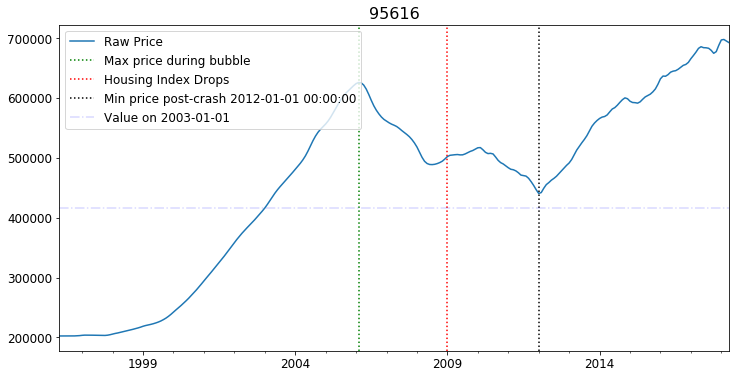

In [104]:
plot_single_geog(df_melt, geog_area, 'value', 'Zip', figsize=(12, 6), fontsize1=12, fontsize2=16)

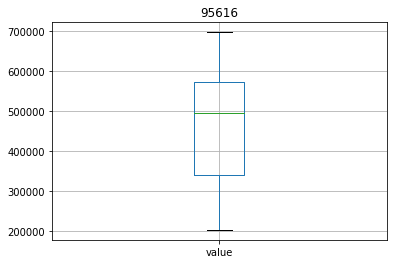

In [105]:
ts.boxplot(column = 'value')
plt.title(geog_area);


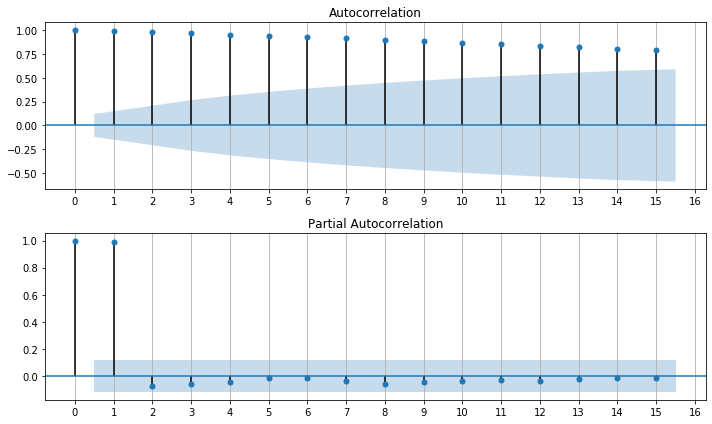

In [106]:
plot_acf_pacf(ts.value)

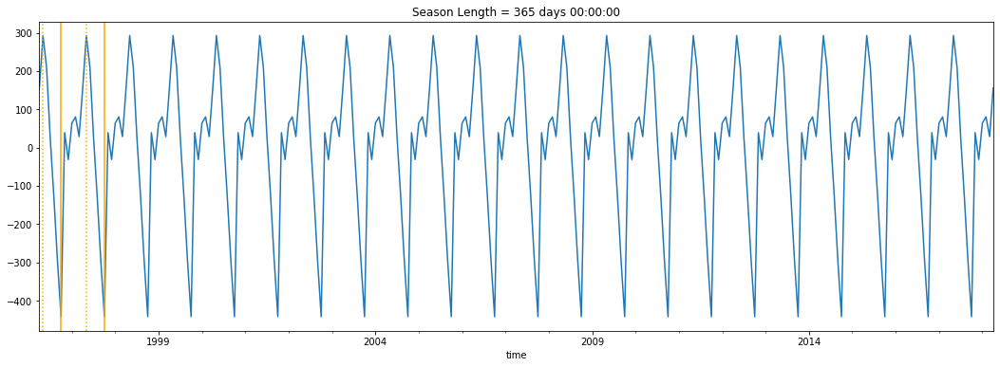

In [107]:
plot_seasonal_decomp(ts.value);

# Note that seasonality isn't much of a factor here; maximum difference of about $700 over the course of a year

### ARIMA parameters tuning

In [108]:
p_values = [0, 1, 2, 4, 6, 8, 10]
d_values = range(0, 3)
q_values = range(0, 3)


In [159]:
# order_tuples_95616, mse_results_95616, best_cfg_95616, best_score_95616 = eval_params_and_lists(ts.value, p_values, d_values, q_values)

# Best ARIMA(2, 1, 2) MSE=3480557.249

ARIMA(0, 0, 0) MSE=24974935922.079
ARIMA(0, 0, 1) MSE=6346342368.554
ARIMA(0, 1, 0) MSE=15920047.965
ARIMA(0, 1, 1) MSE=6483236.024
ARIMA(0, 2, 0) MSE=6375114.694
ARIMA(0, 2, 1) MSE=4649116.158
ARIMA(1, 0, 0) MSE=20371207.793
ARIMA(1, 1, 0) MSE=6061836.297
ARIMA(1, 1, 2) MSE=3885885.770
ARIMA(1, 2, 0) MSE=6014568.045
ARIMA(1, 2, 1) MSE=4789542.085
ARIMA(2, 0, 2) MSE=4111595.754
ARIMA(2, 1, 0) MSE=5376611.069
ARIMA(2, 1, 2) MSE=3480557.249
ARIMA(2, 2, 0) MSE=4311056.260
ARIMA(2, 2, 1) MSE=4189394.454
ARIMA(2, 2, 2) MSE=3885602.828
ARIMA(4, 0, 0) MSE=4185449.912
ARIMA(4, 0, 1) MSE=4038986.300
ARIMA(4, 0, 2) MSE=3652092.607
ARIMA(4, 1, 1) MSE=4029169.225
ARIMA(4, 2, 0) MSE=4194708.540
ARIMA(6, 0, 0) MSE=4068209.601
ARIMA(6, 0, 1) MSE=4200967.993
ARIMA(6, 1, 1) MSE=3960499.070
ARIMA(6, 2, 0) MSE=4232436.004
ARIMA(8, 0, 0) MSE=4141438.548
ARIMA(8, 2, 0) MSE=4289153.696
ARIMA(10, 0, 0) MSE=4221146.484
Best ARIMA(2, 1, 2) MSE=3480557.249


Best ARIMA(2, 1, 2) MSE=3480557.249

In [160]:
# order_tuples_95616, mse_results_95616, best_cfg_95616, best_score_95616   # Best ARIMA(2, 1, 2) MSE=3480557.249

In [109]:
# best_cfg = best_cfg_95616
best_cfg = (2,1,2)

Best ARIMA for Davis is (2,1,2), with MSE=3480557.249

In [177]:
# results_table_95616 = pd.DataFrame({'Order':order_tuples_95616, 'MSEs':mse_results_95616})
# results_table_95616

,Order,MSEs
0,"(0, 0, 0)",2.497494e+10
1,"(0, 0, 1)",6.346342e+09
2,"(0, 1, 0)",1.592005e+07
3,"(0, 1, 1)",6.483236e+06
4,"(0, 2, 0)",6.375115e+06
5,"(0, 2, 1)",4.649116e+06
6,"(1, 0, 0)",2.037121e+07
7,"(1, 1, 0)",6.061836e+06
8,"(1, 1, 2)",3.885886e+06
9,"(1, 2, 0)",6.014568e+06


In [133]:
# pop_results_lists()

([], [], [], [], [], [], [], [], [], [], [])

### ARIMA modeling and forecasting results

For 95616 (Davis):
Best ARIMA order = (2, 1, 2)
                             ARIMA Model Results                              
Dep. Variable:                D.value   No. Observations:                  264
Model:                 ARIMA(2, 1, 2)   Log Likelihood               -2235.766
Method:                       css-mle   S.D. of innovations           1139.451
Date:                Tue, 17 Mar 2020   AIC                           4483.533
Time:                        15:15:59   BIC                           4504.989
Sample:                    05-01-1996   HQIC                          4492.155
                         - 04-01-2018                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
const          1754.3863    715.123      2.453      0.015     352.771    3156.002
ar.L1.D.value     0.2768      0.068      4.059      0.000       0.143     

(['95616'],
 ['Davis'],
 ['Yolo'],
 [(2, 1, 2)],
 [717863.06],
 [619575.34],
 [816150.79],
 [692300.0],
 [3.69],
 [-10.5],
 [17.89])

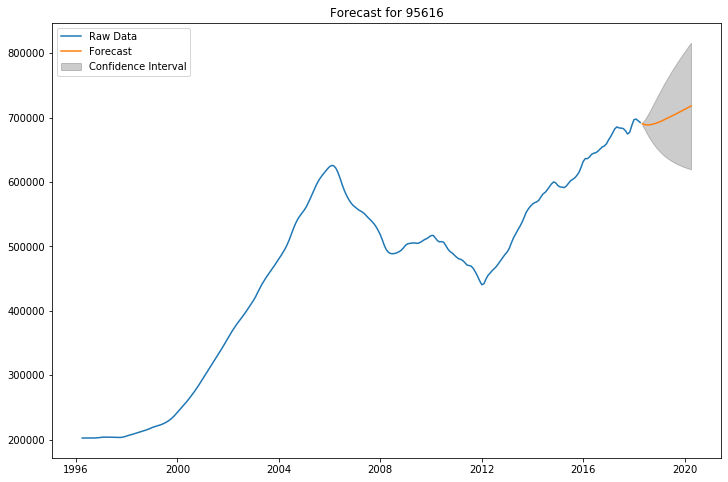

In [110]:
arima_forecast(ts, geog_area, city, county, p_values, d_values, q_values, best_cfg, confint=2, run_pdq = False)

In [93]:
# arima_forecast_enter_pdq(ts, geog_area, city, county, (2,1,2), confint=2)   # this function will append lists

### Function to re-run report without appending lists

In [206]:
# ts_95616 = df_sac.loc[df_sac['Zip'] == '95616']
# ts_95616 = ts.resample('MS').asfreq()
# ts_95616.head()

In [116]:
# this function will not append lists

# arima_forecast_enter_pdq_no_listappend(ts, '95616', 'Davis', 'Yolo', (2,1,2), confint=2)  

### Recommendation--Zip code 95616:   mediocre investment opportunity

By the model prediction, I would expect to see a 3.697% change in price by April 1, 2020.
At the lower bound of the confidence interval, I would expect to see a -10.5% change in price by April 1, 2020.
At the upper bound of the confidence interval, I would expect to see a 17.894% change in price by April 1, 2020.



In [117]:
# print_results_lists()

In [ ]:
# pop_results_lists()

In [111]:
print_results_lists()

(['95616'],
 ['Davis'],
 ['Yolo'],
 [(2, 1, 2)],
 [717863.06],
 [619575.34],
 [816150.79],
 [692300.0],
 [3.69],
 [-10.5],
 [17.89])

## SacMetro: 95619 (Diamond Springs) -- Good potential investment candidate

### Set up dataframe

In [112]:
geog_area = '95619'

In [113]:
city = 'Diamond Springs'

In [114]:
county = 'El Dorado'

In [115]:
ts = df_sac.loc[df_sac['Zip'] == geog_area]

In [116]:
ts = ts.resample('MS').asfreq()

In [117]:
ts.head()

,Metro,MetroState,CountyName,City,Zip,value
time,,,,,,
1996-04-01,Sacramento,Sacramento CA,El Dorado,Diamond Springs,95619,122400.0
1996-05-01,Sacramento,Sacramento CA,El Dorado,Diamond Springs,95619,121800.0
1996-06-01,Sacramento,Sacramento CA,El Dorado,Diamond Springs,95619,121200.0
1996-07-01,Sacramento,Sacramento CA,El Dorado,Diamond Springs,95619,120700.0
1996-08-01,Sacramento,Sacramento CA,El Dorado,Diamond Springs,95619,120200.0


### Visualizations

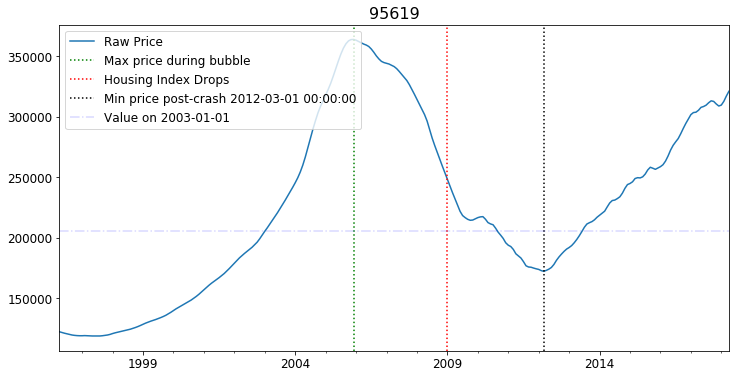

In [118]:
plot_single_geog(df_melt, geog_area, 'value', 'Zip', figsize=(12, 6), fontsize1=12, fontsize2=16)

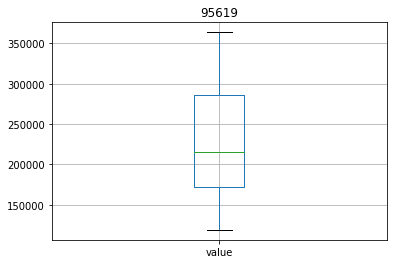

In [119]:
ts.boxplot(column = 'value')
plt.title(geog_area);


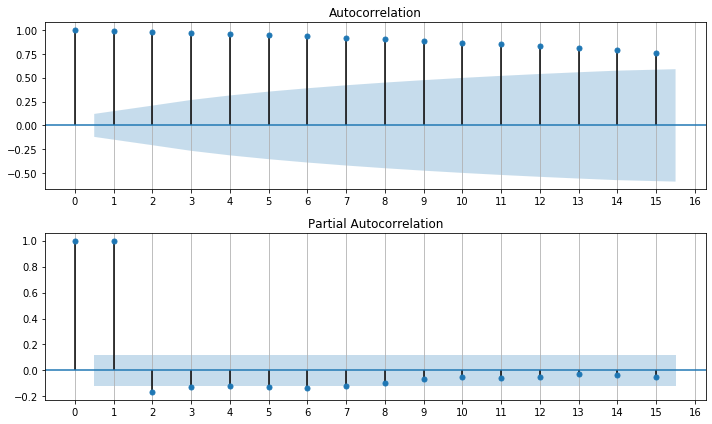

In [120]:
plot_acf_pacf(ts.value)

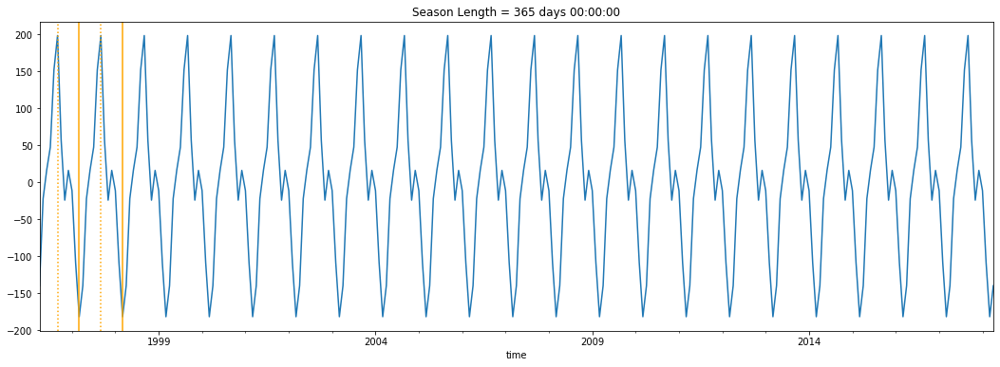

In [121]:
plot_seasonal_decomp(ts.value);

# Note that seasonality isn't much of a factor here; maximum difference of about $700 over the course of a year

### ARIMA parameters tuning

In [122]:
p_values = [0, 1, 2, 4, 6, 8, 10]
d_values = range(0, 3)
q_values = range(0, 3)


In [123]:
# order_tuples_95619, mse_results_95619, best_cfg_95619, best_score_95619 = eval_params_and_lists(ts.value, p_values, d_values, q_values)

# Best ARIMA (2,1,2)

In [125]:
# best_cfg = best_cfg_95619
best_cfg = (2,1,2)
best_cfg

(2, 1, 2)

Best ARIMA for Diamond Springs is (2,1,2), with MSE=8448179

Best ARIMA(2, 1, 2) MSE=1084744.932 (from older notebook)

In [210]:
# results_table_95619 = pd.DataFrame({'Order':order_tuples_95619, 'MSEs':mse_results_95619})
# results_table_95619

,Order,MSEs
0,"(0, 0, 0)",2.451339e+09
1,"(0, 1, 0)",4.707454e+06
2,"(0, 1, 1)",2.047383e+06
3,"(0, 2, 0)",1.270172e+06
4,"(0, 2, 1)",1.042872e+06
5,"(0, 2, 2)",1.117410e+06
6,"(1, 1, 0)",1.238922e+06
7,"(1, 1, 1)",9.972858e+05
8,"(1, 1, 2)",1.086944e+06
9,"(1, 2, 0)",1.251712e+06


In [160]:
# print_results_lists()

### ARIMA modeling and forecasting results

For 95619 (Diamond Springs):
Best ARIMA order = (2, 1, 2)
                             ARIMA Model Results                              
Dep. Variable:                D.value   No. Observations:                  264
Model:                 ARIMA(2, 1, 2)   Log Likelihood               -2074.470
Method:                       css-mle   S.D. of innovations            619.869
Date:                Tue, 17 Mar 2020   AIC                           4160.940
Time:                        15:16:46   BIC                           4182.396
Sample:                    05-01-1996   HQIC                          4169.562
                         - 04-01-2018                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
const           752.6516    701.632      1.073      0.284    -622.522    2127.825
ar.L1.D.value     0.2992      0.066      4.505      0.000       

(['95616', '95619'],
 ['Davis', 'Diamond Springs'],
 ['Yolo', 'El Dorado'],
 [(2, 1, 2), (2, 1, 2)],
 [717863.06, 355774.45],
 [619575.34, 275292.09],
 [816150.79, 436256.81],
 [692300.0, 321100.0],
 [3.69, 10.8],
 [-10.5, -14.27],
 [17.89, 35.86])

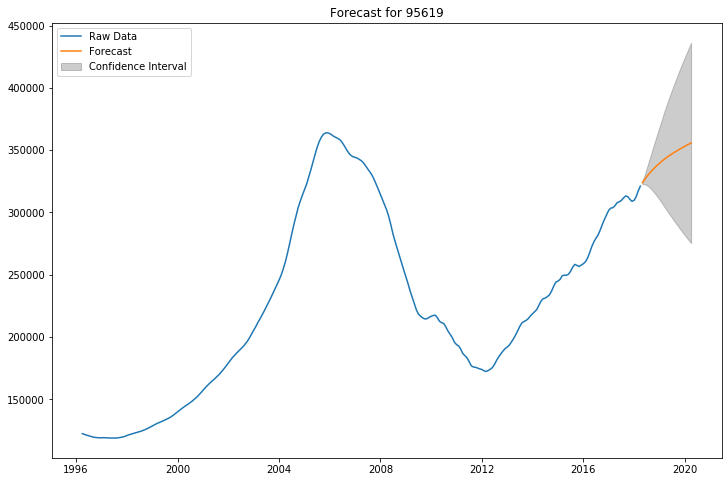

In [126]:
arima_forecast(ts, geog_area, city, county, p_values, d_values, q_values, best_cfg, confint=2, run_pdq = False)

In [102]:
# arima_forecast_enter_pdq(ts, geog_area, city, county, best_cfg, confint=2)

(355774.39767052844, 275292.17866495845, 436256.61667609843) (from older notebook)

### Recommendation--Zip code 95619:  potential investment candidate

By the model prediction, I would expect to see a 10.799% change in price by April 1, 2020.
At the lower bound of the confidence interval, I would expect to see a -14.266% change in price by April 1, 2020.
At the upper bound of the confidence interval, I would expect to see a 35.863% change in price by April 1, 2020.



## SacMetro: 95864 (Arden-Arcade) -- Don't invest

### Set up dataframe

In [127]:
geog_area = '95864'

In [128]:
city = 'Arden-Arcade'

In [129]:
county = 'Sacramento'

In [130]:
ts = df_sac.loc[df_sac['Zip'] == geog_area]

In [131]:
ts

,Metro,MetroState,CountyName,City,Zip,value
time,,,,,,
1996-04-01,Sacramento,Sacramento CA,Sacramento,Arden-Arcade,95864,171200.0
1996-05-01,Sacramento,Sacramento CA,Sacramento,Arden-Arcade,95864,171200.0
1996-06-01,Sacramento,Sacramento CA,Sacramento,Arden-Arcade,95864,171300.0
1996-07-01,Sacramento,Sacramento CA,Sacramento,Arden-Arcade,95864,171500.0
1996-08-01,Sacramento,Sacramento CA,Sacramento,Arden-Arcade,95864,171800.0
...,...,...,...,...,...,...
2017-12-01,Sacramento,Sacramento CA,Sacramento,Arden-Arcade,95864,557500.0
2018-01-01,Sacramento,Sacramento CA,Sacramento,Arden-Arcade,95864,563300.0
2018-02-01,Sacramento,Sacramento CA,Sacramento,Arden-Arcade,95864,566100.0


### Visualizations

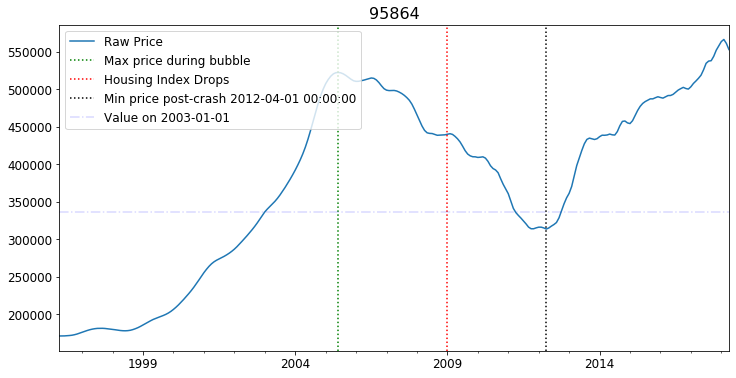

In [208]:
plot_single_geog(df_sac, geog_area, 'value', 'Zip', figsize=(12, 6), fontsize1=12, fontsize2=16)

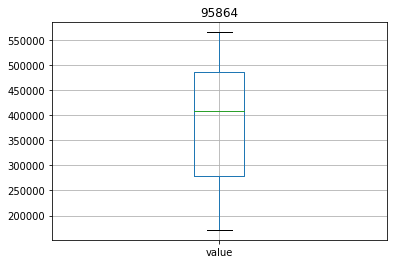

In [129]:
ts.boxplot(column = 'value')
plt.title(geog_area);


In [209]:
# ts = ts.value

ts_values = ts.value

In [210]:
ts_values.head()

time
1996-04-01    171200.0
1996-05-01    171200.0
1996-06-01    171300.0
1996-07-01    171500.0
1996-08-01    171800.0
Name: value, dtype: float64

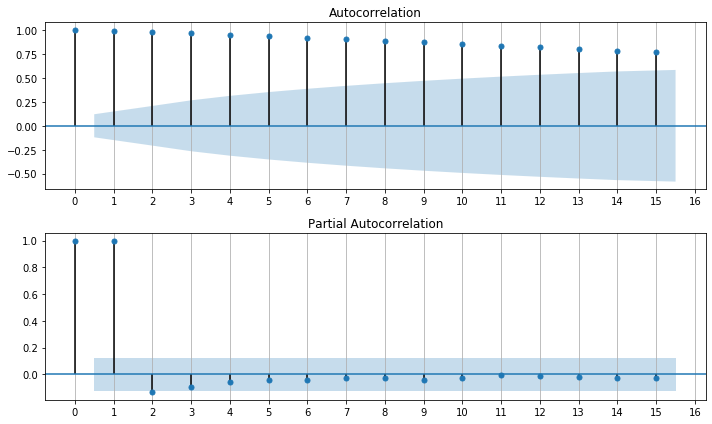

In [132]:
plot_acf_pacf(ts_values, figsize=(10,6), lags=15)

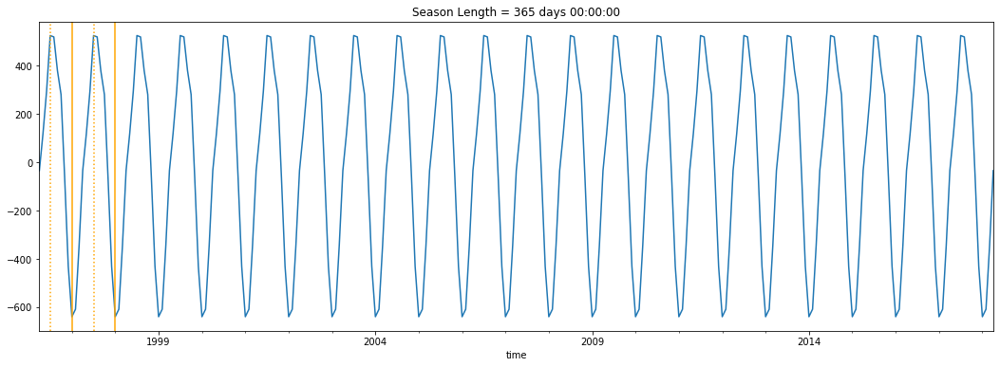

In [133]:
plot_seasonal_decomp(ts_values);

### ARIMA parameters tuning

In [134]:
p_values = [0, 1, 2, 4, 6, 8, 10]
d_values = range(0, 3)
q_values = range(0, 3)


In [285]:
# order_tuples_95864, mse_results_95864, best_cfg_95864, best_score_95864 = eval_params_and_lists(ts.value, p_values, d_values, q_values)

# Best ARIMA(8, 0, 2) MSE=3682509.198

ARIMA(0, 0, 0) MSE=11465800862.953
ARIMA(0, 0, 1) MSE=2940822880.688
ARIMA(0, 1, 0) MSE=23929461.770
ARIMA(0, 1, 1) MSE=7433799.883
ARIMA(0, 2, 0) MSE=6012004.342
ARIMA(0, 2, 1) MSE=4074923.236
ARIMA(1, 0, 0) MSE=26883874.445
ARIMA(1, 1, 0) MSE=5831736.800
ARIMA(1, 1, 2) MSE=3805003.221
ARIMA(1, 2, 0) MSE=5453394.048
ARIMA(1, 2, 1) MSE=4203568.617
ARIMA(2, 0, 2) MSE=3910864.086
ARIMA(2, 1, 0) MSE=5031320.814
ARIMA(2, 1, 1) MSE=7577219432856.334
ARIMA(2, 2, 0) MSE=4083171.553
ARIMA(2, 2, 1) MSE=3819864.843
ARIMA(4, 0, 1) MSE=3684873.196
ARIMA(4, 1, 1) MSE=3726339.204
ARIMA(4, 2, 0) MSE=3887039.455
ARIMA(6, 1, 1) MSE=3883878.069
ARIMA(6, 2, 0) MSE=4030537.232
ARIMA(8, 0, 1) MSE=3874618.305
ARIMA(8, 0, 2) MSE=3682509.198
ARIMA(8, 1, 1) MSE=3860939.933
ARIMA(8, 2, 0) MSE=3963264.846
ARIMA(8, 2, 1) MSE=3927913.545
Best ARIMA(8, 0, 2) MSE=3682509.198


In [132]:
# best_cfg = best_cfg_95864
best_cfg = (8,0,2)
best_cfg

(8, 0, 2)

Best ARIMA(8, 0, 2) MSE=3682509.198

Best ARIMA(4, 1, 1) MSE=1137443.820 (from older notebook)

(526892.1030714705, 405836.1840000962, 647948.0221428449) (forecasted 4/1/2020 results from older notebook)

In [297]:
# results_table_95864 = pd.DataFrame({'Order':order_tuples_95864, 'MSEs':mse_results_95864})  # Best ARIMA(8, 0, 2) MSE=3682509.198
# results_table_95864

,Order,MSEs
0,"(0, 0, 0)",1.146580e+10
1,"(0, 0, 1)",2.940823e+09
2,"(0, 1, 0)",2.392946e+07
3,"(0, 1, 1)",7.433800e+06
4,"(0, 2, 0)",6.012004e+06
5,"(0, 2, 1)",4.074923e+06
6,"(1, 0, 0)",2.688387e+07
7,"(1, 1, 0)",5.831737e+06
8,"(1, 1, 2)",3.805003e+06
9,"(1, 2, 0)",5.453394e+06


### ARIMA modeling and forecasting results

In [168]:
# print_results_lists()   # make sure that the lists are correct to this point

In [142]:
# pop_results_lists()

In [223]:
# model_95864 = ARIMA(ts.value, best_cfg)
# model_fit_95864 = model_95864.fit(disp=0)

In [224]:
# model_fit_95864.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                              ARMA Model Results                              
==============================================================================
Dep. Variable:                  value   No. Observations:                  265
Model:                     ARMA(8, 2)   Log Likelihood               -2246.409
Method:                       css-mle   S.D. of innovations           1094.652
Date:                Tue, 17 Mar 2020   AIC                           4516.817
Time:                        12:10:50   BIC                           4559.774
Sample:                    04-01-1996   HQIC                          4534.076
                         - 04-01-2018                                         
===============================================================================
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
const        3.746e+05   5.71e+04      6.560      0.000    2.63e+05    4.87e+05
ar.L1.value     1.9615      0.000   1.62e+04      0.000       1.961       1.962
ar.L2.value    -1.9469      0.000  -1.46e+04      0.000      -1.947      -1.947
ar.L3.value     2.3012   9.16e-05   2.51e+04      0.000       2.301       2.301
ar.L4.value    -2.1101   5.64e-06  -3.74e+05      0.000      -2.110      -2.110
ar.L5.value     1.2780      0.000   5620.043      0.000       1.278       1.278
ar.L6.value    -0.5131      0.000  -1191.350      0.000      -0.514      -0.512
ar.L7.value    -0.0870      0.000   -226.552      0.000      -0.088      -0.086
ar.L8.value     0.1136      0.002     64.189      0.000       0.110       0.117
ma.L1.value     0.8272      0.037     22.637      0.000       0.756       0.899
ma.L2.value     0.8843      0.029     30.736      0.000       0.828       0.941
                                    Roots                                    
=============================================================================
                  Real          Imaginary           Modulus         Frequency
-----------------------------------------------------------------------------
AR.1           -0.3748           -0.9271j            1.0000           -0.3111
AR.2           -0.3748           +0.9271j            1.0000            0.3111
AR.3            0.4265           -1.2267j            1.2988           -0.1967
AR.4            0.4265           +1.2267j            1.2988            0.1967
AR.5            1.0252           -0.0000j            1.0252           -0.0000
AR.6            1.0857           -0.0000j            1.0857           -0.0000
AR.7            1.5590           -0.0000j            1.5590           -0.0000
AR.8           -3.0072           -0.0000j            3.0072           -0.5000
MA.1           -0.4677           -0.9550j            1.0634           -0.3225
MA.2           -0.4677           +0.9550j            1.0634            0.3225
-----------------------------------------------------------------------------
"""

In [225]:
# model_fit_95864 = arima_zipcode(ts, best_cfg)

In [226]:
# actual_forecast, std_error, forecast_confint = forecast(model_fit_95864, months=24, confint=2)

In [227]:
# df_forecast = forecast_df(actual_forecast, forecast_confint, std_error, col = 'time', 
#                 daterange = pd.date_range(start='2018-05-01', end='2020-04-01', freq='MS'))

In [228]:
# df_new = concat_values_forecast(ts, df_forecast)
# df_new[100:300]

,City,CountyName,Metro,MetroState,Zip,forecast,forecast_lower,forecast_upper,standard error,value
time,,,,,,,,,,
2004-08-01,Arden-Arcade,Sacramento,Sacramento,Sacramento CA,95864,NaN,NaN,NaN,NaN,456300.0
2004-09-01,Arden-Arcade,Sacramento,Sacramento,Sacramento CA,95864,NaN,NaN,NaN,NaN,468600.0
2004-10-01,Arden-Arcade,Sacramento,Sacramento,Sacramento CA,95864,NaN,NaN,NaN,NaN,480400.0
2004-11-01,Arden-Arcade,Sacramento,Sacramento,Sacramento CA,95864,NaN,NaN,NaN,NaN,490900.0
2004-12-01,Arden-Arcade,Sacramento,Sacramento,Sacramento CA,95864,NaN,NaN,NaN,NaN,499700.0
2005-01-01,Arden-Arcade,Sacramento,Sacramento,Sacramento CA,95864,NaN,NaN,NaN,NaN,507100.0
2005-02-01,Arden-Arcade,Sacramento,Sacramento,Sacramento CA,95864,NaN,NaN,NaN,NaN,512700.0
2005-03-01,Arden-Arcade,Sacramento,Sacramento,Sacramento CA,95864,NaN,NaN,NaN,NaN,517100.0
2005-04-01,Arden-Arcade,Sacramento,Sacramento,Sacramento CA,95864,NaN,NaN,NaN,NaN,520200.0


In [236]:
# forecasted_price, forecasted_lower, forecasted_upper = forecast_values(df_new, date = '2020-04-01')
# forecasted_price, forecasted_lower, forecasted_upper

(449047.92170062504, 327568.6832091063, 570527.1601921438)

In [230]:
# last = df_new['value'].loc['2018-04-01']
# last

552700.0

In [231]:
# pred = forecasted_price
# low = forecasted_lower
# high = forecasted_upper

In [232]:
pred_pct_change, lower_pct_change, upper_pct_change = pred_best_worst(pred, low, high, last)


By the model prediction, I would expect to see a -18.754% change in price by April 1, 2020.
<class 'numpy.float64'>
At the lower bound of the confidence interval, I would expect to see a -40.733% change in price by April 1, 2020.
<class 'numpy.float64'>
At the upper bound of the confidence interval, I would expect to see a 3.225% change in price by April 1, 2020.
<class 'numpy.float64'>


In [109]:
print_results_lists()

(['95616', '95619'],
 ['Davis', 'Diamond Springs'],
 ['Yolo', 'El Dorado'],
 [(2, 1, 2), (2, 1, 2)],
 [717863.06, 355774.45],
 [619575.34, 275292.09],
 [816150.79, 436256.81],
 [692300.0, 321100.0],
 [3.69, 10.8],
 [-10.5, -14.27],
 [17.89, 35.86])

In [110]:
# pop_results_lists()

For 95864 (Arden-Arcade):
Best ARIMA order = (8, 0, 2)
                              ARMA Model Results                              
Dep. Variable:                  value   No. Observations:                  265
Model:                     ARMA(8, 2)   Log Likelihood               -2246.409
Method:                       css-mle   S.D. of innovations           1094.652
Date:                Tue, 17 Mar 2020   AIC                           4516.817
Time:                        15:17:15   BIC                           4559.774
Sample:                    04-01-1996   HQIC                          4534.076
                         - 04-01-2018                                         
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
const        3.746e+05   5.71e+04      6.560      0.000    2.63e+05    4.87e+05
ar.L1.value     1.9615      0.000   1.62e+04      0.000       1.961      

(['95616', '95619', '95864'],
 ['Davis', 'Diamond Springs', 'Arden-Arcade'],
 ['Yolo', 'El Dorado', 'Sacramento'],
 [(2, 1, 2), (2, 1, 2), (8, 0, 2)],
 [717863.06, 355774.45, 449047.92],
 [619575.34, 275292.09, 327568.68],
 [816150.79, 436256.81, 570527.16],
 [692300.0, 321100.0, 552700.0],
 [3.69, 10.8, -18.75],
 [-10.5, -14.27, -40.73],
 [17.89, 35.86, 3.23])

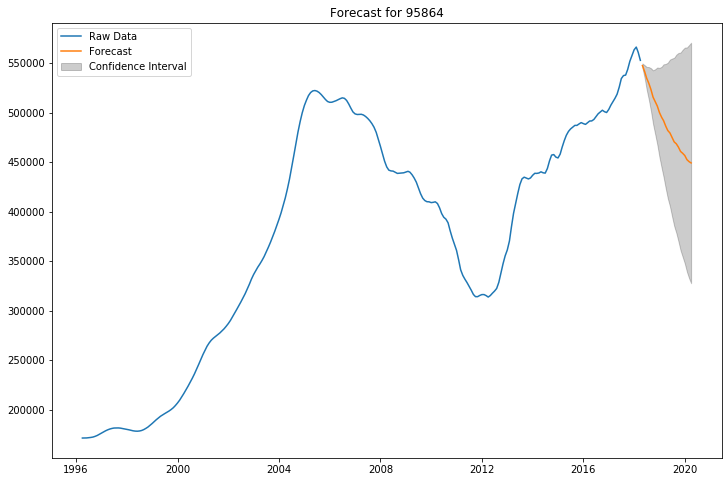

In [133]:
arima_forecast(ts, geog_area, city, county, p_values, d_values, q_values, best_cfg, confint=2, run_pdq = False)

forecasted values from old notebook:  (526892.1030714705, 405836.1840000962, 647948.0221428449)


forecasted values from this notebook:  (449047.92170062504, 327568.6832091063, 570527.1601921438)

In [304]:
# arima_forecast_enter_pdq_no_listappend(ts, geog_area, city, county, best_cfg, confint=2)

### Recommendation for ZIP code 95864:  Don't invest

By the model prediction, I would expect to see a -18.754% change in price by April 1, 2020.
At the lower bound of the confidence interval, I would expect to see a -40.733% change in price by April 1, 2020.
At the upper bound of the confidence interval, I would expect to see a 3.225% change in price by April 1, 2020.

In [134]:
print_results_lists()

(['95616', '95619', '95864'],
 ['Davis', 'Diamond Springs', 'Arden-Arcade'],
 ['Yolo', 'El Dorado', 'Sacramento'],
 [(2, 1, 2), (2, 1, 2), (8, 0, 2)],
 [717863.06, 355774.45, 449047.92],
 [619575.34, 275292.09, 327568.68],
 [816150.79, 436256.81, 570527.16],
 [692300.0, 321100.0, 552700.0],
 [3.69, 10.8, -18.75],
 [-10.5, -14.27, -40.73],
 [17.89, 35.86, 3.23])

In [1]:
# pop_results_lists()     # use in case there is a problem with the results of the model function previously run

## SacMetro:  95831 (Sacramento_Pocket) -- Don't invest; lots of downside risk

### Set up dataframe

In [135]:
geog_area = '95831'

In [136]:
city = 'Sacramento_Pocket'

In [137]:
county = 'Sacramento'

In [138]:
ts = df_sac.loc[df_sac['Zip'] == geog_area]

In [139]:
ts.head()

,Metro,MetroState,CountyName,City,Zip,value
time,,,,,,
1996-04-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95831,162600.0
1996-05-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95831,162000.0
1996-06-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95831,161200.0
1996-07-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95831,160400.0
1996-08-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95831,159500.0


In [140]:
ts = ts.resample('MS').asfreq()

In [141]:
ts.head()

,Metro,MetroState,CountyName,City,Zip,value
time,,,,,,
1996-04-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95831,162600.0
1996-05-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95831,162000.0
1996-06-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95831,161200.0
1996-07-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95831,160400.0
1996-08-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95831,159500.0


### Visualizations

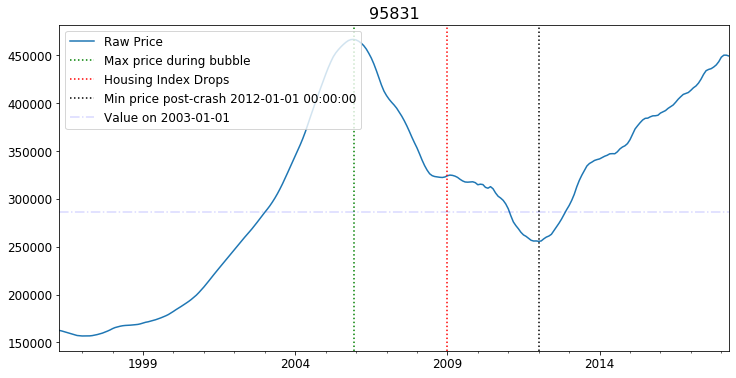

In [142]:
plot_single_geog(df_melt, geog_area, 'value', 'Zip', figsize=(12, 6), fontsize1=12, fontsize2=16)

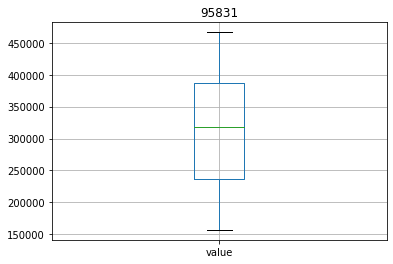

In [245]:
ts.boxplot(column = 'value')
plt.title(geog_area);


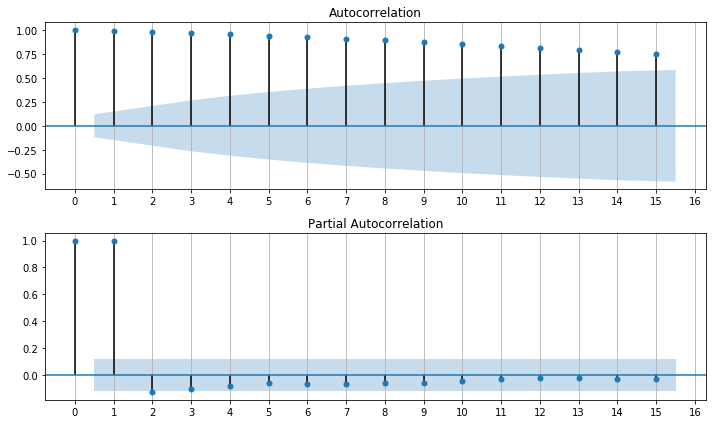

In [179]:
plot_acf_pacf(ts.value)

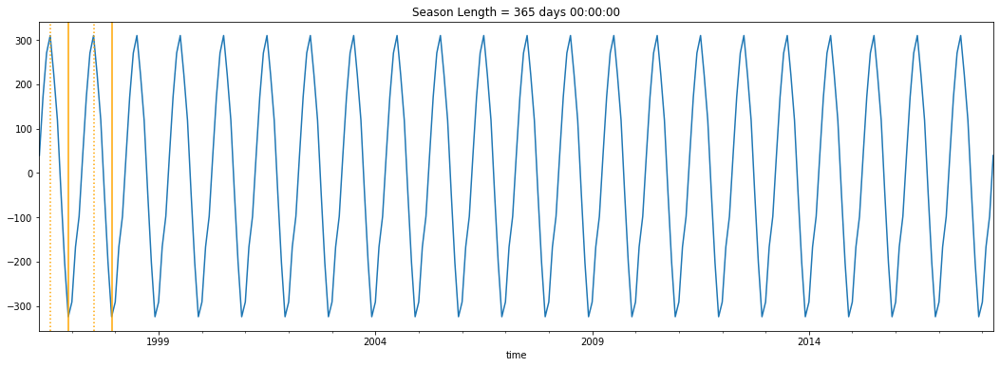

In [180]:
plot_seasonal_decomp(ts.value);

# Note that seasonality isn't much of a factor here; maximum difference of about $700 over the course of a year

### ARIMA parameters tuning

In [143]:
p_values = [0, 1, 2, 4, 6, 8, 10]
d_values = range(0, 3)
q_values = range(0, 3)

In [144]:
# order_tuples_95831, mse_results_95831, best_cfg_95831, best_score_95831 = eval_params_and_lists(ts.value, p_values, d_values, q_values)


In [145]:
# best_cfg = best_cfg_95831

In [147]:
best_cfg = (6,0,2)
best_cfg

(6, 0, 2)

Best ARIMA(6, 0, 2) MSE=955633.913 (from old notebook)

In [ ]:
# results_table_95831 = pd.DataFrame({'Order':order_tuples_95831, 'MSEs':mse_results_95831})
# results_table_95831

### ARIMA modeling and forecasting results

In [148]:
print_results_lists()   # make sure that the lists are correct to this point

(['95616', '95619', '95864'],
 ['Davis', 'Diamond Springs', 'Arden-Arcade'],
 ['Yolo', 'El Dorado', 'Sacramento'],
 [(2, 1, 2), (2, 1, 2), (8, 0, 2)],
 [717863.06, 355774.45, 449047.92],
 [619575.34, 275292.09, 327568.68],
 [816150.79, 436256.81, 570527.16],
 [692300.0, 321100.0, 552700.0],
 [3.69, 10.8, -18.75],
 [-10.5, -14.27, -40.73],
 [17.89, 35.86, 3.23])

In [149]:
# pop_results_lists() 

For 95831 (Sacramento_Pocket):
Best ARIMA order = (6, 0, 2)
                              ARMA Model Results                              
Dep. Variable:                  value   No. Observations:                  265
Model:                     ARMA(6, 2)   Log Likelihood               -2114.424
Method:                       css-mle   S.D. of innovations            686.786
Date:                Tue, 17 Mar 2020   AIC                           4248.848
Time:                        15:17:50   BIC                           4284.645
Sample:                    04-01-1996   HQIC                          4263.231
                         - 04-01-2018                                         
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
const        3.083e+05   3.82e+04      8.075      0.000    2.33e+05    3.83e+05
ar.L1.value     1.0755      0.115      9.348      0.000       0.850 

(['95616', '95619', '95864', '95831'],
 ['Davis', 'Diamond Springs', 'Arden-Arcade', 'Sacramento_Pocket'],
 ['Yolo', 'El Dorado', 'Sacramento', 'Sacramento'],
 [(2, 1, 2), (2, 1, 2), (8, 0, 2), (6, 0, 2)],
 [717863.06, 355774.45, 449047.92, 389675.07],
 [619575.34, 275292.09, 327568.68, 302216.31],
 [816150.79, 436256.81, 570527.16, 477133.84],
 [692300.0, 321100.0, 552700.0, 449300.0],
 [3.69, 10.8, -18.75, -13.27],
 [-10.5, -14.27, -40.73, -32.74],
 [17.89, 35.86, 3.23, 6.19])

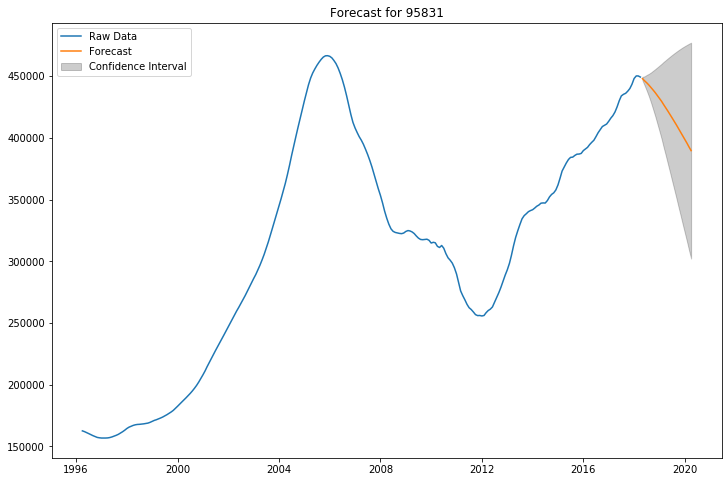

In [150]:
arima_forecast(ts, geog_area, city, county, p_values, d_values, q_values, best_cfg, confint=2, run_pdq = False)

In [412]:
# arima_forecast_enter_pdq(ts, geog_area, city, county, best_cfg, confint=2)

In [413]:
# arima_forecast(ts, geog_area, city, county, p_values, d_values, q_values, best_cfg, confint=2, run_pdq = False)

### Zip code 95831:  don't invest; lots of downside risk

By the model prediction, I would expect to see a -13.413% change in price by April 1, 2020.
At the lower bound of the confidence interval, I would expect to see a -32.77% change in price by April 1, 2020.
At the upper bound of the confidence interval, I would expect to see a 5.945% change in price by April 1, 2020.

In [151]:
print_results_lists()

(['95616', '95619', '95864', '95831'],
 ['Davis', 'Diamond Springs', 'Arden-Arcade', 'Sacramento_Pocket'],
 ['Yolo', 'El Dorado', 'Sacramento', 'Sacramento'],
 [(2, 1, 2), (2, 1, 2), (8, 0, 2), (6, 0, 2)],
 [717863.06, 355774.45, 449047.92, 389675.07],
 [619575.34, 275292.09, 327568.68, 302216.31],
 [816150.79, 436256.81, 570527.16, 477133.84],
 [692300.0, 321100.0, 552700.0, 449300.0],
 [3.69, 10.8, -18.75, -13.27],
 [-10.5, -14.27, -40.73, -32.74],
 [17.89, 35.86, 3.23, 6.19])

In [412]:
# pop_results_lists()     # use in case there is a problem with the results of the model function previously run

## SacMetro:  96142 (Tahoma) -- NOTE:  throws error at model fit stage

### Set up dataframe

In [124]:
geog_area = '96142'

In [125]:
city = 'Tahoma'

In [126]:
county = 'El Dorado'

In [127]:
ts = df_sac.loc[df_sac['Zip'] == geog_area]

In [128]:
ts.head()

,Metro,MetroState,CountyName,City,Zip,value
time,,,,,,
1996-04-01,Sacramento,Sacramento CA,El Dorado,Tahoma,96142,159000.0
1996-05-01,Sacramento,Sacramento CA,El Dorado,Tahoma,96142,158900.0
1996-06-01,Sacramento,Sacramento CA,El Dorado,Tahoma,96142,158900.0
1996-07-01,Sacramento,Sacramento CA,El Dorado,Tahoma,96142,158900.0
1996-08-01,Sacramento,Sacramento CA,El Dorado,Tahoma,96142,158900.0


In [129]:
ts = ts.resample('MS').asfreq()

In [130]:
ts.head()

,Metro,MetroState,CountyName,City,Zip,value
time,,,,,,
1996-04-01,Sacramento,Sacramento CA,El Dorado,Tahoma,96142,159000.0
1996-05-01,Sacramento,Sacramento CA,El Dorado,Tahoma,96142,158900.0
1996-06-01,Sacramento,Sacramento CA,El Dorado,Tahoma,96142,158900.0
1996-07-01,Sacramento,Sacramento CA,El Dorado,Tahoma,96142,158900.0
1996-08-01,Sacramento,Sacramento CA,El Dorado,Tahoma,96142,158900.0


### Visualizations

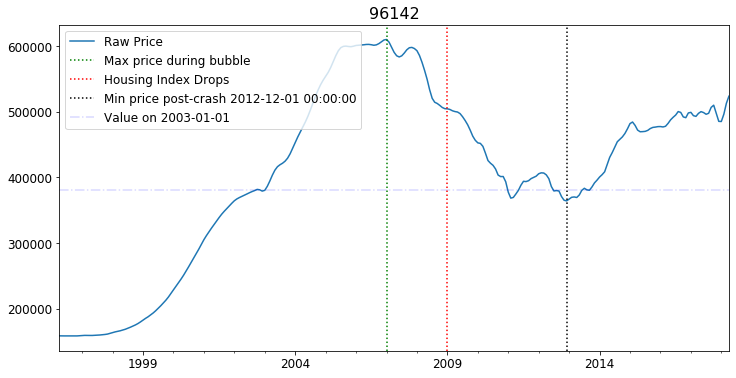

In [131]:
plot_single_geog(df_melt, geog_area, 'value', 'Zip', figsize=(12, 6), fontsize1=12, fontsize2=16)

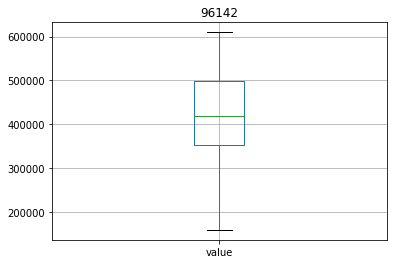

In [421]:
ts.boxplot(column = 'value')
plt.title(geog_area);


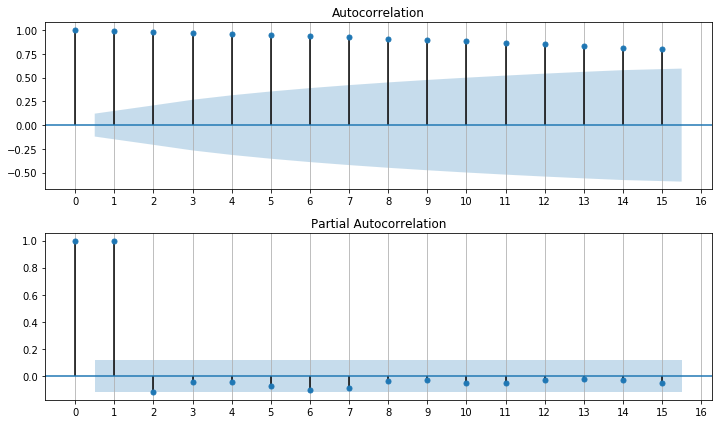

In [422]:
plot_acf_pacf(ts.value)

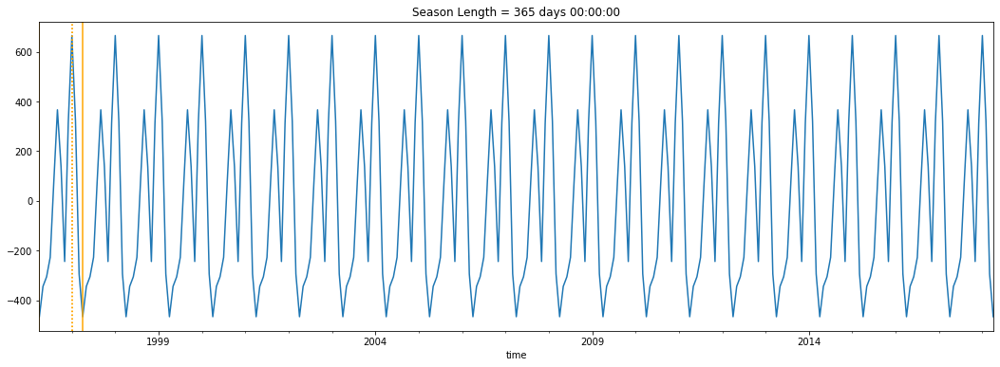

In [423]:
plot_seasonal_decomp(ts.value);

# Note that seasonality isn't much of a factor here; maximum difference of about $700 over the course of a year

### ARIMA parameters tuning

In [424]:
import warnings
from statsmodels.tsa.arima_model import ARIMA
import statsmodels.api as sm
from sklearn.metrics import mean_squared_error

In [ ]:
p_values = [0, 1, 2, 4, 6, 8, 10]
d_values = range(0, 3)
q_values = range(0, 3)


In [ ]:
# order_tuples_96142, mse_results_96142, best_cfg_96142, best_score_96142 = eval_params_and_lists(ts.value, p_values, d_values, q_values)


From old notebook: Best ARIMA(6, 1, 2) MSE=10423029.066

In [ ]:
# best_cfg = best_cfg_96142

In [132]:
best_cfg = (6, 1, 2)

In [ ]:
# results_table_96142 = pd.DataFrame({'Order':order_tuples_96142, 'MSEs':mse_results_96142})
# results_table_96142

### ARIMA modeling and forecasting results

In [150]:
# print_results_lists()   # make sure that the lists are correct to this point

In [423]:
# pop_results_lists()

In [144]:
arima_forecast_enter_pdq(ts, geog_area, city, county, best_cfg, confint=1)

For 96142 (Tahoma):
Best ARIMA order = (6, 1, 2)


LinAlgError: Array must not contain infs or NaNs

In [137]:
arima_zipcode(ts, best_cfg)

LinAlgError: Array must not contain infs or NaNs

In [149]:
model = ARIMA(ts.value, best_cfg)
model_fit = model.fit(disp=0)
model_fit.summary()

LinAlgError: Array must not contain infs or NaNs

In [143]:
ts.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 265 entries, 1996-04-01 to 2018-04-01
Freq: MS
Data columns (total 6 columns):
Metro         265 non-null object
MetroState    265 non-null object
CountyName    265 non-null object
City          265 non-null object
Zip           265 non-null object
value         265 non-null float64
dtypes: float64(1), object(5)
memory usage: 14.5+ KB


In [145]:
for x in ts.value:
    print(type(x))

<class 'float'>
<class 'float'>
<class 'float'>
<class 'float'>
<class 'float'>
<class 'float'>
<class 'float'>
<class 'float'>
<class 'float'>
<class 'float'>
<class 'float'>
<class 'float'>
<class 'float'>
<class 'float'>
<class 'float'>
<class 'float'>
<class 'float'>
<class 'float'>
<class 'float'>
<class 'float'>
<class 'float'>
<class 'float'>
<class 'float'>
<class 'float'>
<class 'float'>
<class 'float'>
<class 'float'>
<class 'float'>
<class 'float'>
<class 'float'>
<class 'float'>
<class 'float'>
<class 'float'>
<class 'float'>
<class 'float'>
<class 'float'>
<class 'float'>
<class 'float'>
<class 'float'>
<class 'float'>
<class 'float'>
<class 'float'>
<class 'float'>
<class 'float'>
<class 'float'>
<class 'float'>
<class 'float'>
<class 'float'>
<class 'float'>
<class 'float'>
<class 'float'>
<class 'float'>
<class 'float'>
<class 'float'>
<class 'float'>
<class 'float'>
<class 'float'>
<class 'float'>
<class 'float'>
<class 'float'>
<class 'float'>
<class 'float'>
<class '

In [2]:
# print_results_list()

In [1]:
# pop_results_lists()     # use in case there is a problem with the results of the model function previously run

### Zip code 96142:  Potentially solid gains, with possibly large upside or downside

By the model prediction, I would expect to see a 9.791% change in price by April 1, 2020.
At the lower bound of the confidence interval, I would expect to see a -15.663% change in price by April 1, 2020.
At the upper bound of the confidence interval, I would expect to see a 35.246% change in price by April 1, 2020.


## SacMetro:  95811 (Sacramento_DosRios) -- Mediocre predicted returns

### Set up dataframe

In [434]:
geog_area = '95811'

In [435]:
city = 'Sacramento_DosRios'

In [436]:
county = 'Sacramento'

In [437]:
ts = df_sac.loc[df_sac['Zip'] == geog_area]

In [438]:
ts.head()

,Metro,MetroState,CountyName,City,Zip,value
time,,,,,,
1996-04-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95811,119400.0
1996-05-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95811,119200.0
1996-06-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95811,119000.0
1996-07-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95811,118700.0
1996-08-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95811,118500.0


In [439]:
ts = ts.resample('MS').asfreq()

In [440]:
ts.head()

,Metro,MetroState,CountyName,City,Zip,value
time,,,,,,
1996-04-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95811,119400.0
1996-05-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95811,119200.0
1996-06-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95811,119000.0
1996-07-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95811,118700.0
1996-08-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95811,118500.0


### Visualizations

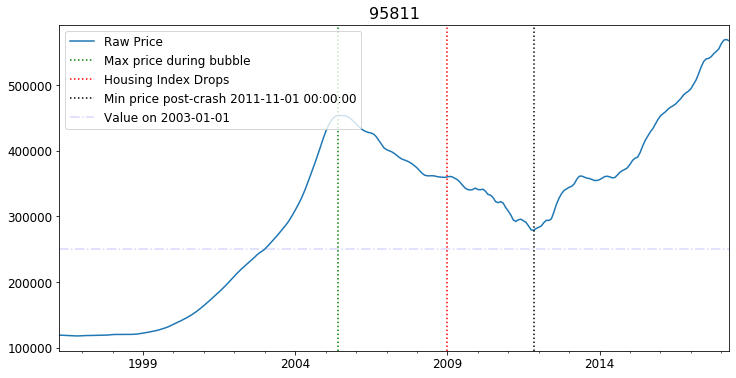

In [441]:
plot_single_geog(df_melt, geog_area, 'value', 'Zip', figsize=(12, 6), fontsize1=12, fontsize2=16)

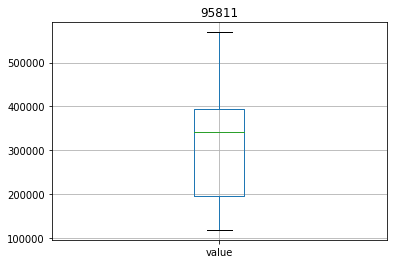

In [167]:
ts.boxplot(column = 'value')
plt.title(geog_area);


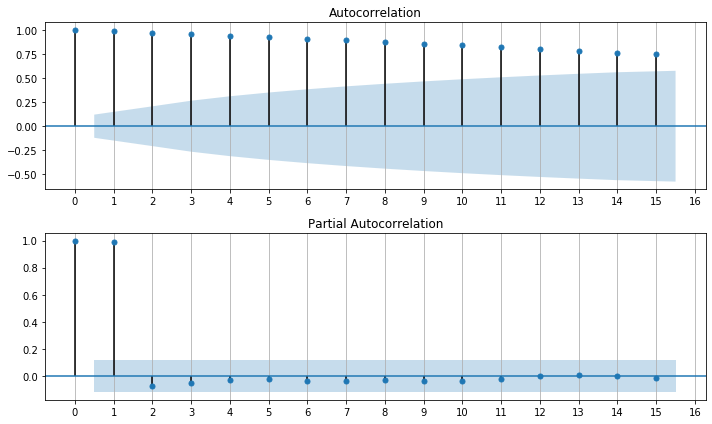

In [168]:
plot_acf_pacf(ts.value)

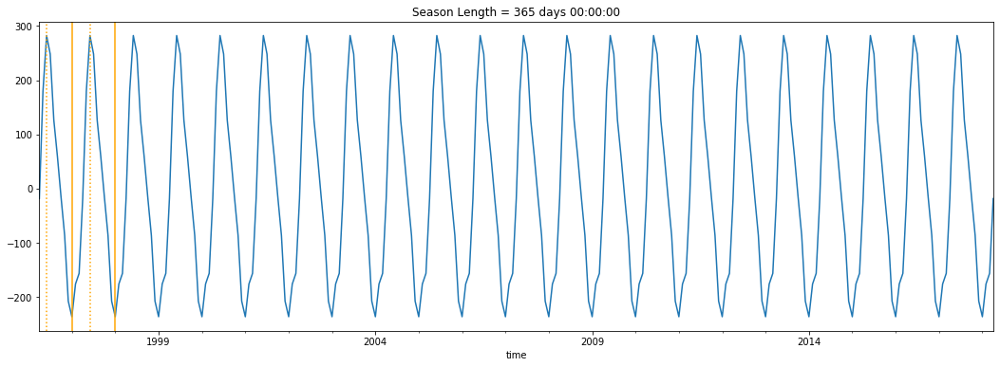

In [169]:
plot_seasonal_decomp(ts.value);

# Note that seasonality isn't much of a factor here; maximum difference of about $700 over the course of a year

### ARIMA parameters tuning

In [170]:
p_values = [0, 1, 2, 4, 6, 8, 10]
d_values = range(0, 3)
q_values = range(0, 3)


In [171]:
# order_tuples_95811, mse_results_95811, best_cfg_95811, best_score_95811 = eval_params_and_lists(ts.value, p_values, d_values, q_values)

# Best ARIMA(10, 1, 0) MSE=3792581.619

In [442]:
best_cfg = (10,1,0)

In [443]:
best_cfg

(10, 1, 0)

In [ ]:
# results_table_95811 = pd.DataFrame({'Order':order_tuples_95811, 'MSEs':mse_results_95811})
# results_table_95811

### ARIMA modeling and forecasting results

In [444]:
print_results_lists()   # make sure that the lists are correct to this point

(['95616',
  '95619',
  '95864',
  '95831',
  '95811',
  '95818',
  '95630',
  '96140',
  '95672',
  '95636',
  '95709',
  '95746',
  '95614',
  '95663',
  '95623',
  '95747',
  '95765',
  '95602',
  '96150',
  '95650'],
 ['Davis',
  'Diamond Springs',
  'Arden-Arcade',
  'Sacramento_Pocket',
  'Sacramento_DosRios',
  'Sacramento_LandPark',
  'Folsom',
  'Carnelian Bay',
  'Rescue',
  'Somerset',
  'Camino',
  'Granite Bay',
  'Cool',
  'Penryn',
  'El Dorado',
  'Roseville',
  'Rocklin',
  'Auburn',
  'South Lake Tahoe',
  'Loomis'],
 ['Yolo',
  'El Dorado',
  'Sacramento',
  'Sacramento',
  'Sacramento',
  'Sacramento',
  'Sacramento',
  'Placer',
  'El Dorado',
  'El Dorado',
  'El Dorado',
  'Placer',
  'El Dorado',
  'Placer',
  'El Dorado',
  'Placer',
  'Placer',
  'Placer',
  'El Dorado',
  'Placer'],
 [(2, 1, 2),
  (2, 1, 2),
  (8, 0, 2),
  (6, 0, 2),
  (10, 1, 0),
  (6, 2, 2),
  (2, 2, 0),
  (4, 2, 1),
  (8, 2, 0),
  (8, 2, 1),
  (8, 0, 2),
  (6, 1, 2),
  (8, 0, 2),
  (6, 1, 

For 95811 (Sacramento_DosRios):
Best ARIMA order = (10, 1, 0)
                             ARIMA Model Results                              
Dep. Variable:                D.value   No. Observations:                  264
Model:                ARIMA(10, 1, 0)   Log Likelihood               -2251.853
Method:                       css-mle   S.D. of innovations           1214.967
Date:                Tue, 17 Mar 2020   AIC                           4527.706
Time:                        15:40:27   BIC                           4570.618
Sample:                    05-01-1996   HQIC                          4544.949
                         - 04-01-2018                                         
                     coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------
const           1537.8361    878.462      1.751      0.081    -183.919    3259.591
ar.L1.D.value      1.4319      0.061     23.473      0.00

(['95616',
  '95619',
  '95864',
  '95831',
  '95811',
  '95818',
  '95630',
  '96140',
  '95672',
  '95636',
  '95709',
  '95746',
  '95614',
  '95663',
  '95623',
  '95747',
  '95765',
  '95602',
  '96150',
  '95650',
  '95811'],
 ['Davis',
  'Diamond Springs',
  'Arden-Arcade',
  'Sacramento_Pocket',
  'Sacramento_DosRios',
  'Sacramento_LandPark',
  'Folsom',
  'Carnelian Bay',
  'Rescue',
  'Somerset',
  'Camino',
  'Granite Bay',
  'Cool',
  'Penryn',
  'El Dorado',
  'Roseville',
  'Rocklin',
  'Auburn',
  'South Lake Tahoe',
  'Loomis',
  'Sacramento_DosRios'],
 ['Yolo',
  'El Dorado',
  'Sacramento',
  'Sacramento',
  'Sacramento',
  'Sacramento',
  'Sacramento',
  'Placer',
  'El Dorado',
  'El Dorado',
  'El Dorado',
  'Placer',
  'El Dorado',
  'Placer',
  'El Dorado',
  'Placer',
  'Placer',
  'Placer',
  'El Dorado',
  'Placer',
  'Sacramento'],
 [(2, 1, 2),
  (2, 1, 2),
  (8, 0, 2),
  (6, 0, 2),
  (10, 1, 0),
  (6, 2, 2),
  (2, 2, 0),
  (4, 2, 1),
  (8, 2, 0),
  (8, 2, 1

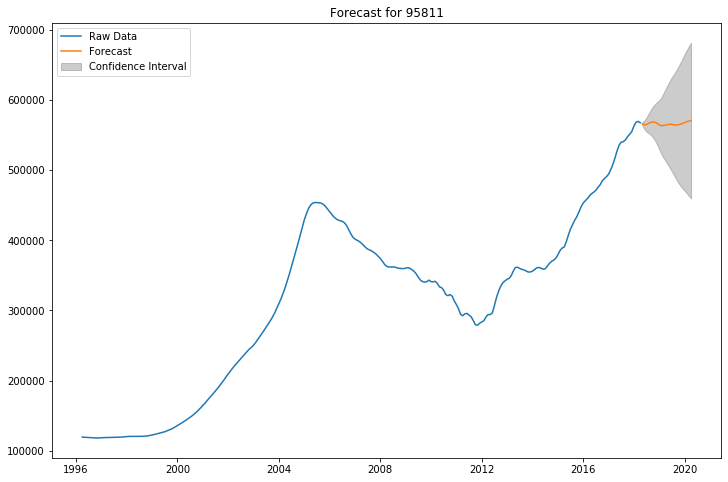

In [445]:
arima_forecast(ts, geog_area, city, county, p_values, d_values, q_values, best_cfg, confint=2, run_pdq = False)

### Zip code 95811:  Don't invest--mediocre predicted returns with significant potential downside (but also significant potential upside)

By the model prediction, I would expect to see a 0.599% change in price by April 1, 2020.
At the lower bound of the confidence interval, I would expect to see a -18.954% change in price by April 1, 2020.
At the upper bound of the confidence interval, I would expect to see a 20.152% change in price by April 1, 2020.

## SacMetro:  95818 (Sacramento_LandPark) -- Do not invest

### Set up dataframe

In [176]:
geog_area = '95818'

In [177]:
city = 'Sacramento_LandPark'

In [178]:
county = 'Sacramento'

In [179]:
ts = df_sac.loc[df_sac['Zip'] == geog_area]

In [180]:
ts.head()

,Metro,MetroState,CountyName,City,Zip,value
time,,,,,,
1996-04-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95818,144000.0
1996-05-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95818,144300.0
1996-06-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95818,144500.0
1996-07-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95818,144500.0
1996-08-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95818,144600.0


In [181]:
ts = ts.resample('MS').asfreq()

In [182]:
ts.head()

,Metro,MetroState,CountyName,City,Zip,value
time,,,,,,
1996-04-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95818,144000.0
1996-05-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95818,144300.0
1996-06-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95818,144500.0
1996-07-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95818,144500.0
1996-08-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95818,144600.0


### Visualizations

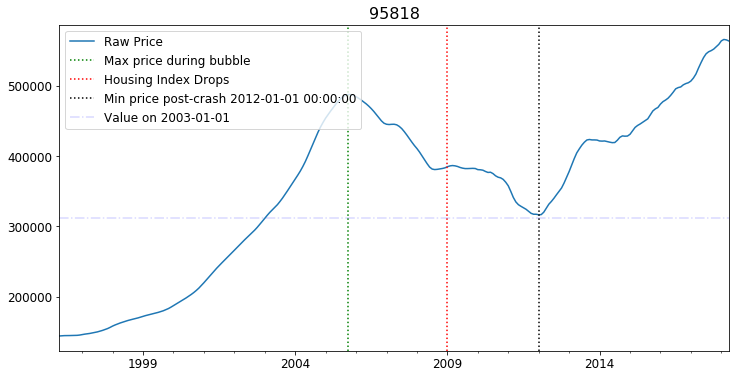

In [183]:
plot_single_geog(df_melt, geog_area, 'value', 'Zip', figsize=(12, 6), fontsize1=12, fontsize2=16)

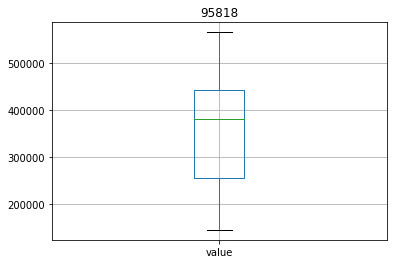

In [184]:
ts.boxplot(column = 'value')
plt.title(geog_area);


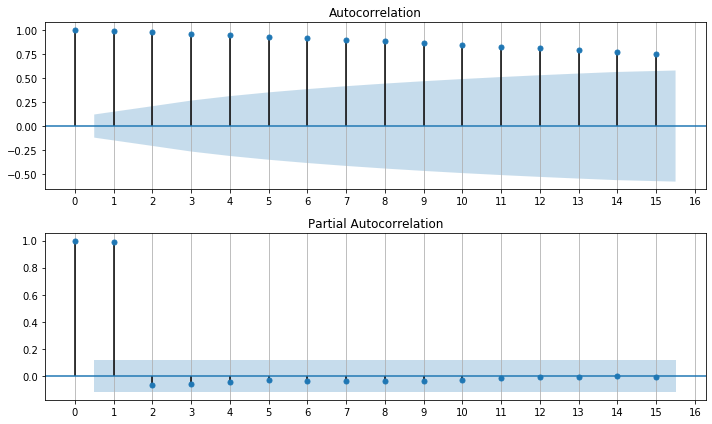

In [185]:
plot_acf_pacf(ts.value)

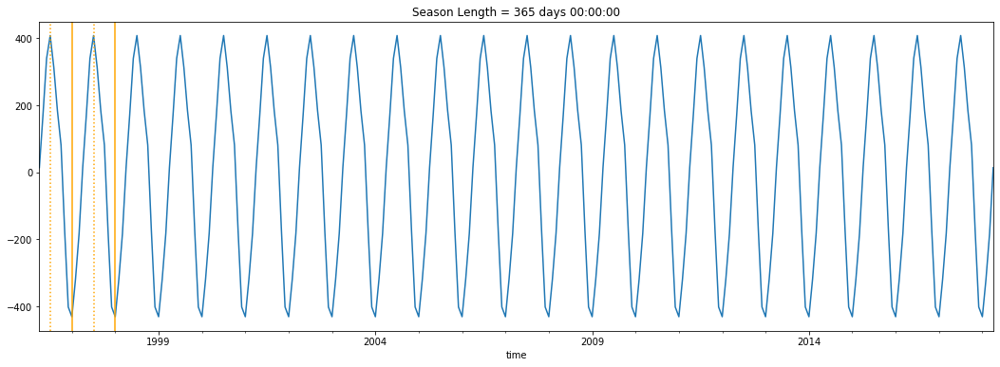

In [186]:
plot_seasonal_decomp(ts.value);

# Note that seasonality isn't much of a factor here; maximum difference of about $700 over the course of a year

### ARIMA parameters tuning

In [187]:
p_values = [0, 1, 2, 4, 6, 8, 10]
d_values = range(0, 3)
q_values = range(0, 3)


In [188]:
# order_tuples_95818, mse_results_95818, best_cfg_95818, best_score_95818 = eval_params_and_lists(ts.value, p_values, d_values, q_values)


From older notebook:  Best ARIMA(6, 2, 2) MSE=2089095.204

In [189]:
best_cfg = (6,2,2)

In [190]:
best_cfg

(6, 2, 2)

In [191]:
# results_table_95818 = pd.DataFrame({'Order':order_tuples_95818, 'MSEs':mse_results_95818})
# results_table_95818

### ARIMA modeling and forecasting results

In [192]:
print_results_lists()   # make sure that the lists are correct to this point

(['95616', '95619', '95864', '95831', '95811'],
 ['Davis',
  'Diamond Springs',
  'Arden-Arcade',
  'Sacramento_Pocket',
  'Sacramento_DosRios'],
 ['Yolo', 'El Dorado', 'Sacramento', 'Sacramento', 'Sacramento'],
 [(2, 1, 2), (2, 1, 2), (8, 0, 2), (6, 0, 2), (10, 1, 0)],
 [717863.06, 355774.45, 449047.92, 389675.07, 570598.7],
 [619575.34, 275292.09, 327568.68, 302216.31, 459606.77],
 [816150.79, 436256.81, 570527.16, 477133.84, 681590.63],
 [692300.0, 321100.0, 552700.0, 449300.0, 567500.0],
 [3.69, 10.8, -18.75, -13.27, 0.55],
 [-10.5, -14.27, -40.73, -32.74, -19.01],
 [17.89, 35.86, 3.23, 6.19, 20.1])

For 95818 (Sacramento_LandPark):
Best ARIMA order = (6, 2, 2)
                             ARIMA Model Results                              
Dep. Variable:               D2.value   No. Observations:                  263
Model:                 ARIMA(6, 2, 2)   Log Likelihood               -2135.127
Method:                       css-mle   S.D. of innovations            798.928
Date:                Tue, 17 Mar 2020   AIC                           4290.255
Time:                        15:19:29   BIC                           4325.976
Sample:                    06-01-1996   HQIC                          4304.611
                         - 04-01-2018                                         
                     coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------
const             -1.7335     60.934     -0.028      0.977    -121.161     117.694
ar.L1.D2.value    -1.0734      0.060    -17.791      0.00

(['95616', '95619', '95864', '95831', '95811', '95818'],
 ['Davis',
  'Diamond Springs',
  'Arden-Arcade',
  'Sacramento_Pocket',
  'Sacramento_DosRios',
  'Sacramento_LandPark'],
 ['Yolo', 'El Dorado', 'Sacramento', 'Sacramento', 'Sacramento', 'Sacramento'],
 [(2, 1, 2), (2, 1, 2), (8, 0, 2), (6, 0, 2), (10, 1, 0), (6, 2, 2)],
 [717863.06, 355774.45, 449047.92, 389675.07, 570598.7, 558380.08],
 [619575.34, 275292.09, 327568.68, 302216.31, 459606.77, 418566.82],
 [816150.79, 436256.81, 570527.16, 477133.84, 681590.63, 698193.34],
 [692300.0, 321100.0, 552700.0, 449300.0, 567500.0, 563900.0],
 [3.69, 10.8, -18.75, -13.27, 0.55, -0.98],
 [-10.5, -14.27, -40.73, -32.74, -19.01, -25.77],
 [17.89, 35.86, 3.23, 6.19, 20.1, 23.82])

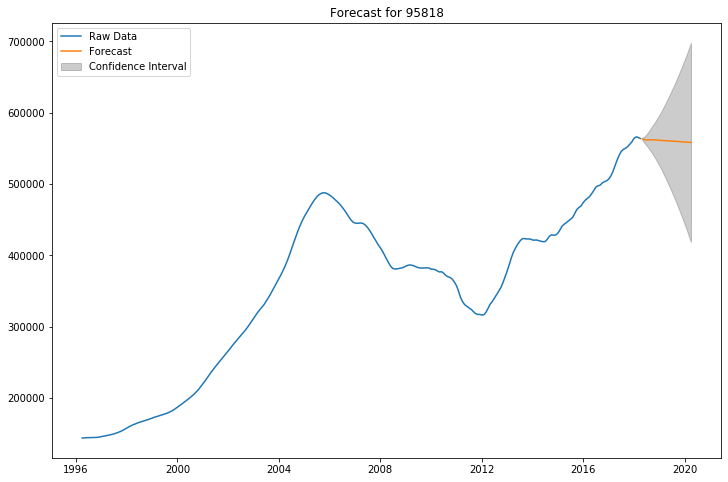

In [193]:
arima_forecast(ts, geog_area, city, county, p_values, d_values, q_values, best_cfg, confint=2, run_pdq = False)

### Zip code 95818:  Do not invest--negative predicted return

By the model prediction, I would expect to see a -0.978% change in price by April 1, 2020
At the lower bound of the confidence interval, I would expect to see a -25.772% change in price by April 1, 2020
At the upper bound of the confidence interval, I would expect to see a 23.816% change in price by April 1, 2020


## SacMetro:  95630 (Folsom)--Mediocre predicted returns 

### Set up dataframe

In [194]:
geog_area = '95630'

In [195]:
city = 'Folsom'

In [196]:
county = 'Sacramento'

In [197]:
ts = df_sac.loc[df_sac['Zip'] == geog_area]

In [198]:
ts.head()

,Metro,MetroState,CountyName,City,Zip,value
time,,,,,,
1996-04-01,Sacramento,Sacramento CA,Sacramento,Folsom,95630,190000.0
1996-05-01,Sacramento,Sacramento CA,Sacramento,Folsom,95630,189300.0
1996-06-01,Sacramento,Sacramento CA,Sacramento,Folsom,95630,188500.0
1996-07-01,Sacramento,Sacramento CA,Sacramento,Folsom,95630,187800.0
1996-08-01,Sacramento,Sacramento CA,Sacramento,Folsom,95630,187300.0


In [199]:
ts = ts.resample('MS').asfreq()

In [200]:
ts.head()

,Metro,MetroState,CountyName,City,Zip,value
time,,,,,,
1996-04-01,Sacramento,Sacramento CA,Sacramento,Folsom,95630,190000.0
1996-05-01,Sacramento,Sacramento CA,Sacramento,Folsom,95630,189300.0
1996-06-01,Sacramento,Sacramento CA,Sacramento,Folsom,95630,188500.0
1996-07-01,Sacramento,Sacramento CA,Sacramento,Folsom,95630,187800.0
1996-08-01,Sacramento,Sacramento CA,Sacramento,Folsom,95630,187300.0


### Visualizations

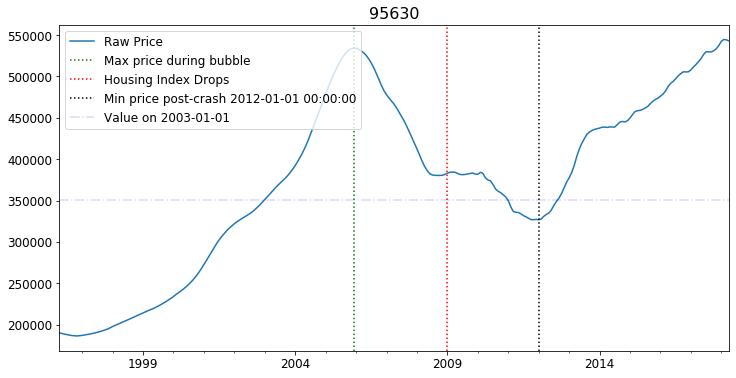

In [201]:
plot_single_geog(df_melt, geog_area, 'value', 'Zip', figsize=(12, 6), fontsize1=12, fontsize2=16)

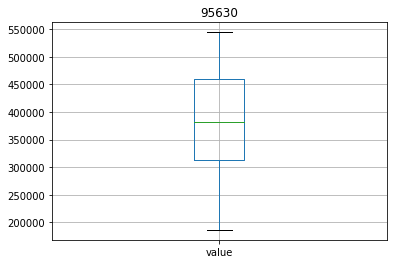

In [202]:
ts.boxplot(column = 'value')
plt.title(geog_area);


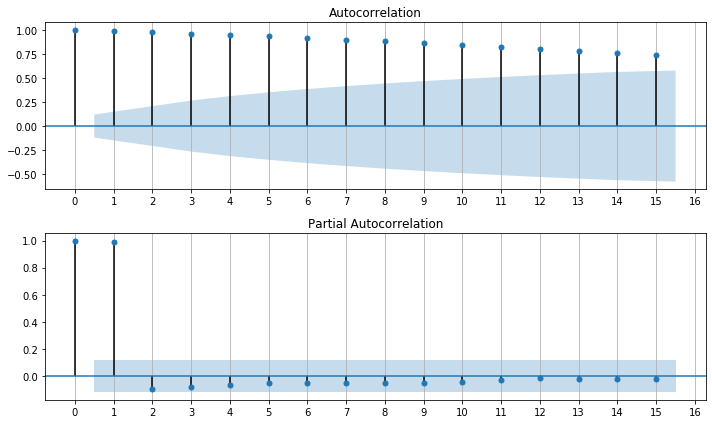

In [203]:
plot_acf_pacf(ts.value)

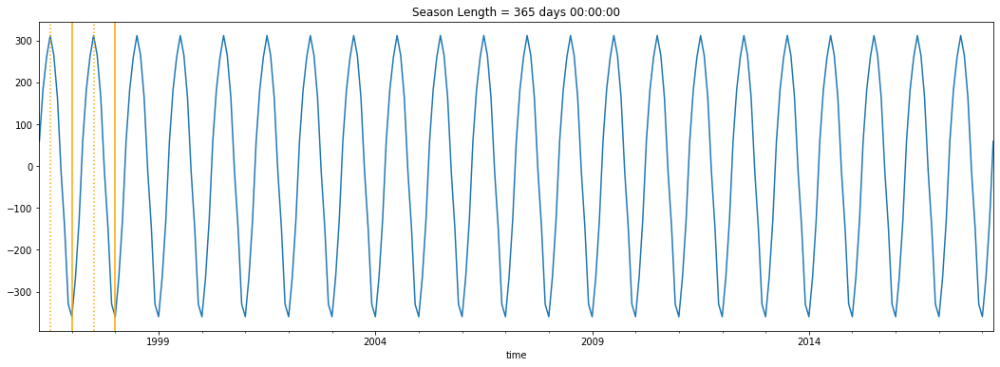

In [204]:
plot_seasonal_decomp(ts.value);

# Note that seasonality isn't much of a factor here; maximum difference of about $700 over the course of a year

### ARIMA parameters tuning

In [205]:
p_values = [0, 1, 2, 4, 6, 8, 10]
d_values = range(0, 3)
q_values = range(0, 3)


In [206]:
# order_tuples_95630, mse_results_95630, best_cfg_95630, best_score_95630 = eval_params_and_lists(ts.value, p_values, d_values, q_values)


From old notebook:  Best ARIMA(2, 2, 0) MSE=1373937.757

In [207]:
best_cfg = (2,2,0)

In [208]:
best_cfg

(2, 2, 0)

In [209]:
# results_table_95630 = pd.DataFrame({'Order':order_tuples_95630, 'MSEs':mse_results_95630})
# results_table_95630

### ARIMA modeling and forecasting results

In [210]:
print_results_lists()   # make sure that the lists are correct to this point

(['95616', '95619', '95864', '95831', '95811', '95818'],
 ['Davis',
  'Diamond Springs',
  'Arden-Arcade',
  'Sacramento_Pocket',
  'Sacramento_DosRios',
  'Sacramento_LandPark'],
 ['Yolo', 'El Dorado', 'Sacramento', 'Sacramento', 'Sacramento', 'Sacramento'],
 [(2, 1, 2), (2, 1, 2), (8, 0, 2), (6, 0, 2), (10, 1, 0), (6, 2, 2)],
 [717863.06, 355774.45, 449047.92, 389675.07, 570598.7, 558380.08],
 [619575.34, 275292.09, 327568.68, 302216.31, 459606.77, 418566.82],
 [816150.79, 436256.81, 570527.16, 477133.84, 681590.63, 698193.34],
 [692300.0, 321100.0, 552700.0, 449300.0, 567500.0, 563900.0],
 [3.69, 10.8, -18.75, -13.27, 0.55, -0.98],
 [-10.5, -14.27, -40.73, -32.74, -19.01, -25.77],
 [17.89, 35.86, 3.23, 6.19, 20.1, 23.82])

For 95630 (Folsom):
Best ARIMA order = (2, 2, 0)
                             ARIMA Model Results                              
Dep. Variable:               D2.value   No. Observations:                  263
Model:                 ARIMA(2, 2, 0)   Log Likelihood               -2168.670
Method:                       css-mle   S.D. of innovations            921.281
Date:                Tue, 17 Mar 2020   AIC                           4345.340
Time:                        15:19:59   BIC                           4359.628
Sample:                    06-01-1996   HQIC                          4351.082
                         - 04-01-2018                                         
                     coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------
const              2.8324     51.365      0.055      0.956     -97.841     103.506
ar.L1.D2.value     0.3846      0.054      7.165      0.000       0.279

(['95616', '95619', '95864', '95831', '95811', '95818', '95630'],
 ['Davis',
  'Diamond Springs',
  'Arden-Arcade',
  'Sacramento_Pocket',
  'Sacramento_DosRios',
  'Sacramento_LandPark',
  'Folsom'],
 ['Yolo',
  'El Dorado',
  'Sacramento',
  'Sacramento',
  'Sacramento',
  'Sacramento',
  'Sacramento'],
 [(2, 1, 2),
  (2, 1, 2),
  (8, 0, 2),
  (6, 0, 2),
  (10, 1, 0),
  (6, 2, 2),
  (2, 2, 0)],
 [717863.06, 355774.45, 449047.92, 389675.07, 570598.7, 558380.08, 545821.37],
 [619575.34, 275292.09, 327568.68, 302216.31, 459606.77, 418566.82, 427964.65],
 [816150.79, 436256.81, 570527.16, 477133.84, 681590.63, 698193.34, 663678.09],
 [692300.0, 321100.0, 552700.0, 449300.0, 567500.0, 563900.0, 542900.0],
 [3.69, 10.8, -18.75, -13.27, 0.55, -0.98, 0.54],
 [-10.5, -14.27, -40.73, -32.74, -19.01, -25.77, -21.17],
 [17.89, 35.86, 3.23, 6.19, 20.1, 23.82, 22.25])

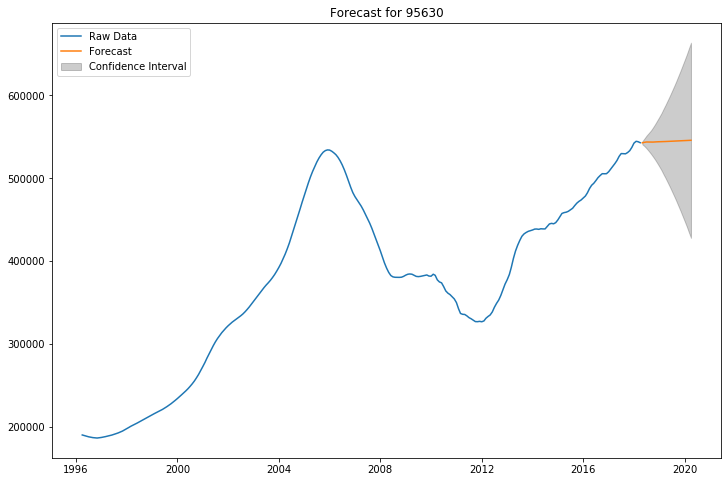

In [211]:
arima_forecast(ts, geog_area, city, county, p_values, d_values, q_values, best_cfg, confint=2, run_pdq = False)

### Zip code 95630:  Mediocre earning potential, significant downside risk (but equally possible upside risk)

By the model prediction, I would expect to see a 0.538% change in price by April 1, 2020.
At the lower bound of the confidence interval, I would expect to see a -21.171% change in price by April 1, 2020. 
At the upper bound of the confidence interval, I would expect to see a 22.247% change in price by April 1, 2020. 


In [ ]:
# print_results_lists()

## SacMetro:  96140 (Carnelian Bay) -- Definite investment opportunity¶

### Set up dataframe

In [212]:
geog_area = '96140'

In [213]:
city = 'Carnelian Bay'

In [214]:
county = 'Placer'

In [215]:
ts = df_sac.loc[df_sac['Zip'] == geog_area]

In [216]:
ts.head()

,Metro,MetroState,CountyName,City,Zip,value
time,,,,,,
1996-04-01,Sacramento,Sacramento CA,Placer,Carnelian Bay,96140,179100.0
1996-05-01,Sacramento,Sacramento CA,Placer,Carnelian Bay,96140,179000.0
1996-06-01,Sacramento,Sacramento CA,Placer,Carnelian Bay,96140,179000.0
1996-07-01,Sacramento,Sacramento CA,Placer,Carnelian Bay,96140,178900.0
1996-08-01,Sacramento,Sacramento CA,Placer,Carnelian Bay,96140,178900.0


In [217]:
ts = ts.resample('MS').asfreq()

In [218]:
ts.head()

,Metro,MetroState,CountyName,City,Zip,value
time,,,,,,
1996-04-01,Sacramento,Sacramento CA,Placer,Carnelian Bay,96140,179100.0
1996-05-01,Sacramento,Sacramento CA,Placer,Carnelian Bay,96140,179000.0
1996-06-01,Sacramento,Sacramento CA,Placer,Carnelian Bay,96140,179000.0
1996-07-01,Sacramento,Sacramento CA,Placer,Carnelian Bay,96140,178900.0
1996-08-01,Sacramento,Sacramento CA,Placer,Carnelian Bay,96140,178900.0


### Visualizations

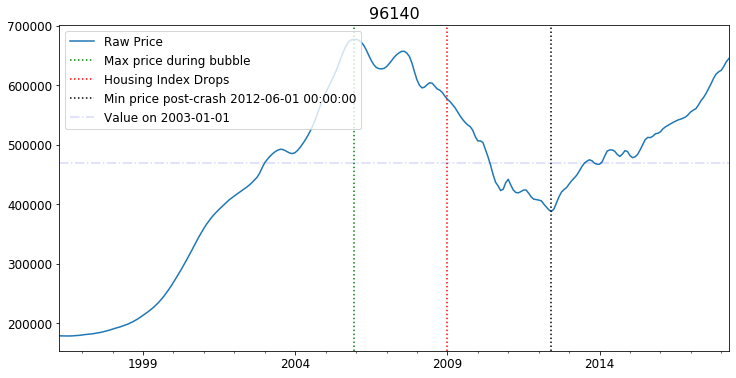

In [219]:
plot_single_geog(df_melt, geog_area, 'value', 'Zip', figsize=(12, 6), fontsize1=12, fontsize2=16)

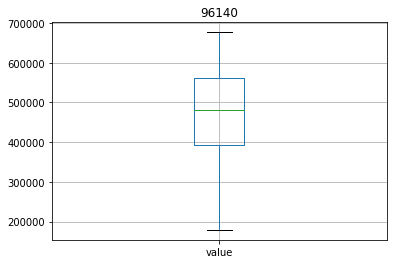

In [220]:
ts.boxplot(column = 'value')
plt.title(geog_area);


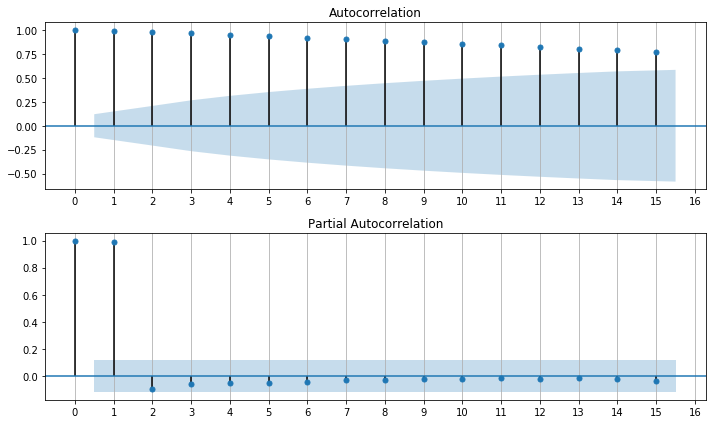

In [221]:
plot_acf_pacf(ts.value)

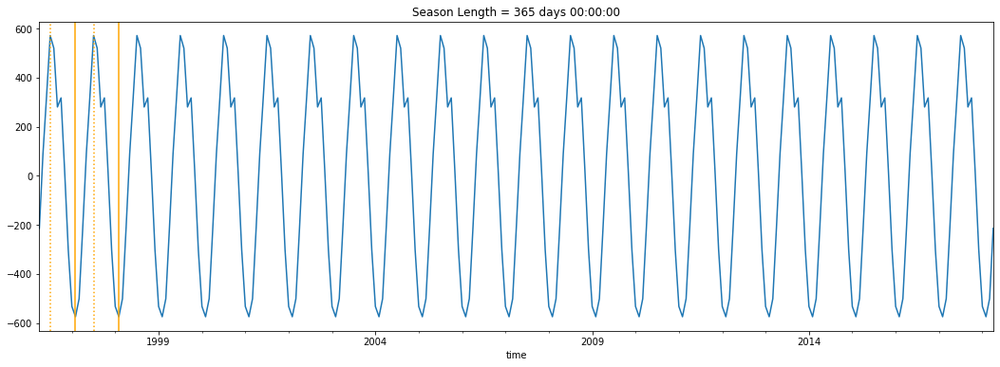

In [222]:
plot_seasonal_decomp(ts.value);

# Note that seasonality isn't much of a factor here; maximum difference of about $700 over the course of a year

### ARIMA parameters tuning

In [ ]:
p_values = [0, 1, 2, 4, 6, 8, 10]
d_values = range(0, 3)
q_values = range(0, 3)


In [ ]:
# order_tuples_96140, mse_results_96140, best_cfg_96140, best_score_96140 = eval_params_and_lists(ts.value, p_values, d_values, q_values)


From previous analyses:  Best ARIMA(4, 2, 1) MSE=3386317.647


In [223]:
# best_cfg = best_cfg_96140
best_cfg = (4,2,1)
best_cfg

(4, 2, 1)

In [224]:
# results_table_96140 = pd.DataFrame({'Order':order_tuples_96140, 'MSEs':mse_results_96140})
# results_table_96140

### ARIMA modeling and forecasting results

In [225]:
print_results_lists()   # make sure that the lists are correct to this point; 
                        # use pop_results_lists() to remove last item

(['95616', '95619', '95864', '95831', '95811', '95818', '95630'],
 ['Davis',
  'Diamond Springs',
  'Arden-Arcade',
  'Sacramento_Pocket',
  'Sacramento_DosRios',
  'Sacramento_LandPark',
  'Folsom'],
 ['Yolo',
  'El Dorado',
  'Sacramento',
  'Sacramento',
  'Sacramento',
  'Sacramento',
  'Sacramento'],
 [(2, 1, 2),
  (2, 1, 2),
  (8, 0, 2),
  (6, 0, 2),
  (10, 1, 0),
  (6, 2, 2),
  (2, 2, 0)],
 [717863.06, 355774.45, 449047.92, 389675.07, 570598.7, 558380.08, 545821.37],
 [619575.34, 275292.09, 327568.68, 302216.31, 459606.77, 418566.82, 427964.65],
 [816150.79, 436256.81, 570527.16, 477133.84, 681590.63, 698193.34, 663678.09],
 [692300.0, 321100.0, 552700.0, 449300.0, 567500.0, 563900.0, 542900.0],
 [3.69, 10.8, -18.75, -13.27, 0.55, -0.98, 0.54],
 [-10.5, -14.27, -40.73, -32.74, -19.01, -25.77, -21.17],
 [17.89, 35.86, 3.23, 6.19, 20.1, 23.82, 22.25])

For 96140 (Carnelian Bay):
Best ARIMA order = (4, 2, 1)
                             ARIMA Model Results                              
Dep. Variable:               D2.value   No. Observations:                  263
Model:                 ARIMA(4, 2, 1)   Log Likelihood               -2375.535
Method:                       css-mle   S.D. of innovations           2021.246
Date:                Tue, 17 Mar 2020   AIC                           4765.071
Time:                        15:21:04   BIC                           4790.076
Sample:                    06-01-1996   HQIC                          4775.120
                         - 04-01-2018                                         
                     coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------
const             20.1520    104.724      0.192      0.848    -185.103     225.407
ar.L1.D2.value     0.9100      0.152      5.981      0.000     

(['95616', '95619', '95864', '95831', '95811', '95818', '95630', '96140'],
 ['Davis',
  'Diamond Springs',
  'Arden-Arcade',
  'Sacramento_Pocket',
  'Sacramento_DosRios',
  'Sacramento_LandPark',
  'Folsom',
  'Carnelian Bay'],
 ['Yolo',
  'El Dorado',
  'Sacramento',
  'Sacramento',
  'Sacramento',
  'Sacramento',
  'Sacramento',
  'Placer'],
 [(2, 1, 2),
  (2, 1, 2),
  (8, 0, 2),
  (6, 0, 2),
  (10, 1, 0),
  (6, 2, 2),
  (2, 2, 0),
  (4, 2, 1)],
 [717863.06,
  355774.45,
  449047.92,
  389675.07,
  570598.7,
  558380.08,
  545821.37,
  769785.39],
 [619575.34,
  275292.09,
  327568.68,
  302216.31,
  459606.77,
  418566.82,
  427964.65,
  518008.87],
 [816150.79,
  436256.81,
  570527.16,
  477133.84,
  681590.63,
  698193.34,
  663678.09,
  1021561.92],
 [692300.0,
  321100.0,
  552700.0,
  449300.0,
  567500.0,
  563900.0,
  542900.0,
  644600.0],
 [3.69, 10.8, -18.75, -13.27, 0.55, -0.98, 0.54, 19.42],
 [-10.5, -14.27, -40.73, -32.74, -19.01, -25.77, -21.17, -19.64],
 [17.89, 35.

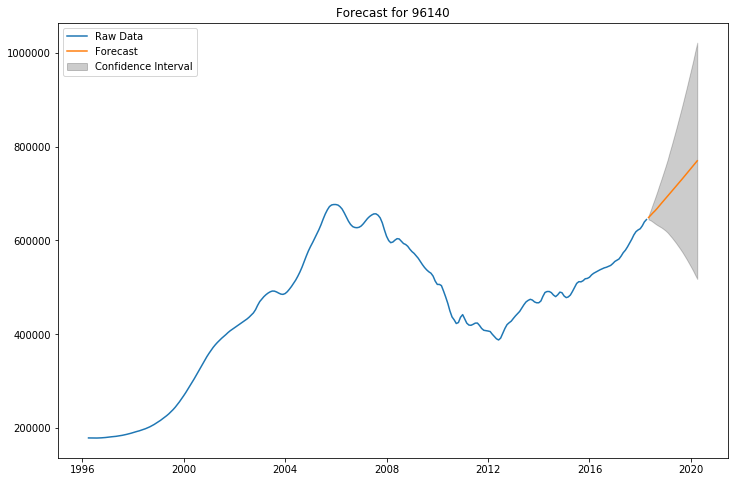

In [226]:
arima_forecast(ts, geog_area, city, county, p_values, d_values, q_values, best_cfg, confint=2, run_pdq = False)

### Zip code 96140 (Carnelian Bay):  Definite investment opportunity with potentially large upside returns

By the model prediction, I would expect to see a 19.421% change in price by April 1, 2020
At the lower bound of the confidence interval, I would expect to see a -19.639% change in price by April 1, 2020
At the upper bound of the confidence interval, I would expect to see a 58.48% change in price by April 1, 2020


## SacMetro:  95672 (Rescue) -- Solid investment opportunity 

### Set up dataframe

In [227]:
geog_area = '95672'

In [228]:
city = 'Rescue'

In [229]:
county = 'El Dorado'

In [230]:
ts = df_sac.loc[df_sac['Zip'] == geog_area]

In [231]:
ts.head()

,Metro,MetroState,CountyName,City,Zip,value
time,,,,,,
1996-04-01,Sacramento,Sacramento CA,El Dorado,Rescue,95672,196500.0
1996-05-01,Sacramento,Sacramento CA,El Dorado,Rescue,95672,196600.0
1996-06-01,Sacramento,Sacramento CA,El Dorado,Rescue,95672,196700.0
1996-07-01,Sacramento,Sacramento CA,El Dorado,Rescue,95672,196900.0
1996-08-01,Sacramento,Sacramento CA,El Dorado,Rescue,95672,197000.0


In [232]:
ts = ts.resample('MS').asfreq()

In [233]:
ts.head()

,Metro,MetroState,CountyName,City,Zip,value
time,,,,,,
1996-04-01,Sacramento,Sacramento CA,El Dorado,Rescue,95672,196500.0
1996-05-01,Sacramento,Sacramento CA,El Dorado,Rescue,95672,196600.0
1996-06-01,Sacramento,Sacramento CA,El Dorado,Rescue,95672,196700.0
1996-07-01,Sacramento,Sacramento CA,El Dorado,Rescue,95672,196900.0
1996-08-01,Sacramento,Sacramento CA,El Dorado,Rescue,95672,197000.0


### Visualizations

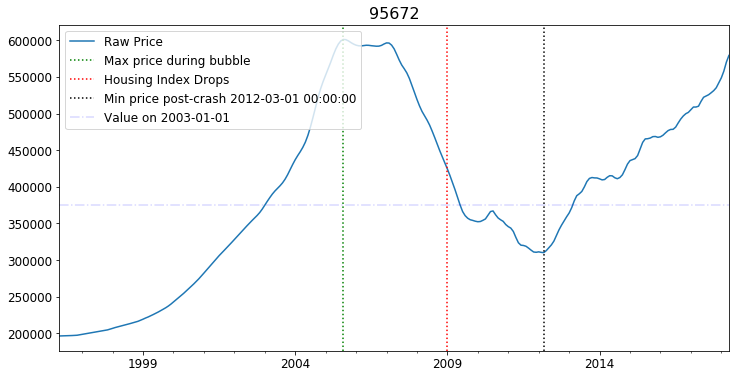

In [234]:
plot_single_geog(df_melt, geog_area, 'value', 'Zip', figsize=(12, 6), fontsize1=12, fontsize2=16)

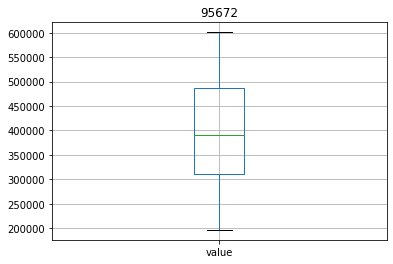

In [235]:
ts.boxplot(column = 'value')
plt.title(geog_area);


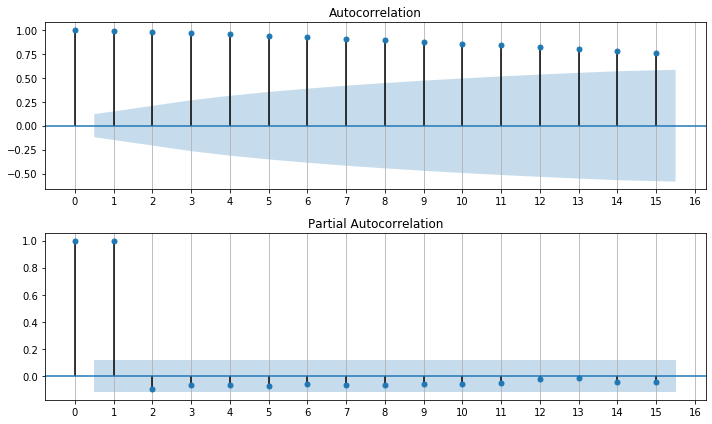

In [236]:
plot_acf_pacf(ts.value)

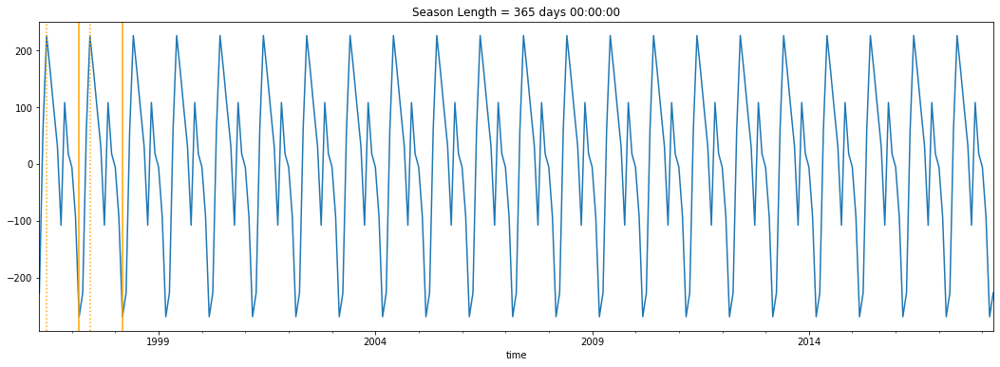

In [237]:
plot_seasonal_decomp(ts.value);

# Note that seasonality isn't much of a factor here; maximum difference of about $700 over the course of a year

### ARIMA parameters tuning

In [238]:
p_values = [0, 1, 2, 4, 6, 8, 10]
d_values = range(0, 3)
q_values = range(0, 3)


In [ ]:
# order_tuples_95672, mse_results_95672, best_cfg_95672, best_score_95672 = eval_params_and_lists(ts.value, p_values, d_values, q_values)


From previous analysis:  Best ARIMA(8, 2, 0) MSE=3175806.269

In [239]:
# best_cfg = best_cfg_95672
best_cfg = (8,2,0)
best_cfg

(8, 2, 0)

In [ ]:
# results_table_95672 = pd.DataFrame({'Order':order_tuples_95672, 'MSEs':mse_results_95672})
# results_table_95672

### ARIMA modeling and forecasting results

In [240]:
print_results_lists()   # make sure that the lists are correct to this point; 
                        # use pop_results_lists() to remove last item

(['95616', '95619', '95864', '95831', '95811', '95818', '95630', '96140'],
 ['Davis',
  'Diamond Springs',
  'Arden-Arcade',
  'Sacramento_Pocket',
  'Sacramento_DosRios',
  'Sacramento_LandPark',
  'Folsom',
  'Carnelian Bay'],
 ['Yolo',
  'El Dorado',
  'Sacramento',
  'Sacramento',
  'Sacramento',
  'Sacramento',
  'Sacramento',
  'Placer'],
 [(2, 1, 2),
  (2, 1, 2),
  (8, 0, 2),
  (6, 0, 2),
  (10, 1, 0),
  (6, 2, 2),
  (2, 2, 0),
  (4, 2, 1)],
 [717863.06,
  355774.45,
  449047.92,
  389675.07,
  570598.7,
  558380.08,
  545821.37,
  769785.39],
 [619575.34,
  275292.09,
  327568.68,
  302216.31,
  459606.77,
  418566.82,
  427964.65,
  518008.87],
 [816150.79,
  436256.81,
  570527.16,
  477133.84,
  681590.63,
  698193.34,
  663678.09,
  1021561.92],
 [692300.0,
  321100.0,
  552700.0,
  449300.0,
  567500.0,
  563900.0,
  542900.0,
  644600.0],
 [3.69, 10.8, -18.75, -13.27, 0.55, -0.98, 0.54, 19.42],
 [-10.5, -14.27, -40.73, -32.74, -19.01, -25.77, -21.17, -19.64],
 [17.89, 35.

For 95672 (Rescue):
Best ARIMA order = (8, 2, 0)
                             ARIMA Model Results                              
Dep. Variable:               D2.value   No. Observations:                  263
Model:                 ARIMA(8, 2, 0)   Log Likelihood               -2196.091
Method:                       css-mle   S.D. of innovations           1017.706
Date:                Tue, 17 Mar 2020   AIC                           4412.182
Time:                        15:22:18   BIC                           4447.903
Sample:                    06-01-1996   HQIC                          4426.537
                         - 04-01-2018                                         
                     coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------
const             28.0877    101.416      0.277      0.782    -170.684     226.859
ar.L1.D2.value     0.8942      0.059     15.057      0.000       0.778

(['95616',
  '95619',
  '95864',
  '95831',
  '95811',
  '95818',
  '95630',
  '96140',
  '95672'],
 ['Davis',
  'Diamond Springs',
  'Arden-Arcade',
  'Sacramento_Pocket',
  'Sacramento_DosRios',
  'Sacramento_LandPark',
  'Folsom',
  'Carnelian Bay',
  'Rescue'],
 ['Yolo',
  'El Dorado',
  'Sacramento',
  'Sacramento',
  'Sacramento',
  'Sacramento',
  'Sacramento',
  'Placer',
  'El Dorado'],
 [(2, 1, 2),
  (2, 1, 2),
  (8, 0, 2),
  (6, 0, 2),
  (10, 1, 0),
  (6, 2, 2),
  (2, 2, 0),
  (4, 2, 1),
  (8, 2, 0)],
 [717863.06,
  355774.45,
  449047.92,
  389675.07,
  570598.7,
  558380.08,
  545821.37,
  769785.39,
  766372.9],
 [619575.34,
  275292.09,
  327568.68,
  302216.31,
  459606.77,
  418566.82,
  427964.65,
  518008.87,
  562046.69],
 [816150.79,
  436256.81,
  570527.16,
  477133.84,
  681590.63,
  698193.34,
  663678.09,
  1021561.92,
  970699.1],
 [692300.0,
  321100.0,
  552700.0,
  449300.0,
  567500.0,
  563900.0,
  542900.0,
  644600.0,
  579300.0],
 [3.69, 10.8, -18.75,

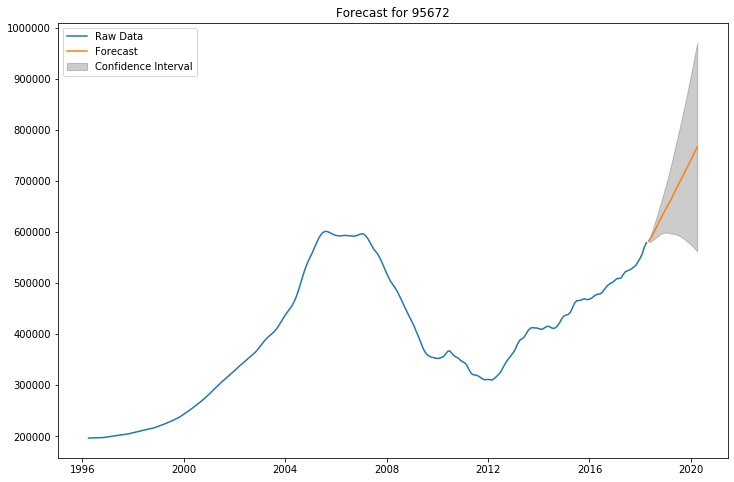

In [241]:
arima_forecast(ts, geog_area, city, county, p_values, d_values, q_values, best_cfg, confint=2, run_pdq = False)

### Zip code 95672 (Rescue):  Good investment opportunity

By the model prediction, I would expect to see a 32.296% change in price by April 1, 2020
At the lower bound of the confidence interval, I would expect to see a -2.975% change in price by April 1, 2020
At the upper bound of the confidence interval, I would expect to see a 67.567% change in price by April 1, 2020



## SacMetro:  95636 (Somerset) -- Potential investment opportunity

### Set up dataframe

In [242]:
geog_area = '95636'

In [243]:
city = 'Somerset'

In [244]:
county = 'El Dorado'

In [245]:
ts = df_sac.loc[df_sac['Zip'] == geog_area]

In [246]:
ts.head()

,Metro,MetroState,CountyName,City,Zip,value
time,,,,,,
1996-04-01,Sacramento,Sacramento CA,El Dorado,Somerset,95636,95100.0
1996-05-01,Sacramento,Sacramento CA,El Dorado,Somerset,95636,95400.0
1996-06-01,Sacramento,Sacramento CA,El Dorado,Somerset,95636,95600.0
1996-07-01,Sacramento,Sacramento CA,El Dorado,Somerset,95636,95900.0
1996-08-01,Sacramento,Sacramento CA,El Dorado,Somerset,95636,96200.0


In [247]:
ts = ts.resample('MS').asfreq()

In [248]:
ts.head()

,Metro,MetroState,CountyName,City,Zip,value
time,,,,,,
1996-04-01,Sacramento,Sacramento CA,El Dorado,Somerset,95636,95100.0
1996-05-01,Sacramento,Sacramento CA,El Dorado,Somerset,95636,95400.0
1996-06-01,Sacramento,Sacramento CA,El Dorado,Somerset,95636,95600.0
1996-07-01,Sacramento,Sacramento CA,El Dorado,Somerset,95636,95900.0
1996-08-01,Sacramento,Sacramento CA,El Dorado,Somerset,95636,96200.0


### Visualizations

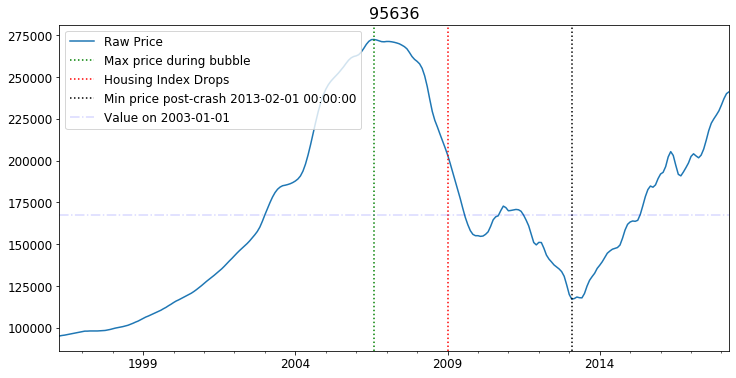

In [249]:
plot_single_geog(df_melt, geog_area, 'value', 'Zip', figsize=(12, 6), fontsize1=12, fontsize2=16)

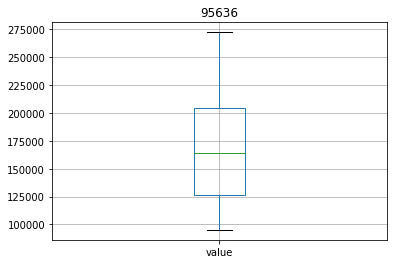

In [250]:
ts.boxplot(column = 'value')
plt.title(geog_area);


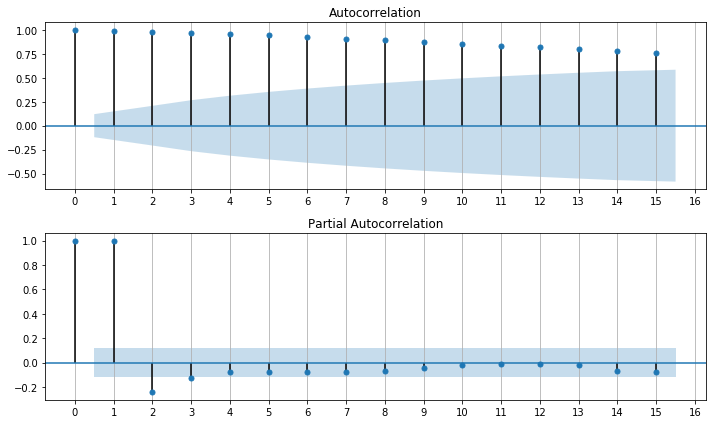

In [251]:
plot_acf_pacf(ts.value)

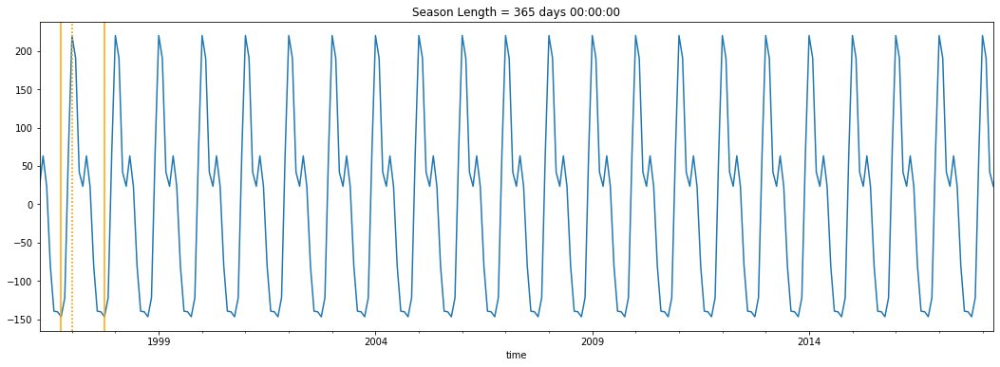

In [252]:
plot_seasonal_decomp(ts.value);

# Note that seasonality isn't much of a factor here; maximum difference of about $700 over the course of a year

### ARIMA parameters tuning

In [ ]:
p_values = [0, 1, 2, 4, 6, 8, 10]
d_values = range(0, 3)
q_values = range(0, 3)


In [ ]:
# order_tuples_95636, mse_results_95636, best_cfg_95636, best_score_95636 = eval_params_and_lists(ts.value, p_values, d_values, q_values)


From previous analyses:  Best ARIMA(8, 2, 1) MSE=1389280.792

In [253]:
# best_cfg = best_cfg_95636
best_cfg = (8,2,1)
best_cfg

(8, 2, 1)

In [ ]:
# results_table_95636 = pd.DataFrame({'Order':order_tuples_95636, 'MSEs':mse_results_95636})
# results_table_95636

### ARIMA modeling and forecasting results

In [254]:
print_results_lists()   # make sure that the lists are correct to this point; 
                        # use pop_results_lists() to remove last item

(['95616',
  '95619',
  '95864',
  '95831',
  '95811',
  '95818',
  '95630',
  '96140',
  '95672'],
 ['Davis',
  'Diamond Springs',
  'Arden-Arcade',
  'Sacramento_Pocket',
  'Sacramento_DosRios',
  'Sacramento_LandPark',
  'Folsom',
  'Carnelian Bay',
  'Rescue'],
 ['Yolo',
  'El Dorado',
  'Sacramento',
  'Sacramento',
  'Sacramento',
  'Sacramento',
  'Sacramento',
  'Placer',
  'El Dorado'],
 [(2, 1, 2),
  (2, 1, 2),
  (8, 0, 2),
  (6, 0, 2),
  (10, 1, 0),
  (6, 2, 2),
  (2, 2, 0),
  (4, 2, 1),
  (8, 2, 0)],
 [717863.06,
  355774.45,
  449047.92,
  389675.07,
  570598.7,
  558380.08,
  545821.37,
  769785.39,
  766372.9],
 [619575.34,
  275292.09,
  327568.68,
  302216.31,
  459606.77,
  418566.82,
  427964.65,
  518008.87,
  562046.69],
 [816150.79,
  436256.81,
  570527.16,
  477133.84,
  681590.63,
  698193.34,
  663678.09,
  1021561.92,
  970699.1],
 [692300.0,
  321100.0,
  552700.0,
  449300.0,
  567500.0,
  563900.0,
  542900.0,
  644600.0,
  579300.0],
 [3.69, 10.8, -18.75,

For 95636 (Somerset):
Best ARIMA order = (8, 2, 1)
                             ARIMA Model Results                              
Dep. Variable:               D2.value   No. Observations:                  263
Model:                 ARIMA(8, 2, 1)   Log Likelihood               -2096.633
Method:                       css-mle   S.D. of innovations            697.343
Date:                Tue, 17 Mar 2020   AIC                           4215.265
Time:                        15:23:02   BIC                           4254.559
Sample:                    06-01-1996   HQIC                          4231.057
                         - 04-01-2018                                         
                     coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------
const              2.4022     54.241      0.044      0.965    -103.909     108.713
ar.L1.D2.value     1.1070      0.131      8.455      0.000       0.8

(['95616',
  '95619',
  '95864',
  '95831',
  '95811',
  '95818',
  '95630',
  '96140',
  '95672',
  '95636'],
 ['Davis',
  'Diamond Springs',
  'Arden-Arcade',
  'Sacramento_Pocket',
  'Sacramento_DosRios',
  'Sacramento_LandPark',
  'Folsom',
  'Carnelian Bay',
  'Rescue',
  'Somerset'],
 ['Yolo',
  'El Dorado',
  'Sacramento',
  'Sacramento',
  'Sacramento',
  'Sacramento',
  'Sacramento',
  'Placer',
  'El Dorado',
  'El Dorado'],
 [(2, 1, 2),
  (2, 1, 2),
  (8, 0, 2),
  (6, 0, 2),
  (10, 1, 0),
  (6, 2, 2),
  (2, 2, 0),
  (4, 2, 1),
  (8, 2, 0),
  (8, 2, 1)],
 [717863.06,
  355774.45,
  449047.92,
  389675.07,
  570598.7,
  558380.08,
  545821.37,
  769785.39,
  766372.9,
  268239.06],
 [619575.34,
  275292.09,
  327568.68,
  302216.31,
  459606.77,
  418566.82,
  427964.65,
  518008.87,
  562046.69,
  148993.04],
 [816150.79,
  436256.81,
  570527.16,
  477133.84,
  681590.63,
  698193.34,
  663678.09,
  1021561.92,
  970699.1,
  387485.09],
 [692300.0,
  321100.0,
  552700.0,
  

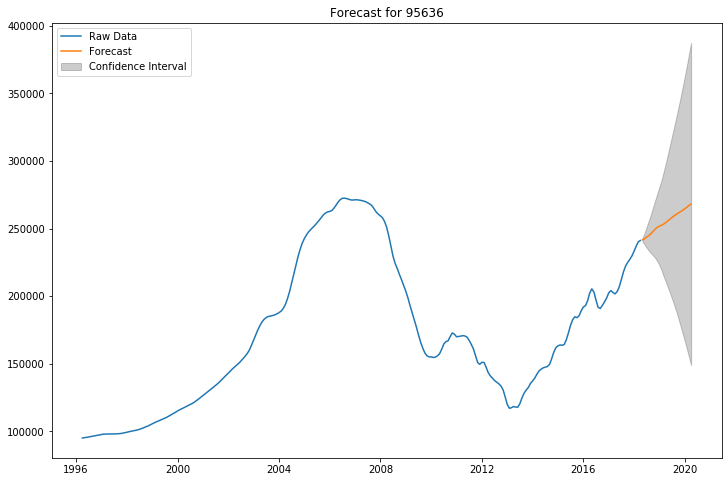

In [255]:
arima_forecast(ts, geog_area, city, county, p_values, d_values, q_values, best_cfg, confint=2, run_pdq = False)

### Zip code 95636:  Good return predicted, but has very large potential downside (as well as large potential upside)

By the model prediction, I would expect to see a 11.207% change in price by April 1, 2020
At the lower bound of the confidence interval, I would expect to see a -38.231% change in price by April 1, 2020
At the upper bound of the confidence interval, I would expect to see a 60.646% change in price by April 1, 2020




In [256]:
print_results_lists()

(['95616',
  '95619',
  '95864',
  '95831',
  '95811',
  '95818',
  '95630',
  '96140',
  '95672',
  '95636'],
 ['Davis',
  'Diamond Springs',
  'Arden-Arcade',
  'Sacramento_Pocket',
  'Sacramento_DosRios',
  'Sacramento_LandPark',
  'Folsom',
  'Carnelian Bay',
  'Rescue',
  'Somerset'],
 ['Yolo',
  'El Dorado',
  'Sacramento',
  'Sacramento',
  'Sacramento',
  'Sacramento',
  'Sacramento',
  'Placer',
  'El Dorado',
  'El Dorado'],
 [(2, 1, 2),
  (2, 1, 2),
  (8, 0, 2),
  (6, 0, 2),
  (10, 1, 0),
  (6, 2, 2),
  (2, 2, 0),
  (4, 2, 1),
  (8, 2, 0),
  (8, 2, 1)],
 [717863.06,
  355774.45,
  449047.92,
  389675.07,
  570598.7,
  558380.08,
  545821.37,
  769785.39,
  766372.9,
  268239.06],
 [619575.34,
  275292.09,
  327568.68,
  302216.31,
  459606.77,
  418566.82,
  427964.65,
  518008.87,
  562046.69,
  148993.04],
 [816150.79,
  436256.81,
  570527.16,
  477133.84,
  681590.63,
  698193.34,
  663678.09,
  1021561.92,
  970699.1,
  387485.09],
 [692300.0,
  321100.0,
  552700.0,
  

## SacMetro:  95709 (Camino) -- Don't invest

### Set up dataframe

In [257]:
geog_area = '95709'

In [258]:
city = 'Camino'

In [259]:
county = 'El Dorado'

In [260]:
ts = df_sac.loc[df_sac['Zip'] == geog_area]

In [261]:
ts.head()

,Metro,MetroState,CountyName,City,Zip,value
time,,,,,,
1996-04-01,Sacramento,Sacramento CA,El Dorado,Camino,95709,141500.0
1996-05-01,Sacramento,Sacramento CA,El Dorado,Camino,95709,141500.0
1996-06-01,Sacramento,Sacramento CA,El Dorado,Camino,95709,141500.0
1996-07-01,Sacramento,Sacramento CA,El Dorado,Camino,95709,141500.0
1996-08-01,Sacramento,Sacramento CA,El Dorado,Camino,95709,141600.0


In [262]:
ts = ts.resample('MS').asfreq()

In [263]:
ts.head()

,Metro,MetroState,CountyName,City,Zip,value
time,,,,,,
1996-04-01,Sacramento,Sacramento CA,El Dorado,Camino,95709,141500.0
1996-05-01,Sacramento,Sacramento CA,El Dorado,Camino,95709,141500.0
1996-06-01,Sacramento,Sacramento CA,El Dorado,Camino,95709,141500.0
1996-07-01,Sacramento,Sacramento CA,El Dorado,Camino,95709,141500.0
1996-08-01,Sacramento,Sacramento CA,El Dorado,Camino,95709,141600.0


### Visualizations

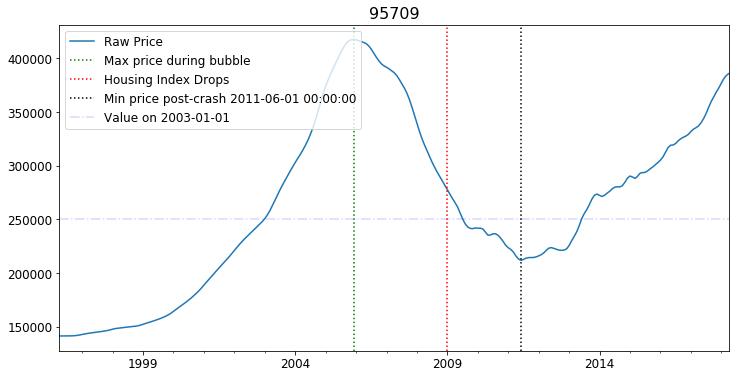

In [264]:
plot_single_geog(df_melt, geog_area, 'value', 'Zip', figsize=(12, 6), fontsize1=12, fontsize2=16)

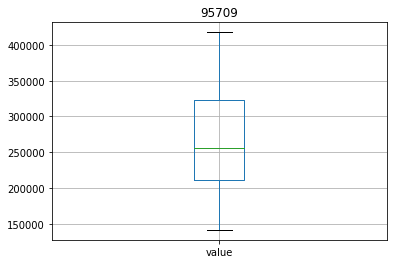

In [265]:
ts.boxplot(column = 'value')
plt.title(geog_area);


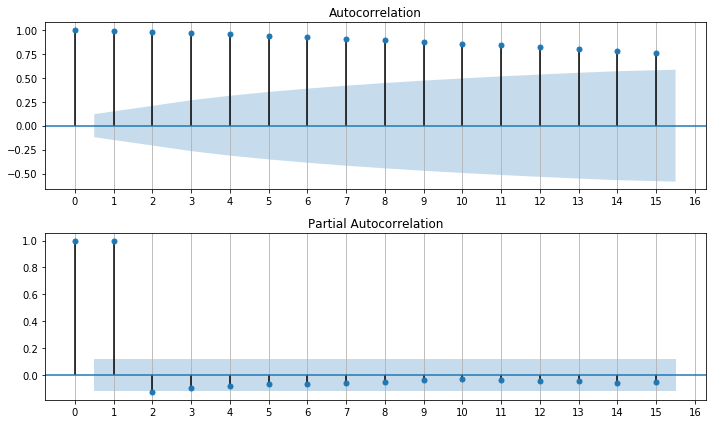

In [266]:
plot_acf_pacf(ts.value)

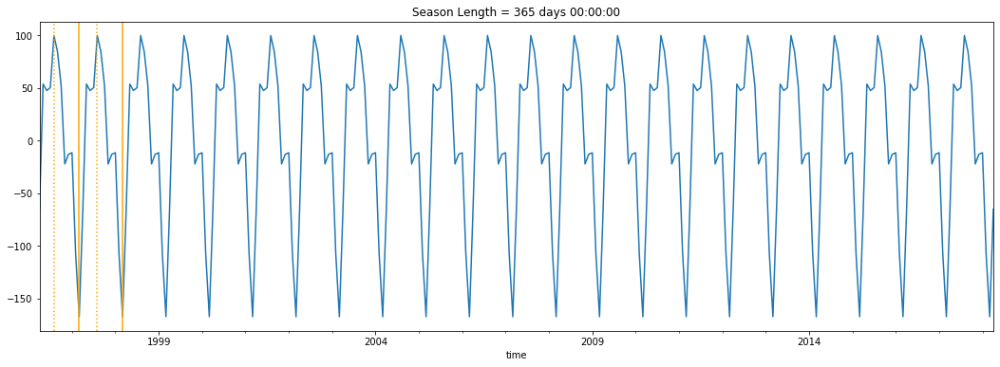

In [267]:
plot_seasonal_decomp(ts.value);

# Note that seasonality isn't much of a factor here; maximum difference of about $700 over the course of a year

### ARIMA parameters tuning

In [268]:
p_values = [0, 1, 2, 4, 6, 8, 10]
d_values = range(0, 3)
q_values = range(0, 3)


In [ ]:
# order_tuples_95709, mse_results_95709, best_cfg_95709, best_score_95709 = eval_params_and_lists(ts.value, p_values, d_values, q_values)


From previous analyses:  Best ARIMA(8, 0, 2) MSE=717546.010

In [269]:
# best_cfg = best_cfg_95709
best_cfg = (8,0,2)
best_cfg

(8, 0, 2)

In [ ]:
# results_table_95709 = pd.DataFrame({'Order':order_tuples_95709, 'MSEs':mse_results_95709})
# results_table_95709

### ARIMA modeling and forecasting results

In [270]:
print_results_lists()   # make sure that the lists are correct to this point; 
                        # use pop_results_lists() to remove last item

(['95616',
  '95619',
  '95864',
  '95831',
  '95811',
  '95818',
  '95630',
  '96140',
  '95672',
  '95636'],
 ['Davis',
  'Diamond Springs',
  'Arden-Arcade',
  'Sacramento_Pocket',
  'Sacramento_DosRios',
  'Sacramento_LandPark',
  'Folsom',
  'Carnelian Bay',
  'Rescue',
  'Somerset'],
 ['Yolo',
  'El Dorado',
  'Sacramento',
  'Sacramento',
  'Sacramento',
  'Sacramento',
  'Sacramento',
  'Placer',
  'El Dorado',
  'El Dorado'],
 [(2, 1, 2),
  (2, 1, 2),
  (8, 0, 2),
  (6, 0, 2),
  (10, 1, 0),
  (6, 2, 2),
  (2, 2, 0),
  (4, 2, 1),
  (8, 2, 0),
  (8, 2, 1)],
 [717863.06,
  355774.45,
  449047.92,
  389675.07,
  570598.7,
  558380.08,
  545821.37,
  769785.39,
  766372.9,
  268239.06],
 [619575.34,
  275292.09,
  327568.68,
  302216.31,
  459606.77,
  418566.82,
  427964.65,
  518008.87,
  562046.69,
  148993.04],
 [816150.79,
  436256.81,
  570527.16,
  477133.84,
  681590.63,
  698193.34,
  663678.09,
  1021561.92,
  970699.1,
  387485.09],
 [692300.0,
  321100.0,
  552700.0,
  

For 95709 (Camino):
Best ARIMA order = (8, 0, 2)
                              ARMA Model Results                              
Dep. Variable:                  value   No. Observations:                  265
Model:                     ARMA(8, 2)   Log Likelihood               -2059.931
Method:                       css-mle   S.D. of innovations            558.064
Date:                Tue, 17 Mar 2020   AIC                           4143.862
Time:                        15:25:32   BIC                           4186.819
Sample:                    04-01-1996   HQIC                          4161.121
                         - 04-01-2018                                         
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
const        2.634e+05   4.03e+04      6.534      0.000    1.84e+05    3.42e+05
ar.L1.value     1.1583      2.590      0.447      0.655      -3.918       6.234

(['95616',
  '95619',
  '95864',
  '95831',
  '95811',
  '95818',
  '95630',
  '96140',
  '95672',
  '95636',
  '95709'],
 ['Davis',
  'Diamond Springs',
  'Arden-Arcade',
  'Sacramento_Pocket',
  'Sacramento_DosRios',
  'Sacramento_LandPark',
  'Folsom',
  'Carnelian Bay',
  'Rescue',
  'Somerset',
  'Camino'],
 ['Yolo',
  'El Dorado',
  'Sacramento',
  'Sacramento',
  'Sacramento',
  'Sacramento',
  'Sacramento',
  'Placer',
  'El Dorado',
  'El Dorado',
  'El Dorado'],
 [(2, 1, 2),
  (2, 1, 2),
  (8, 0, 2),
  (6, 0, 2),
  (10, 1, 0),
  (6, 2, 2),
  (2, 2, 0),
  (4, 2, 1),
  (8, 2, 0),
  (8, 2, 1),
  (8, 0, 2)],
 [717863.06,
  355774.45,
  449047.92,
  389675.07,
  570598.7,
  558380.08,
  545821.37,
  769785.39,
  766372.9,
  268239.06,
  385671.99],
 [619575.34,
  275292.09,
  327568.68,
  302216.31,
  459606.77,
  418566.82,
  427964.65,
  518008.87,
  562046.69,
  148993.04,
  305444.97],
 [816150.79,
  436256.81,
  570527.16,
  477133.84,
  681590.63,
  698193.34,
  663678.09,
 

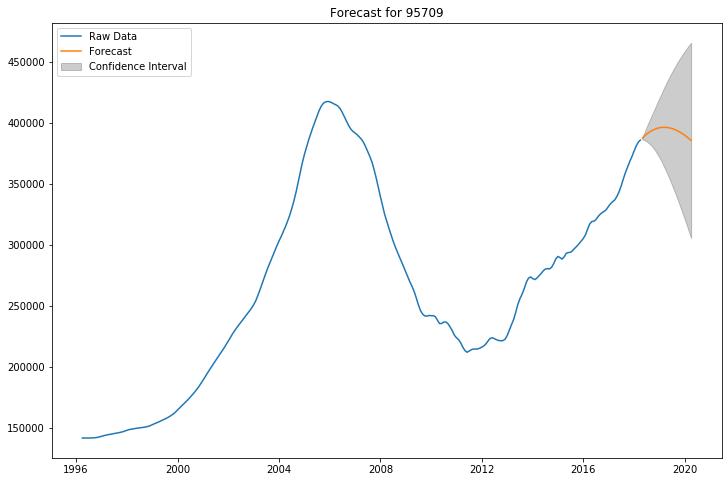

In [271]:
arima_forecast(ts, geog_area, city, county, p_values, d_values, q_values, best_cfg, confint=2, run_pdq = False)

### Zip code 95709 (Camino):  Don't invest

By the model prediction, I would expect to see a -0.349% change in price by April 1, 2020
At the lower bound of the confidence interval, I would expect to see a -21.147% change in price by April 1, 2020
At the upper bound of the confidence interval, I would expect to see a 20.448% change in price by April 1, 2020


## SacMetro:  95746 (Granite Bay) -- Solid investment opportunity

### Set up dataframe

In [272]:
geog_area = '95746'

In [273]:
city = 'Granite Bay'

In [274]:
county = 'Placer'

In [275]:
ts = df_sac.loc[df_sac['Zip'] == geog_area]

In [276]:
ts.head()

,Metro,MetroState,CountyName,City,Zip,value
time,,,,,,
1996-04-01,Sacramento,Sacramento CA,Placer,Granite Bay,95746,292000.0
1996-05-01,Sacramento,Sacramento CA,Placer,Granite Bay,95746,289600.0
1996-06-01,Sacramento,Sacramento CA,Placer,Granite Bay,95746,287300.0
1996-07-01,Sacramento,Sacramento CA,Placer,Granite Bay,95746,285400.0
1996-08-01,Sacramento,Sacramento CA,Placer,Granite Bay,95746,283900.0


In [277]:
ts = ts.resample('MS').asfreq()

In [278]:
ts.head()

,Metro,MetroState,CountyName,City,Zip,value
time,,,,,,
1996-04-01,Sacramento,Sacramento CA,Placer,Granite Bay,95746,292000.0
1996-05-01,Sacramento,Sacramento CA,Placer,Granite Bay,95746,289600.0
1996-06-01,Sacramento,Sacramento CA,Placer,Granite Bay,95746,287300.0
1996-07-01,Sacramento,Sacramento CA,Placer,Granite Bay,95746,285400.0
1996-08-01,Sacramento,Sacramento CA,Placer,Granite Bay,95746,283900.0


### Visualizations

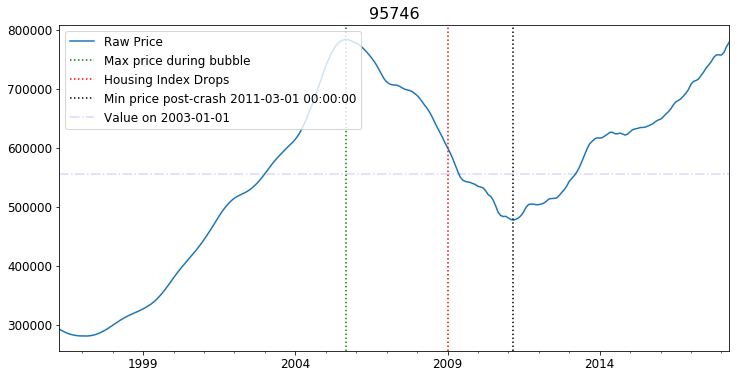

In [279]:
plot_single_geog(df_melt, geog_area, 'value', 'Zip', figsize=(12, 6), fontsize1=12, fontsize2=16)

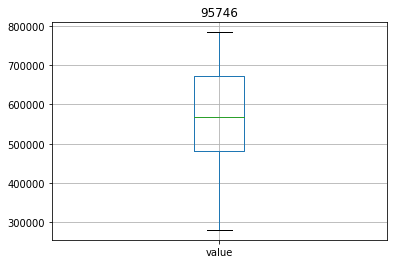

In [280]:
ts.boxplot(column = 'value')
plt.title(geog_area);


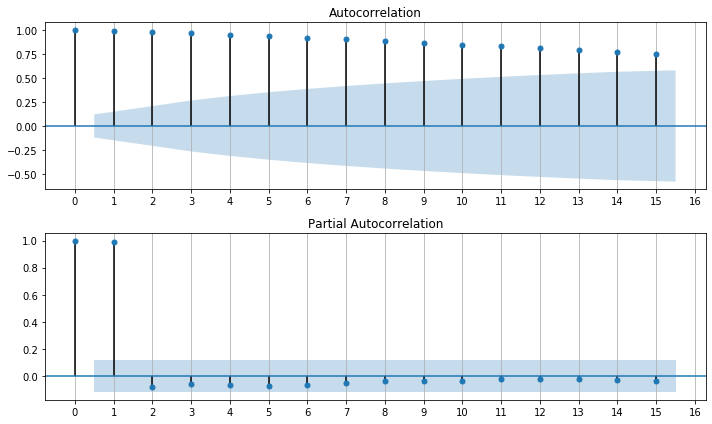

In [281]:
plot_acf_pacf(ts.value)

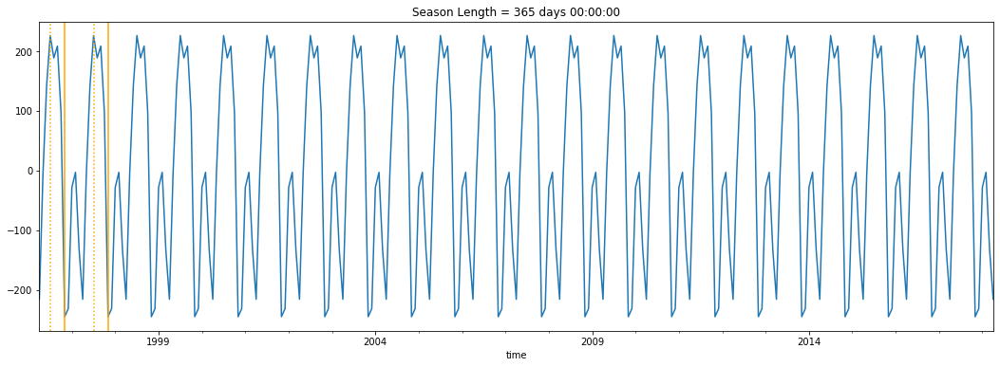

In [282]:
plot_seasonal_decomp(ts.value);

# Note that seasonality isn't much of a factor here; maximum difference of about $700 over the course of a year

### ARIMA parameters tuning

In [ ]:
p_values = [0, 1, 2, 4, 6, 8, 10]
d_values = range(0, 3)
q_values = range(0, 3)


In [ ]:
# order_tuples_95746, mse_results_95746, best_cfg_95746, best_score_95746 = eval_params_and_lists(ts.value, p_values, d_values, q_values)


From previous analyses:  Best ARIMA(6, 1, 2) MSE=3329403.484

In [283]:
best_cfg = (6, 1, 2)
best_cfg

(6, 1, 2)

In [ ]:
# results_table_95746 = pd.DataFrame({'Order':order_tuples_95746, 'MSEs':mse_results_95746})
# results_table_95746

### ARIMA modeling and forecasting results

In [284]:
print_results_lists()   # make sure that the lists are correct to this point; 
                        # use pop_results_lists() to remove last item

(['95616',
  '95619',
  '95864',
  '95831',
  '95811',
  '95818',
  '95630',
  '96140',
  '95672',
  '95636',
  '95709'],
 ['Davis',
  'Diamond Springs',
  'Arden-Arcade',
  'Sacramento_Pocket',
  'Sacramento_DosRios',
  'Sacramento_LandPark',
  'Folsom',
  'Carnelian Bay',
  'Rescue',
  'Somerset',
  'Camino'],
 ['Yolo',
  'El Dorado',
  'Sacramento',
  'Sacramento',
  'Sacramento',
  'Sacramento',
  'Sacramento',
  'Placer',
  'El Dorado',
  'El Dorado',
  'El Dorado'],
 [(2, 1, 2),
  (2, 1, 2),
  (8, 0, 2),
  (6, 0, 2),
  (10, 1, 0),
  (6, 2, 2),
  (2, 2, 0),
  (4, 2, 1),
  (8, 2, 0),
  (8, 2, 1),
  (8, 0, 2)],
 [717863.06,
  355774.45,
  449047.92,
  389675.07,
  570598.7,
  558380.08,
  545821.37,
  769785.39,
  766372.9,
  268239.06,
  385671.99],
 [619575.34,
  275292.09,
  327568.68,
  302216.31,
  459606.77,
  418566.82,
  427964.65,
  518008.87,
  562046.69,
  148993.04,
  305444.97],
 [816150.79,
  436256.81,
  570527.16,
  477133.84,
  681590.63,
  698193.34,
  663678.09,
 

For 95746 (Granite Bay):
Best ARIMA order = (6, 1, 2)
                             ARIMA Model Results                              
Dep. Variable:                D.value   No. Observations:                  264
Model:                 ARIMA(6, 1, 2)   Log Likelihood               -2240.772
Method:                       css-mle   S.D. of innovations           1155.648
Date:                Tue, 17 Mar 2020   AIC                           4501.543
Time:                        15:26:45   BIC                           4537.303
Sample:                    05-01-1996   HQIC                          4515.912
                         - 04-01-2018                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
const          1842.7811   1706.790      1.080      0.281   -1502.466    5188.028
ar.L1.D.value    -0.0528      0.066     -0.805      0.422      -0.18

(['95616',
  '95619',
  '95864',
  '95831',
  '95811',
  '95818',
  '95630',
  '96140',
  '95672',
  '95636',
  '95709',
  '95746'],
 ['Davis',
  'Diamond Springs',
  'Arden-Arcade',
  'Sacramento_Pocket',
  'Sacramento_DosRios',
  'Sacramento_LandPark',
  'Folsom',
  'Carnelian Bay',
  'Rescue',
  'Somerset',
  'Camino',
  'Granite Bay'],
 ['Yolo',
  'El Dorado',
  'Sacramento',
  'Sacramento',
  'Sacramento',
  'Sacramento',
  'Sacramento',
  'Placer',
  'El Dorado',
  'El Dorado',
  'El Dorado',
  'Placer'],
 [(2, 1, 2),
  (2, 1, 2),
  (8, 0, 2),
  (6, 0, 2),
  (10, 1, 0),
  (6, 2, 2),
  (2, 2, 0),
  (4, 2, 1),
  (8, 2, 0),
  (8, 2, 1),
  (8, 0, 2),
  (6, 1, 2)],
 [717863.06,
  355774.45,
  449047.92,
  389675.07,
  570598.7,
  558380.08,
  545821.37,
  769785.39,
  766372.9,
  268239.06,
  385671.99,
  840052.01],
 [619575.34,
  275292.09,
  327568.68,
  302216.31,
  459606.77,
  418566.82,
  427964.65,
  518008.87,
  562046.69,
  148993.04,
  305444.97,
  704070.95],
 [816150.79,


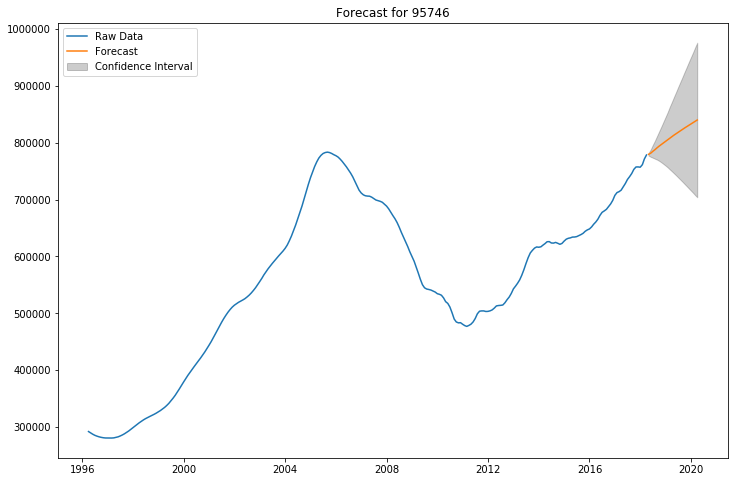

In [285]:
arima_forecast(ts, geog_area, city, county, p_values, d_values, q_values, best_cfg, confint=2, run_pdq = False)

### Zip code 95746 (Granite Bay):  Solid investment opportunity

By the model prediction, I would expect to see a 7.906% change in price by April 1, 2020.
At the lower bound of the confidence interval, I would expect to see a -9.561% change in price by April 1, 2020.
At the upper bound of the confidence interval, I would expect to see a 25.374% change in price by April 1, 2020.

## SacMetro:  95614 (Cool) -- Not a great investment opportunity

### Set up dataframe

In [286]:
geog_area = '95614'

In [287]:
city = 'Cool'

In [288]:
county = 'El Dorado'

In [289]:
ts = df_sac.loc[df_sac['Zip'] == geog_area]

In [290]:
ts.head()

,Metro,MetroState,CountyName,City,Zip,value
time,,,,,,
1996-04-01,Sacramento,Sacramento CA,El Dorado,Cool,95614,157500.0
1996-05-01,Sacramento,Sacramento CA,El Dorado,Cool,95614,157200.0
1996-06-01,Sacramento,Sacramento CA,El Dorado,Cool,95614,156900.0
1996-07-01,Sacramento,Sacramento CA,El Dorado,Cool,95614,156700.0
1996-08-01,Sacramento,Sacramento CA,El Dorado,Cool,95614,156400.0


In [291]:
ts = ts.resample('MS').asfreq()

In [292]:
ts.head()

,Metro,MetroState,CountyName,City,Zip,value
time,,,,,,
1996-04-01,Sacramento,Sacramento CA,El Dorado,Cool,95614,157500.0
1996-05-01,Sacramento,Sacramento CA,El Dorado,Cool,95614,157200.0
1996-06-01,Sacramento,Sacramento CA,El Dorado,Cool,95614,156900.0
1996-07-01,Sacramento,Sacramento CA,El Dorado,Cool,95614,156700.0
1996-08-01,Sacramento,Sacramento CA,El Dorado,Cool,95614,156400.0


### Visualizations

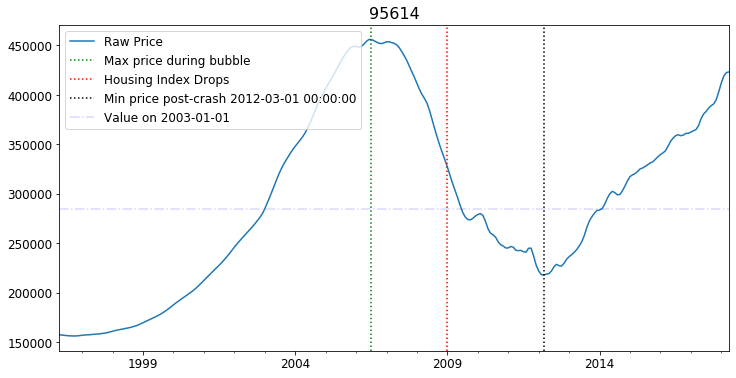

In [293]:
plot_single_geog(df_melt, geog_area, 'value', 'Zip', figsize=(12, 6), fontsize1=12, fontsize2=16)

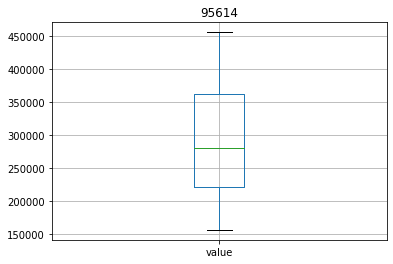

In [294]:
ts.boxplot(column = 'value')
plt.title(geog_area);


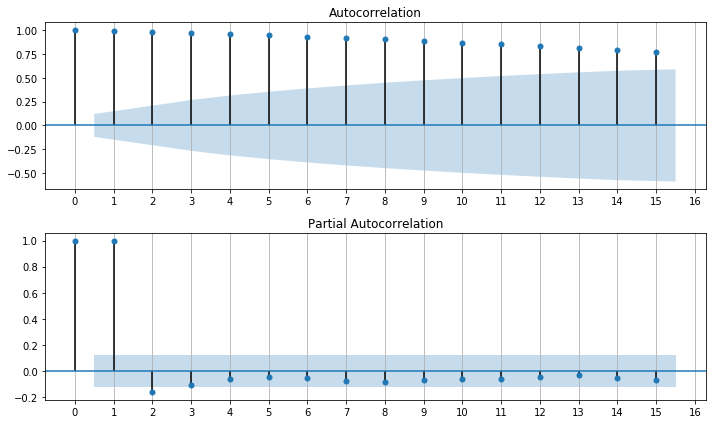

In [295]:
plot_acf_pacf(ts.value)

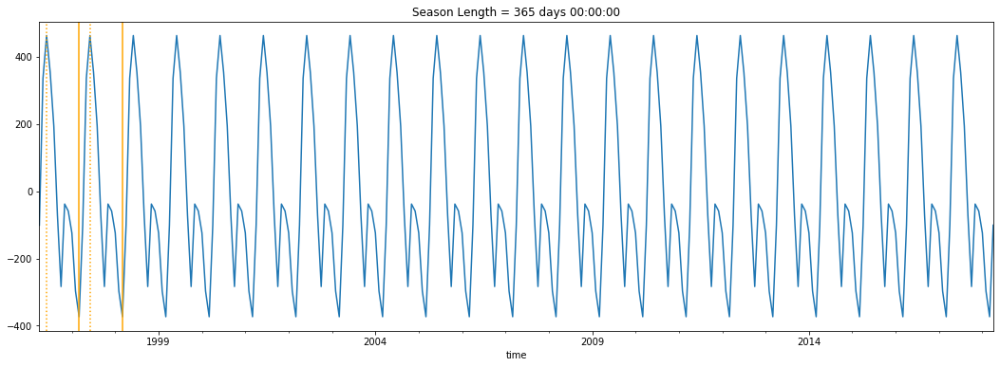

In [296]:
plot_seasonal_decomp(ts.value);

# Note that seasonality isn't much of a factor here; maximum difference of about $700 over the course of a year

### ARIMA parameters tuning

In [3]:
p_values = [0, 1, 2, 4, 6, 8, 10]
d_values = range(0, 3)
q_values = range(0, 3)


In [ ]:
# order_tuples_95614, mse_results_95614, best_cfg_95614, best_score_95614 = eval_params_and_lists(ts.value, p_values, d_values, q_values)


From previous analyses:   Best ARIMA(8, 0, 2) MSE=1365126.920

In [297]:
# best_cfg = best_cfg_95614
best_cfg = (8,0,2)
best_cfg

(8, 0, 2)

In [ ]:
# results_table_95614 = pd.DataFrame({'Order':order_tuples_95614, 'MSEs':mse_results_95614})
# results_table_95614

### ARIMA modeling and forecasting results

In [298]:
print_results_lists()   # make sure that the lists are correct to this point; 
                        # use pop_results_lists() to remove last item

(['95616',
  '95619',
  '95864',
  '95831',
  '95811',
  '95818',
  '95630',
  '96140',
  '95672',
  '95636',
  '95709',
  '95746'],
 ['Davis',
  'Diamond Springs',
  'Arden-Arcade',
  'Sacramento_Pocket',
  'Sacramento_DosRios',
  'Sacramento_LandPark',
  'Folsom',
  'Carnelian Bay',
  'Rescue',
  'Somerset',
  'Camino',
  'Granite Bay'],
 ['Yolo',
  'El Dorado',
  'Sacramento',
  'Sacramento',
  'Sacramento',
  'Sacramento',
  'Sacramento',
  'Placer',
  'El Dorado',
  'El Dorado',
  'El Dorado',
  'Placer'],
 [(2, 1, 2),
  (2, 1, 2),
  (8, 0, 2),
  (6, 0, 2),
  (10, 1, 0),
  (6, 2, 2),
  (2, 2, 0),
  (4, 2, 1),
  (8, 2, 0),
  (8, 2, 1),
  (8, 0, 2),
  (6, 1, 2)],
 [717863.06,
  355774.45,
  449047.92,
  389675.07,
  570598.7,
  558380.08,
  545821.37,
  769785.39,
  766372.9,
  268239.06,
  385671.99,
  840052.01],
 [619575.34,
  275292.09,
  327568.68,
  302216.31,
  459606.77,
  418566.82,
  427964.65,
  518008.87,
  562046.69,
  148993.04,
  305444.97,
  704070.95],
 [816150.79,


For 95614 (Cool):
Best ARIMA order = (8, 0, 2)
                              ARMA Model Results                              
Dep. Variable:                  value   No. Observations:                  265
Model:                     ARMA(8, 2)   Log Likelihood               -2177.130
Method:                       css-mle   S.D. of innovations            868.043
Date:                Tue, 17 Mar 2020   AIC                           4378.261
Time:                        15:27:29   BIC                           4421.218
Sample:                    04-01-1996   HQIC                          4395.520
                         - 04-01-2018                                         
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
const        2.931e+05   4.13e+04      7.093      0.000    2.12e+05    3.74e+05
ar.L1.value     1.1705      0.151      7.773      0.000       0.875       1.466
a

(['95616',
  '95619',
  '95864',
  '95831',
  '95811',
  '95818',
  '95630',
  '96140',
  '95672',
  '95636',
  '95709',
  '95746',
  '95614'],
 ['Davis',
  'Diamond Springs',
  'Arden-Arcade',
  'Sacramento_Pocket',
  'Sacramento_DosRios',
  'Sacramento_LandPark',
  'Folsom',
  'Carnelian Bay',
  'Rescue',
  'Somerset',
  'Camino',
  'Granite Bay',
  'Cool'],
 ['Yolo',
  'El Dorado',
  'Sacramento',
  'Sacramento',
  'Sacramento',
  'Sacramento',
  'Sacramento',
  'Placer',
  'El Dorado',
  'El Dorado',
  'El Dorado',
  'Placer',
  'El Dorado'],
 [(2, 1, 2),
  (2, 1, 2),
  (8, 0, 2),
  (6, 0, 2),
  (10, 1, 0),
  (6, 2, 2),
  (2, 2, 0),
  (4, 2, 1),
  (8, 2, 0),
  (8, 2, 1),
  (8, 0, 2),
  (6, 1, 2),
  (8, 0, 2)],
 [717863.06,
  355774.45,
  449047.92,
  389675.07,
  570598.7,
  558380.08,
  545821.37,
  769785.39,
  766372.9,
  268239.06,
  385671.99,
  840052.01,
  434312.48],
 [619575.34,
  275292.09,
  327568.68,
  302216.31,
  459606.77,
  418566.82,
  427964.65,
  518008.87,
  56

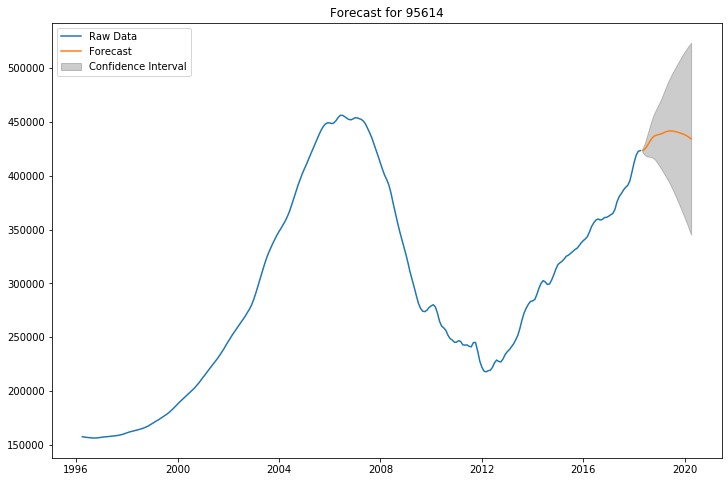

In [299]:
arima_forecast(ts, geog_area, city, county, p_values, d_values, q_values, best_cfg, confint=2, run_pdq = False)

### Zip code 95614 (Cool):  Not a great investment opportunity

By the model prediction, I would expect to see a 2.466% change in price by April 1, 2020.
At the lower bound of the confidence interval, I would expect to see a -18.714% change in price by April 1, 2020.
At the upper bound of the confidence interval, I would expect to see a 23.646% change in price by April 1, 2020.


## SacMetro:  95663 (Penryn) -- Excellent investment opportunity

### Set up dataframe

In [300]:
geog_area = '95663'

In [301]:
city = 'Penryn'

In [302]:
county = 'Placer'

In [303]:
ts = df_sac.loc[df_sac['Zip'] == geog_area]

In [304]:
ts.head()

,Metro,MetroState,CountyName,City,Zip,value
time,,,,,,
1996-04-01,Sacramento,Sacramento CA,Placer,Penryn,95663,195400.0
1996-05-01,Sacramento,Sacramento CA,Placer,Penryn,95663,195300.0
1996-06-01,Sacramento,Sacramento CA,Placer,Penryn,95663,195300.0
1996-07-01,Sacramento,Sacramento CA,Placer,Penryn,95663,195300.0
1996-08-01,Sacramento,Sacramento CA,Placer,Penryn,95663,195400.0


In [305]:
ts = ts.resample('MS').asfreq()

In [306]:
ts.head()

,Metro,MetroState,CountyName,City,Zip,value
time,,,,,,
1996-04-01,Sacramento,Sacramento CA,Placer,Penryn,95663,195400.0
1996-05-01,Sacramento,Sacramento CA,Placer,Penryn,95663,195300.0
1996-06-01,Sacramento,Sacramento CA,Placer,Penryn,95663,195300.0
1996-07-01,Sacramento,Sacramento CA,Placer,Penryn,95663,195300.0
1996-08-01,Sacramento,Sacramento CA,Placer,Penryn,95663,195400.0


### Visualizations

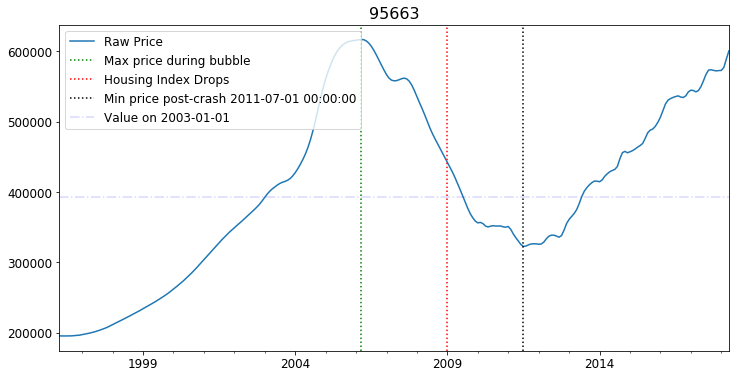

In [307]:
plot_single_geog(df_melt, geog_area, 'value', 'Zip', figsize=(12, 6), fontsize1=12, fontsize2=16)

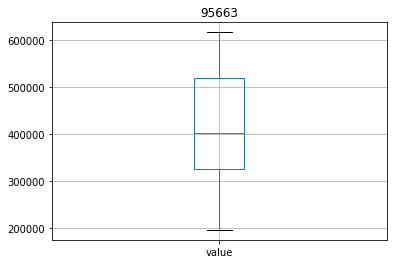

In [308]:
ts.boxplot(column = 'value')
plt.title(geog_area);


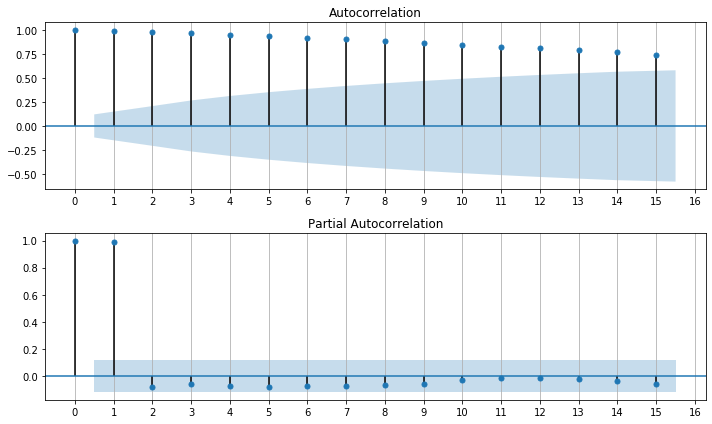

In [309]:
plot_acf_pacf(ts.value)

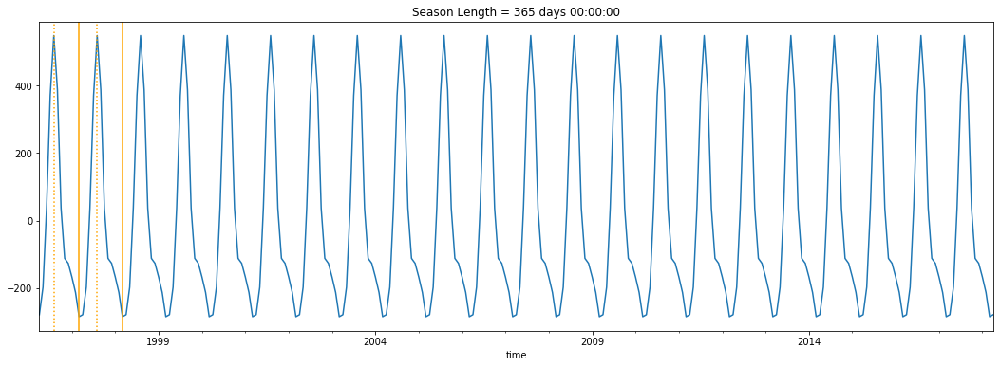

In [310]:
plot_seasonal_decomp(ts.value);

# Note that seasonality isn't much of a factor here; maximum difference of about $700 over the course of a year

### ARIMA parameters tuning

In [ ]:
p_values = [0, 1, 2, 4, 6, 8, 10]
d_values = range(0, 3)
q_values = range(0, 3)


In [ ]:
# order_tuples_95663, mse_results_95663, best_cfg_95663, best_score_95663 = eval_params_and_lists(ts.value, p_values, d_values, q_values)


From previous analyses:  Best ARIMA(6, 1, 1) MSE=4616814.652

In [311]:
best_cfg = (6,1,1)
best_cfg

(6, 1, 1)

In [ ]:
# results_table_95663 = pd.DataFrame({'Order':order_tuples_95663, 'MSEs':mse_results_95663})
# results_table_95663

### ARIMA modeling and forecasting results

In [312]:
print_results_lists()   # make sure that the lists are correct to this point; 
                        # use pop_results_lists() to remove last item

(['95616',
  '95619',
  '95864',
  '95831',
  '95811',
  '95818',
  '95630',
  '96140',
  '95672',
  '95636',
  '95709',
  '95746',
  '95614'],
 ['Davis',
  'Diamond Springs',
  'Arden-Arcade',
  'Sacramento_Pocket',
  'Sacramento_DosRios',
  'Sacramento_LandPark',
  'Folsom',
  'Carnelian Bay',
  'Rescue',
  'Somerset',
  'Camino',
  'Granite Bay',
  'Cool'],
 ['Yolo',
  'El Dorado',
  'Sacramento',
  'Sacramento',
  'Sacramento',
  'Sacramento',
  'Sacramento',
  'Placer',
  'El Dorado',
  'El Dorado',
  'El Dorado',
  'Placer',
  'El Dorado'],
 [(2, 1, 2),
  (2, 1, 2),
  (8, 0, 2),
  (6, 0, 2),
  (10, 1, 0),
  (6, 2, 2),
  (2, 2, 0),
  (4, 2, 1),
  (8, 2, 0),
  (8, 2, 1),
  (8, 0, 2),
  (6, 1, 2),
  (8, 0, 2)],
 [717863.06,
  355774.45,
  449047.92,
  389675.07,
  570598.7,
  558380.08,
  545821.37,
  769785.39,
  766372.9,
  268239.06,
  385671.99,
  840052.01,
  434312.48],
 [619575.34,
  275292.09,
  327568.68,
  302216.31,
  459606.77,
  418566.82,
  427964.65,
  518008.87,
  56

For 95663 (Penryn):
Best ARIMA order = (6, 1, 1)
                             ARIMA Model Results                              
Dep. Variable:                D.value   No. Observations:                  264
Model:                 ARIMA(6, 1, 1)   Log Likelihood               -2259.231
Method:                       css-mle   S.D. of innovations           1250.189
Date:                Tue, 17 Mar 2020   AIC                           4536.461
Time:                        15:28:07   BIC                           4568.645
Sample:                    05-01-1996   HQIC                          4549.393
                         - 04-01-2018                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
const          1535.2274   1631.031      0.941      0.347   -1661.535    4731.990
ar.L1.D.value     1.0556      0.095     11.060      0.000       0.869    

(['95616',
  '95619',
  '95864',
  '95831',
  '95811',
  '95818',
  '95630',
  '96140',
  '95672',
  '95636',
  '95709',
  '95746',
  '95614',
  '95663'],
 ['Davis',
  'Diamond Springs',
  'Arden-Arcade',
  'Sacramento_Pocket',
  'Sacramento_DosRios',
  'Sacramento_LandPark',
  'Folsom',
  'Carnelian Bay',
  'Rescue',
  'Somerset',
  'Camino',
  'Granite Bay',
  'Cool',
  'Penryn'],
 ['Yolo',
  'El Dorado',
  'Sacramento',
  'Sacramento',
  'Sacramento',
  'Sacramento',
  'Sacramento',
  'Placer',
  'El Dorado',
  'El Dorado',
  'El Dorado',
  'Placer',
  'El Dorado',
  'Placer'],
 [(2, 1, 2),
  (2, 1, 2),
  (8, 0, 2),
  (6, 0, 2),
  (10, 1, 0),
  (6, 2, 2),
  (2, 2, 0),
  (4, 2, 1),
  (8, 2, 0),
  (8, 2, 1),
  (8, 0, 2),
  (6, 1, 2),
  (8, 0, 2),
  (6, 1, 1)],
 [717863.06,
  355774.45,
  449047.92,
  389675.07,
  570598.7,
  558380.08,
  545821.37,
  769785.39,
  766372.9,
  268239.06,
  385671.99,
  840052.01,
  434312.48,
  682869.53],
 [619575.34,
  275292.09,
  327568.68,
  302216

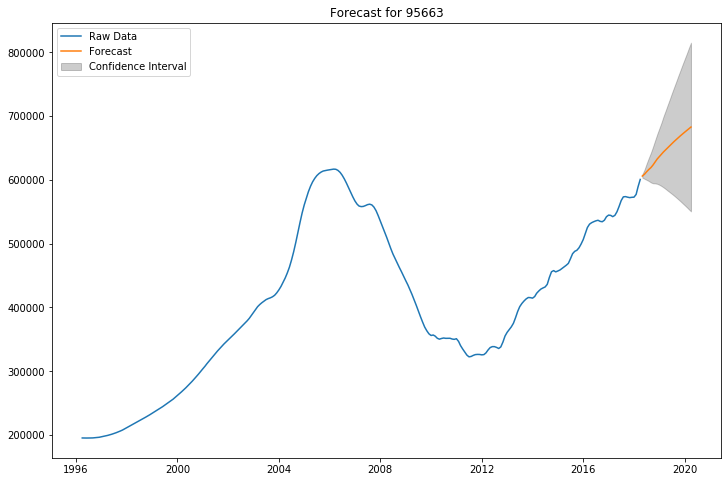

In [313]:
arima_forecast(ts, geog_area, city, county, p_values, d_values, q_values, best_cfg, confint=2, run_pdq = False)

### Zip code 95663 (Penryn):  Excellent investment opportunity

By the model prediction, I would expect to see a 13.679% change in price by April 1, 2020.
At the lower bound of the confidence interval, I would expect to see a -8.334% change in price by April 1, 2020.
At the upper bound of the confidence interval, I would expect to see a 35.692% change in price by April 1, 2020.

## SacMetro:  95623 (El Dorado) -- Good investment opportunity

### Set up dataframe

In [314]:
geog_area = '95623'

In [315]:
city = 'El Dorado'

In [316]:
county = 'El Dorado'

In [317]:
ts = df_sac.loc[df_sac['Zip'] == geog_area]

In [318]:
ts.head()

,Metro,MetroState,CountyName,City,Zip,value
time,,,,,,
1996-04-01,Sacramento,Sacramento CA,El Dorado,El Dorado,95623,165300.0
1996-05-01,Sacramento,Sacramento CA,El Dorado,El Dorado,95623,164900.0
1996-06-01,Sacramento,Sacramento CA,El Dorado,El Dorado,95623,164400.0
1996-07-01,Sacramento,Sacramento CA,El Dorado,El Dorado,95623,164000.0
1996-08-01,Sacramento,Sacramento CA,El Dorado,El Dorado,95623,163700.0


In [319]:
ts = ts.resample('MS').asfreq()

In [320]:
ts.head()

,Metro,MetroState,CountyName,City,Zip,value
time,,,,,,
1996-04-01,Sacramento,Sacramento CA,El Dorado,El Dorado,95623,165300.0
1996-05-01,Sacramento,Sacramento CA,El Dorado,El Dorado,95623,164900.0
1996-06-01,Sacramento,Sacramento CA,El Dorado,El Dorado,95623,164400.0
1996-07-01,Sacramento,Sacramento CA,El Dorado,El Dorado,95623,164000.0
1996-08-01,Sacramento,Sacramento CA,El Dorado,El Dorado,95623,163700.0


### Visualizations

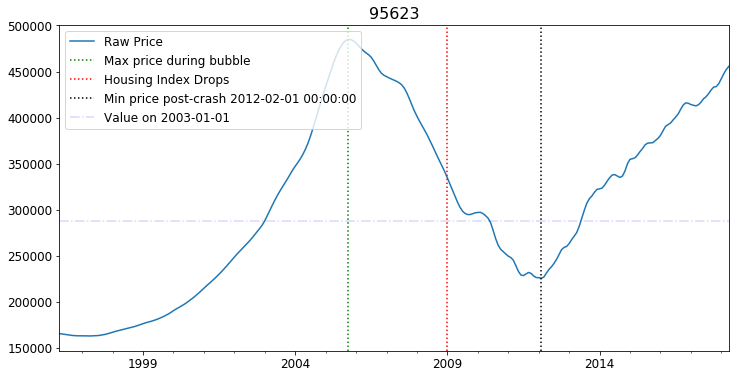

In [321]:
plot_single_geog(df_melt, geog_area, 'value', 'Zip', figsize=(12, 6), fontsize1=12, fontsize2=16)

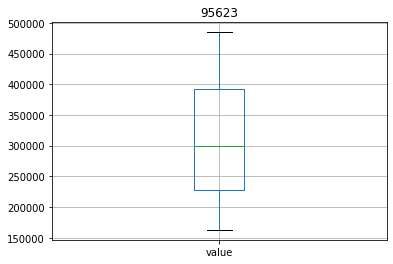

In [322]:
ts.boxplot(column = 'value')
plt.title(geog_area);


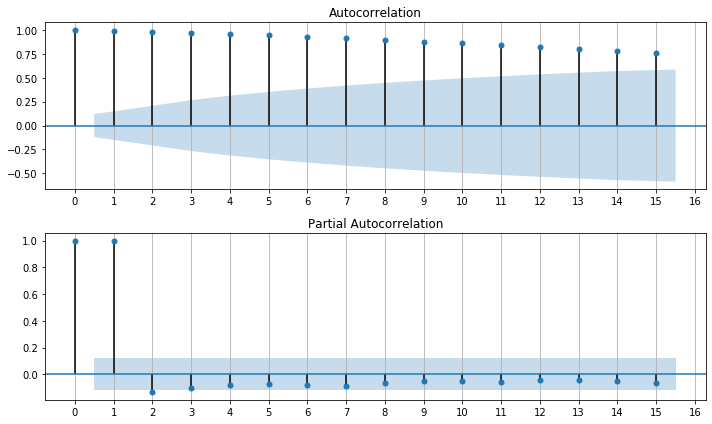

In [323]:
plot_acf_pacf(ts.value)

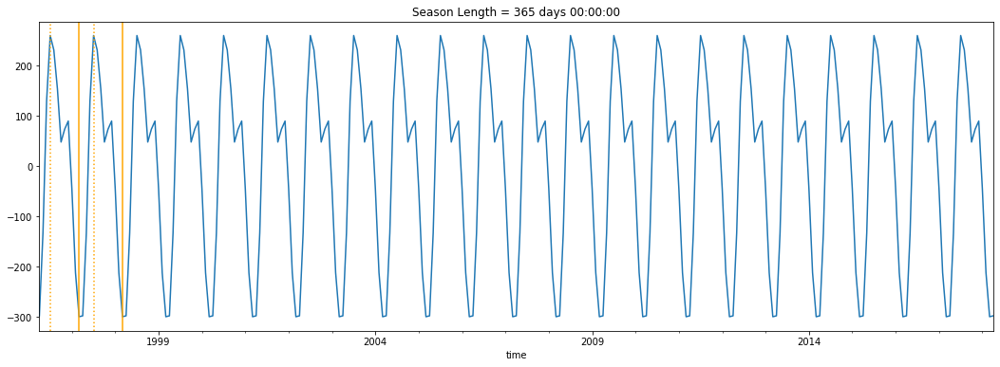

In [324]:
plot_seasonal_decomp(ts.value);

# Note that seasonality isn't much of a factor here; maximum difference of about $700 over the course of a year

### ARIMA parameters tuning

In [ ]:
p_values = [0, 1, 2, 4, 6, 8, 10]
d_values = range(0, 3)
q_values = range(0, 3)


In [ ]:
# order_tuples_95623, mse_results_95623, best_cfg_95623, best_score_95623 = eval_params_and_lists(ts.value, p_values, d_values, q_values)


From previous analyses:  # Best ARIMA(6, 1, 2) MSE=2032900.464

In [325]:
# best_cfg = best_cfg_95623
best_cfg = (6,1,2)
best_cfg

(6, 1, 2)

In [ ]:
# results_table_95623 = pd.DataFrame({'Order':order_tuples_95623, 'MSEs':mse_results_95623})
# results_table_95623

### ARIMA modeling and forecasting results

In [326]:
print_results_lists()   # make sure that the lists are correct to this point; 
                        # use pop_results_lists() to remove last item

(['95616',
  '95619',
  '95864',
  '95831',
  '95811',
  '95818',
  '95630',
  '96140',
  '95672',
  '95636',
  '95709',
  '95746',
  '95614',
  '95663'],
 ['Davis',
  'Diamond Springs',
  'Arden-Arcade',
  'Sacramento_Pocket',
  'Sacramento_DosRios',
  'Sacramento_LandPark',
  'Folsom',
  'Carnelian Bay',
  'Rescue',
  'Somerset',
  'Camino',
  'Granite Bay',
  'Cool',
  'Penryn'],
 ['Yolo',
  'El Dorado',
  'Sacramento',
  'Sacramento',
  'Sacramento',
  'Sacramento',
  'Sacramento',
  'Placer',
  'El Dorado',
  'El Dorado',
  'El Dorado',
  'Placer',
  'El Dorado',
  'Placer'],
 [(2, 1, 2),
  (2, 1, 2),
  (8, 0, 2),
  (6, 0, 2),
  (10, 1, 0),
  (6, 2, 2),
  (2, 2, 0),
  (4, 2, 1),
  (8, 2, 0),
  (8, 2, 1),
  (8, 0, 2),
  (6, 1, 2),
  (8, 0, 2),
  (6, 1, 1)],
 [717863.06,
  355774.45,
  449047.92,
  389675.07,
  570598.7,
  558380.08,
  545821.37,
  769785.39,
  766372.9,
  268239.06,
  385671.99,
  840052.01,
  434312.48,
  682869.53],
 [619575.34,
  275292.09,
  327568.68,
  302216

For 95623 (El Dorado):
Best ARIMA order = (6, 1, 2)
                             ARIMA Model Results                              
Dep. Variable:                D.value   No. Observations:                  264
Model:                 ARIMA(6, 1, 2)   Log Likelihood               -2137.809
Method:                       css-mle   S.D. of innovations            785.964
Date:                Tue, 17 Mar 2020   AIC                           4295.619
Time:                        15:28:53   BIC                           4331.378
Sample:                    05-01-1996   HQIC                          4309.988
                         - 04-01-2018                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
const          1100.0000   1234.745      0.891      0.374   -1320.056    3520.056
ar.L1.D.value     0.3530      0.073      4.804      0.000       0.209 

(['95616',
  '95619',
  '95864',
  '95831',
  '95811',
  '95818',
  '95630',
  '96140',
  '95672',
  '95636',
  '95709',
  '95746',
  '95614',
  '95663',
  '95623'],
 ['Davis',
  'Diamond Springs',
  'Arden-Arcade',
  'Sacramento_Pocket',
  'Sacramento_DosRios',
  'Sacramento_LandPark',
  'Folsom',
  'Carnelian Bay',
  'Rescue',
  'Somerset',
  'Camino',
  'Granite Bay',
  'Cool',
  'Penryn',
  'El Dorado'],
 ['Yolo',
  'El Dorado',
  'Sacramento',
  'Sacramento',
  'Sacramento',
  'Sacramento',
  'Sacramento',
  'Placer',
  'El Dorado',
  'El Dorado',
  'El Dorado',
  'Placer',
  'El Dorado',
  'Placer',
  'El Dorado'],
 [(2, 1, 2),
  (2, 1, 2),
  (8, 0, 2),
  (6, 0, 2),
  (10, 1, 0),
  (6, 2, 2),
  (2, 2, 0),
  (4, 2, 1),
  (8, 2, 0),
  (8, 2, 1),
  (8, 0, 2),
  (6, 1, 2),
  (8, 0, 2),
  (6, 1, 1),
  (6, 1, 2)],
 [717863.06,
  355774.45,
  449047.92,
  389675.07,
  570598.7,
  558380.08,
  545821.37,
  769785.39,
  766372.9,
  268239.06,
  385671.99,
  840052.01,
  434312.48,
  68286

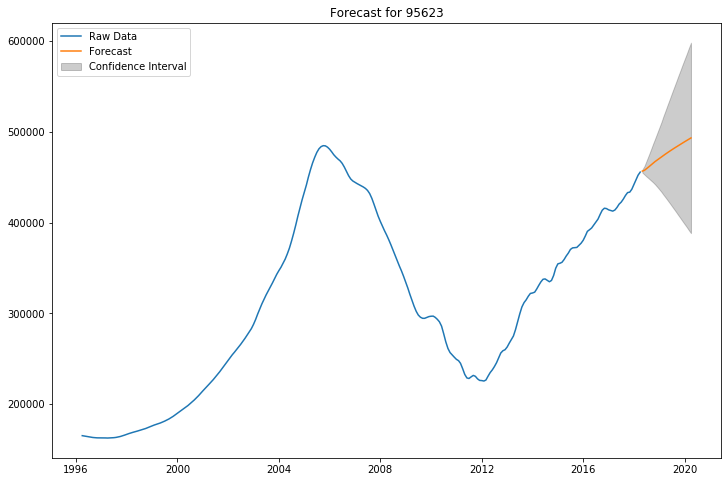

In [327]:
arima_forecast(ts, geog_area, city, county, p_values, d_values, q_values, best_cfg, confint=2, run_pdq = False)

### Zip code 95623 (El Dorado):   Good investment opportunity

By the model prediction, I would expect to see a 8.258% change in price by April 1, 2020.
At the lower bound of the confidence interval, I would expect to see a -14.768% change in price by April 1, 2020.
At the upper bound of the confidence interval, I would expect to see a 31.285% change in price by April 1, 2020.

## SacMetro:  95747 (Roseville) -- Potential investment opportunity with more upside than downside potential

### Set up dataframe

In [328]:
geog_area = '95747'

In [329]:
city = 'Roseville'

In [330]:
county = 'Placer'

In [331]:
ts = df_sac.loc[df_sac['Zip'] == geog_area]

In [332]:
ts.head()

,Metro,MetroState,CountyName,City,Zip,value
time,,,,,,
1996-04-01,Sacramento,Sacramento CA,Placer,Roseville,95747,192700.0
1996-05-01,Sacramento,Sacramento CA,Placer,Roseville,95747,193700.0
1996-06-01,Sacramento,Sacramento CA,Placer,Roseville,95747,195000.0
1996-07-01,Sacramento,Sacramento CA,Placer,Roseville,95747,196500.0
1996-08-01,Sacramento,Sacramento CA,Placer,Roseville,95747,198100.0


In [333]:
ts = ts.resample('MS').asfreq()

In [334]:
ts.head()

,Metro,MetroState,CountyName,City,Zip,value
time,,,,,,
1996-04-01,Sacramento,Sacramento CA,Placer,Roseville,95747,192700.0
1996-05-01,Sacramento,Sacramento CA,Placer,Roseville,95747,193700.0
1996-06-01,Sacramento,Sacramento CA,Placer,Roseville,95747,195000.0
1996-07-01,Sacramento,Sacramento CA,Placer,Roseville,95747,196500.0
1996-08-01,Sacramento,Sacramento CA,Placer,Roseville,95747,198100.0


### Visualizations

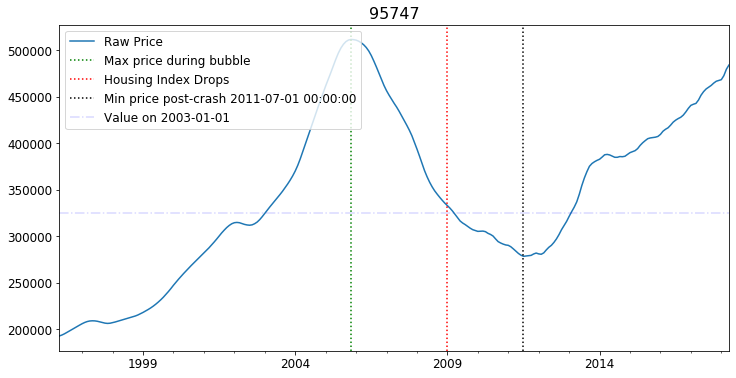

In [335]:
plot_single_geog(df_melt, geog_area, 'value', 'Zip', figsize=(12, 6), fontsize1=12, fontsize2=16)

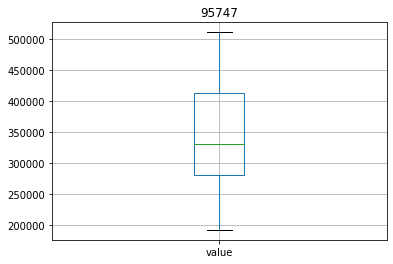

In [336]:
ts.boxplot(column = 'value')
plt.title(geog_area);


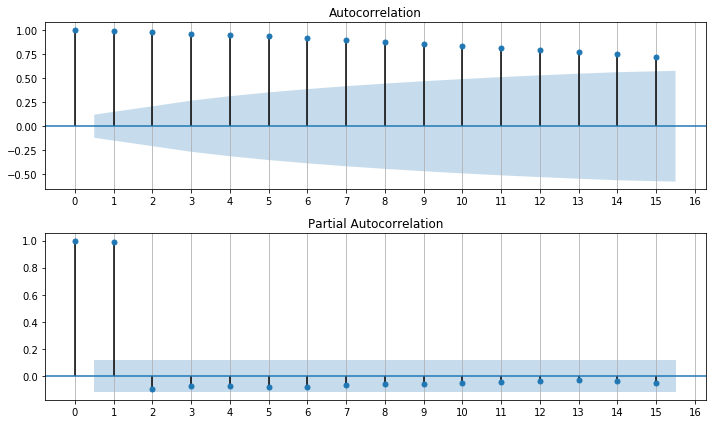

In [337]:
plot_acf_pacf(ts.value)

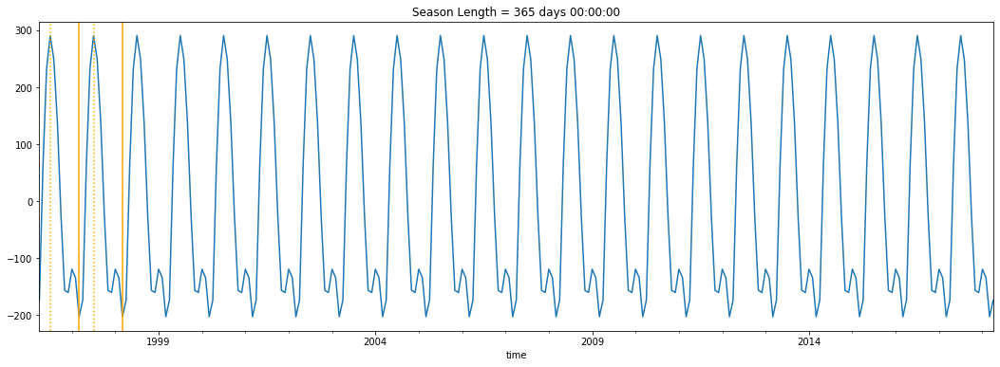

In [338]:
plot_seasonal_decomp(ts.value);

# Note that seasonality isn't much of a factor here; maximum difference of about $700 over the course of a year

### ARIMA parameters tuning

In [ ]:
p_values = [0, 1, 2, 4, 6, 8, 10]
d_values = range(0, 3)
q_values = range(0, 3)


In [ ]:
# order_tuples_95747, mse_results_95747, best_cfg_95747, best_score_95747 = eval_params_and_lists(ts.value, p_values, d_values, q_values)


From previous analyses:  Need to validate--Best ARIMA(4, 1, 2) MSE=956941.458

In [339]:
best_cfg = (4, 1, 2)
best_cfg

(4, 1, 2)

In [ ]:
# results_table_95747 = pd.DataFrame({'Order':order_tuples_95747, 'MSEs':mse_results_95747})
# results_table_95747

### ARIMA modeling and forecasting results

In [ ]:
print_results_lists()   # make sure that the lists are correct to this point; 
                        # use pop_results_lists() to remove last item

For 95747 (Roseville):
Best ARIMA order = (4, 1, 2)
                             ARIMA Model Results                              
Dep. Variable:                D.value   No. Observations:                  264
Model:                 ARIMA(4, 1, 2)   Log Likelihood               -2072.555
Method:                       css-mle   S.D. of innovations            613.651
Date:                Tue, 17 Mar 2020   AIC                           4161.111
Time:                        15:29:20   BIC                           4189.718
Sample:                    05-01-1996   HQIC                          4172.606
                         - 04-01-2018                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
const           694.2087    282.373      2.458      0.015     140.768    1247.649
ar.L1.D.value     2.1793      0.097     22.411      0.000       1.989 

(['95616',
  '95619',
  '95864',
  '95831',
  '95811',
  '95818',
  '95630',
  '96140',
  '95672',
  '95636',
  '95709',
  '95746',
  '95614',
  '95663',
  '95623',
  '95747'],
 ['Davis',
  'Diamond Springs',
  'Arden-Arcade',
  'Sacramento_Pocket',
  'Sacramento_DosRios',
  'Sacramento_LandPark',
  'Folsom',
  'Carnelian Bay',
  'Rescue',
  'Somerset',
  'Camino',
  'Granite Bay',
  'Cool',
  'Penryn',
  'El Dorado',
  'Roseville'],
 ['Yolo',
  'El Dorado',
  'Sacramento',
  'Sacramento',
  'Sacramento',
  'Sacramento',
  'Sacramento',
  'Placer',
  'El Dorado',
  'El Dorado',
  'El Dorado',
  'Placer',
  'El Dorado',
  'Placer',
  'El Dorado',
  'Placer'],
 [(2, 1, 2),
  (2, 1, 2),
  (8, 0, 2),
  (6, 0, 2),
  (10, 1, 0),
  (6, 2, 2),
  (2, 2, 0),
  (4, 2, 1),
  (8, 2, 0),
  (8, 2, 1),
  (8, 0, 2),
  (6, 1, 2),
  (8, 0, 2),
  (6, 1, 1),
  (6, 1, 2),
  (4, 1, 2)],
 [717863.06,
  355774.45,
  449047.92,
  389675.07,
  570598.7,
  558380.08,
  545821.37,
  769785.39,
  766372.9,
  268239

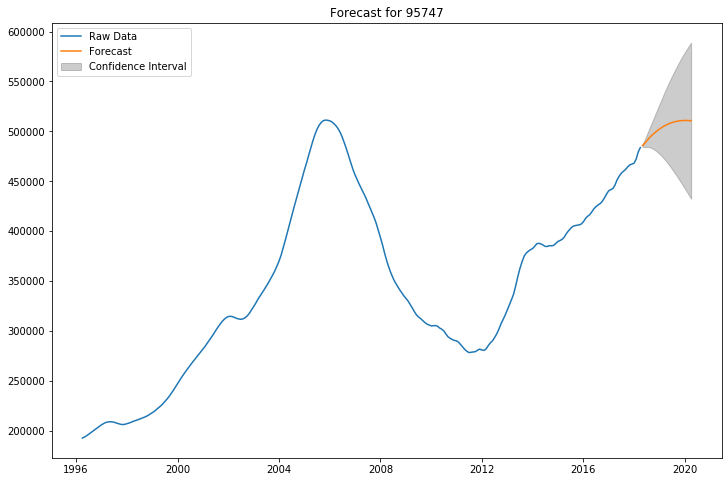

In [340]:
arima_forecast(ts, geog_area, city, county, p_values, d_values, q_values, best_cfg, confint=2, run_pdq = False)

### Zip code 95747 (Roseville):  Potential opportunity, with mediocre predicted returns but more upside than downside

By the model prediction, I would expect to see a 5.556% change in price by April 1, 2020.
At the lower bound of the confidence interval, I would expect to see a -10.609% change in price by April 1, 2020.
At the upper bound of the confidence interval, I would expect to see a 21.722% change in price by April 1, 2020.

## SacMetro:  95765 (Rocklin) -- Solid investment opportunity with minimal downside risk

### Set up dataframe

In [341]:
geog_area = '95765'

In [342]:
city = 'Rocklin'

In [343]:
county = 'Placer'

In [344]:
ts = df_sac.loc[df_sac['Zip'] == geog_area]

In [345]:
ts.head()

,Metro,MetroState,CountyName,City,Zip,value
time,,,,,,
1996-04-01,Sacramento,Sacramento CA,Placer,Rocklin,95765,192600.0
1996-05-01,Sacramento,Sacramento CA,Placer,Rocklin,95765,192300.0
1996-06-01,Sacramento,Sacramento CA,Placer,Rocklin,95765,191900.0
1996-07-01,Sacramento,Sacramento CA,Placer,Rocklin,95765,191400.0
1996-08-01,Sacramento,Sacramento CA,Placer,Rocklin,95765,190900.0


In [346]:
ts = ts.resample('MS').asfreq()

In [347]:
ts.head()

,Metro,MetroState,CountyName,City,Zip,value
time,,,,,,
1996-04-01,Sacramento,Sacramento CA,Placer,Rocklin,95765,192600.0
1996-05-01,Sacramento,Sacramento CA,Placer,Rocklin,95765,192300.0
1996-06-01,Sacramento,Sacramento CA,Placer,Rocklin,95765,191900.0
1996-07-01,Sacramento,Sacramento CA,Placer,Rocklin,95765,191400.0
1996-08-01,Sacramento,Sacramento CA,Placer,Rocklin,95765,190900.0


### Visualizations

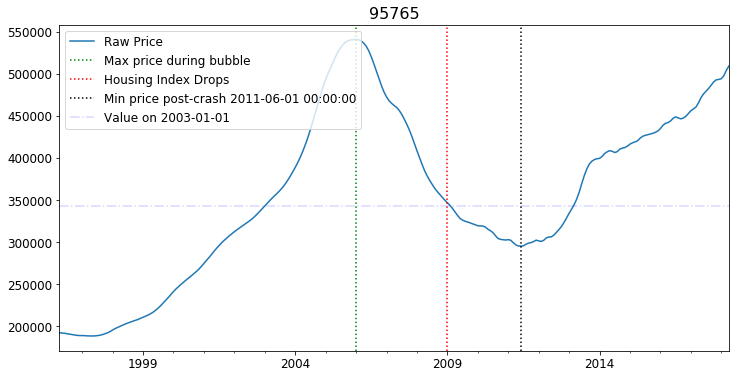

In [348]:
plot_single_geog(df_melt, geog_area, 'value', 'Zip', figsize=(12, 6), fontsize1=12, fontsize2=16)

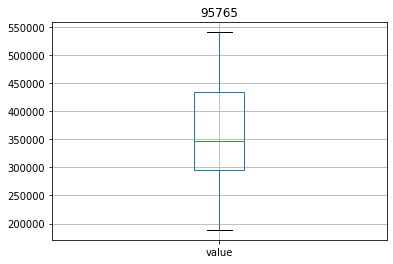

In [349]:
ts.boxplot(column = 'value')
plt.title(geog_area);


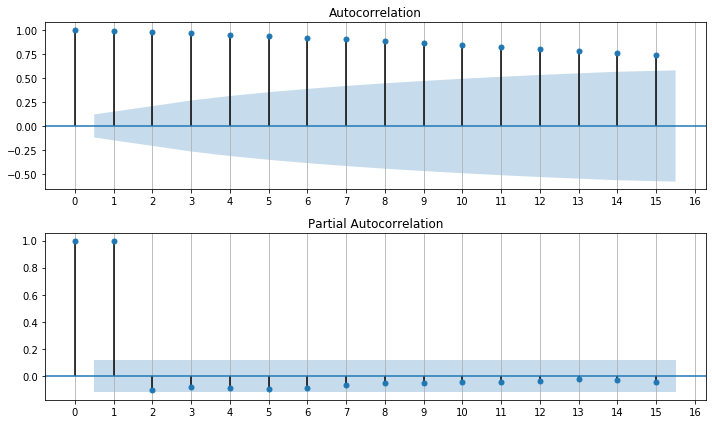

In [350]:
plot_acf_pacf(ts.value)

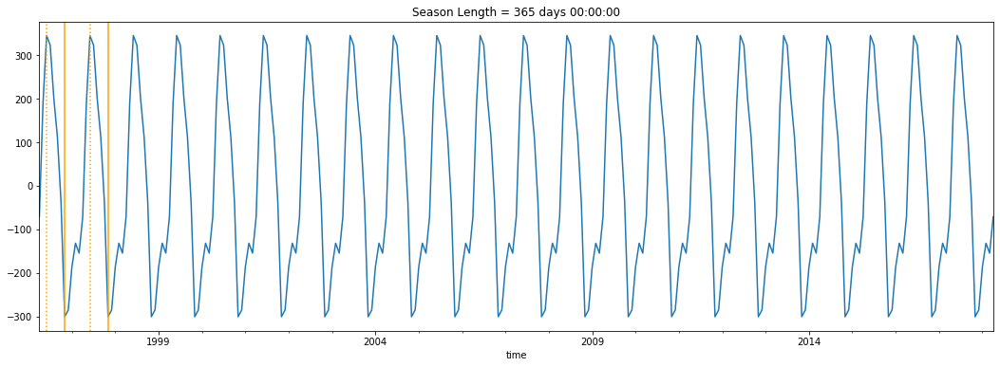

In [351]:
plot_seasonal_decomp(ts.value);

# Note that seasonality isn't much of a factor here; maximum difference of about $700 over the course of a year

### ARIMA parameters tuning

In [ ]:
p_values = [0, 1, 2, 4, 6, 8, 10]
d_values = range(0, 3)
q_values = range(0, 3)


In [ ]:
# order_tuples_95765, mse_results_95765, best_cfg_95765, best_score_95765 = eval_params_and_lists(ts.value, p_values, d_values, q_values)


From previous analyses: Need to validate--Best ARIMA(4, 1, 2) MSE=958549.703 (same as Roseville, so one of them is wrong)

In [352]:
best_cfg = (4,1,2)
best_cfg

(4, 1, 2)

In [ ]:
# results_table_95765 = pd.DataFrame({'Order':order_tuples_95765, 'MSEs':mse_results_95765})
# results_table_95765

### ARIMA modeling and forecasting results

In [353]:
print_results_lists()   # make sure that the lists are correct to this point; 
                        # use pop_results_lists() to remove last item

(['95616',
  '95619',
  '95864',
  '95831',
  '95811',
  '95818',
  '95630',
  '96140',
  '95672',
  '95636',
  '95709',
  '95746',
  '95614',
  '95663',
  '95623',
  '95747'],
 ['Davis',
  'Diamond Springs',
  'Arden-Arcade',
  'Sacramento_Pocket',
  'Sacramento_DosRios',
  'Sacramento_LandPark',
  'Folsom',
  'Carnelian Bay',
  'Rescue',
  'Somerset',
  'Camino',
  'Granite Bay',
  'Cool',
  'Penryn',
  'El Dorado',
  'Roseville'],
 ['Yolo',
  'El Dorado',
  'Sacramento',
  'Sacramento',
  'Sacramento',
  'Sacramento',
  'Sacramento',
  'Placer',
  'El Dorado',
  'El Dorado',
  'El Dorado',
  'Placer',
  'El Dorado',
  'Placer',
  'El Dorado',
  'Placer'],
 [(2, 1, 2),
  (2, 1, 2),
  (8, 0, 2),
  (6, 0, 2),
  (10, 1, 0),
  (6, 2, 2),
  (2, 2, 0),
  (4, 2, 1),
  (8, 2, 0),
  (8, 2, 1),
  (8, 0, 2),
  (6, 1, 2),
  (8, 0, 2),
  (6, 1, 1),
  (6, 1, 2),
  (4, 1, 2)],
 [717863.06,
  355774.45,
  449047.92,
  389675.07,
  570598.7,
  558380.08,
  545821.37,
  769785.39,
  766372.9,
  268239

For 95765 (Rocklin):
Best ARIMA order = (4, 1, 2)
                             ARIMA Model Results                              
Dep. Variable:                D.value   No. Observations:                  264
Model:                 ARIMA(4, 1, 2)   Log Likelihood               -2097.489
Method:                       css-mle   S.D. of innovations            676.112
Date:                Tue, 17 Mar 2020   AIC                           4210.978
Time:                        15:30:09   BIC                           4239.586
Sample:                    05-01-1996   HQIC                          4222.474
                         - 04-01-2018                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
const          1199.2430   1403.669      0.854      0.394   -1551.898    3950.384
ar.L1.D.value     0.3081      0.082      3.752      0.000       0.147   

(['95616',
  '95619',
  '95864',
  '95831',
  '95811',
  '95818',
  '95630',
  '96140',
  '95672',
  '95636',
  '95709',
  '95746',
  '95614',
  '95663',
  '95623',
  '95747',
  '95765'],
 ['Davis',
  'Diamond Springs',
  'Arden-Arcade',
  'Sacramento_Pocket',
  'Sacramento_DosRios',
  'Sacramento_LandPark',
  'Folsom',
  'Carnelian Bay',
  'Rescue',
  'Somerset',
  'Camino',
  'Granite Bay',
  'Cool',
  'Penryn',
  'El Dorado',
  'Roseville',
  'Rocklin'],
 ['Yolo',
  'El Dorado',
  'Sacramento',
  'Sacramento',
  'Sacramento',
  'Sacramento',
  'Sacramento',
  'Placer',
  'El Dorado',
  'El Dorado',
  'El Dorado',
  'Placer',
  'El Dorado',
  'Placer',
  'El Dorado',
  'Placer',
  'Placer'],
 [(2, 1, 2),
  (2, 1, 2),
  (8, 0, 2),
  (6, 0, 2),
  (10, 1, 0),
  (6, 2, 2),
  (2, 2, 0),
  (4, 2, 1),
  (8, 2, 0),
  (8, 2, 1),
  (8, 0, 2),
  (6, 1, 2),
  (8, 0, 2),
  (6, 1, 1),
  (6, 1, 2),
  (4, 1, 2),
  (4, 1, 2)],
 [717863.06,
  355774.45,
  449047.92,
  389675.07,
  570598.7,
  558380.0

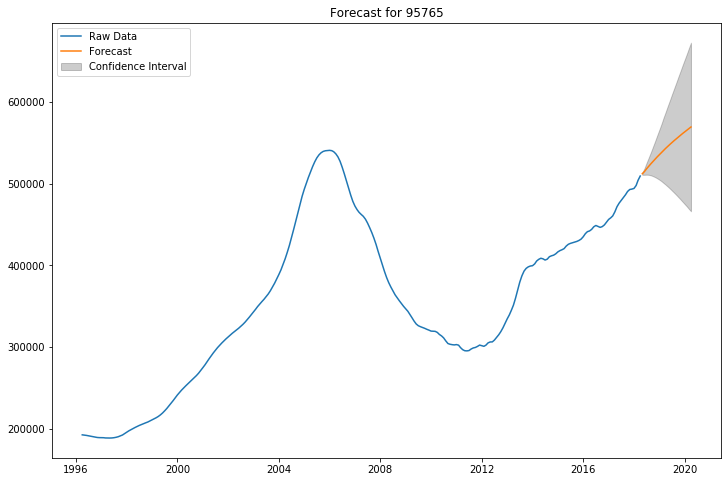

In [354]:
arima_forecast(ts, geog_area, city, county, p_values, d_values, q_values, best_cfg, confint=2, run_pdq = False)

### Zip code 95765 (Rocklin):  Solid investment opportunity with minimal downside

By the model prediction, I would expect to see a 11.779% change in price by April 1, 2020.
At the lower bound of the confidence interval, I would expect to see a -8.471% change in price by April 1, 2020.
At the upper bound of the confidence interval, I would expect to see a 32.029% change in price by April 1, 2020.


## SacMetro:  95602 (Auburn) -- Strong investment opportunity with minimal downside

### Set up dataframe

In [369]:
geog_area = '95602'

In [370]:
city = 'Auburn'

In [371]:
county = 'Placer'

In [372]:
ts = df_sac.loc[df_sac['Zip'] == geog_area]

In [373]:
ts.head()

,Metro,MetroState,CountyName,City,Zip,value
time,,,,,,
1996-04-01,Sacramento,Sacramento CA,Placer,Auburn,95602,184300.0
1996-05-01,Sacramento,Sacramento CA,Placer,Auburn,95602,184000.0
1996-06-01,Sacramento,Sacramento CA,Placer,Auburn,95602,183700.0
1996-07-01,Sacramento,Sacramento CA,Placer,Auburn,95602,183500.0
1996-08-01,Sacramento,Sacramento CA,Placer,Auburn,95602,183300.0


In [374]:
ts = ts.resample('MS').asfreq()

In [375]:
ts.head()

,Metro,MetroState,CountyName,City,Zip,value
time,,,,,,
1996-04-01,Sacramento,Sacramento CA,Placer,Auburn,95602,184300.0
1996-05-01,Sacramento,Sacramento CA,Placer,Auburn,95602,184000.0
1996-06-01,Sacramento,Sacramento CA,Placer,Auburn,95602,183700.0
1996-07-01,Sacramento,Sacramento CA,Placer,Auburn,95602,183500.0
1996-08-01,Sacramento,Sacramento CA,Placer,Auburn,95602,183300.0


### Visualizations

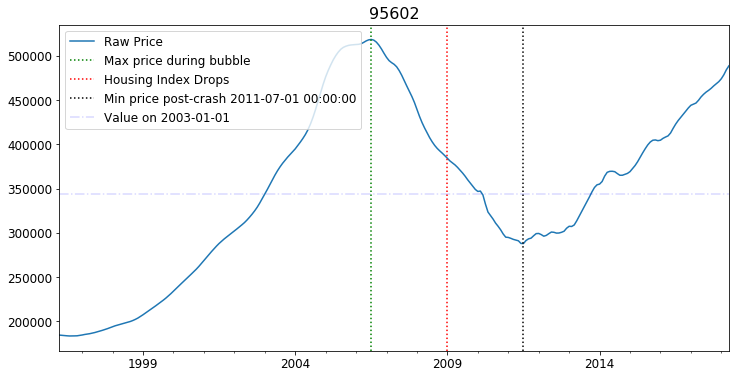

In [376]:
plot_single_geog(df_melt, geog_area, 'value', 'Zip', figsize=(12, 6), fontsize1=12, fontsize2=16)

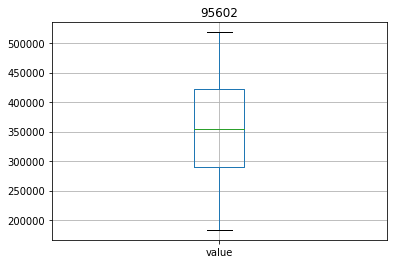

In [363]:
ts.boxplot(column = 'value')
plt.title(geog_area);


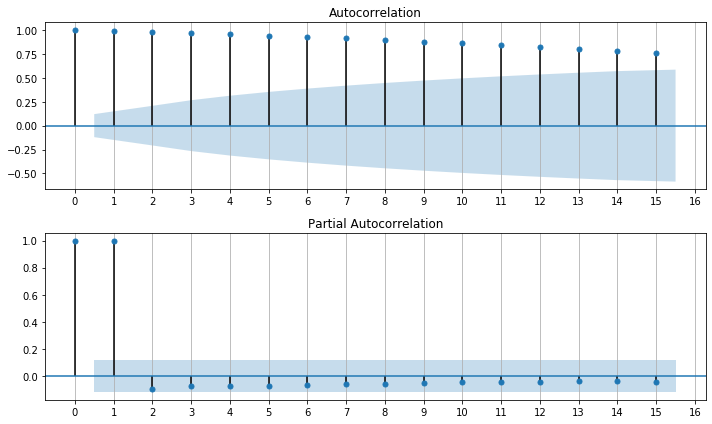

In [364]:
plot_acf_pacf(ts.value)

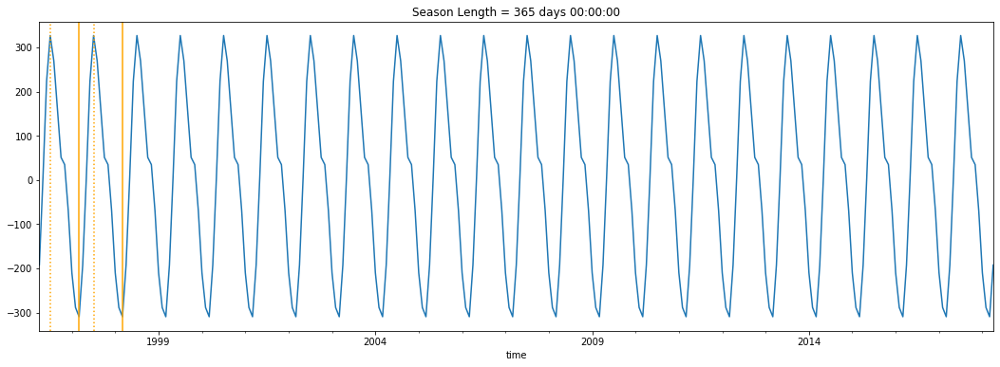

In [365]:
plot_seasonal_decomp(ts.value);

# Note that seasonality isn't much of a factor here; maximum difference of about $700 over the course of a year

### ARIMA parameters tuning

In [377]:
p_values = [0, 1, 2, 4, 6, 8, 10]
d_values = range(0, 3)
q_values = range(0, 3)


In [378]:
# order_tuples_95602, mse_results_95602, best_cfg_95602, best_score_95602 = eval_params_and_lists(ts.value, p_values, d_values, q_values)


From previous analyses:  Best ARIMA(4, 0, 2) MSE=584168.034

In [379]:
# best_cfg = best_cfg_95602
best_cfg = (4,0,2)
best_cfg

(4, 0, 2)

In [ ]:
# results_table_95602 = pd.DataFrame({'Order':order_tuples_95602, 'MSEs':mse_results_95602})
# results_table_95602

### ARIMA modeling and forecasting results

In [367]:
print_results_lists()   # make sure that the lists are correct to this point; 
                        # use pop_results_lists() to remove last item

(['95616',
  '95619',
  '95864',
  '95831',
  '95811',
  '95818',
  '95630',
  '96140',
  '95672',
  '95636',
  '95709',
  '95746',
  '95614',
  '95663',
  '95623',
  '95747',
  '95765'],
 ['Davis',
  'Diamond Springs',
  'Arden-Arcade',
  'Sacramento_Pocket',
  'Sacramento_DosRios',
  'Sacramento_LandPark',
  'Folsom',
  'Carnelian Bay',
  'Rescue',
  'Somerset',
  'Camino',
  'Granite Bay',
  'Cool',
  'Penryn',
  'El Dorado',
  'Roseville',
  'Rocklin'],
 ['Yolo',
  'El Dorado',
  'Sacramento',
  'Sacramento',
  'Sacramento',
  'Sacramento',
  'Sacramento',
  'Placer',
  'El Dorado',
  'El Dorado',
  'El Dorado',
  'Placer',
  'El Dorado',
  'Placer',
  'El Dorado',
  'Placer',
  'Placer'],
 [(2, 1, 2),
  (2, 1, 2),
  (8, 0, 2),
  (6, 0, 2),
  (10, 1, 0),
  (6, 2, 2),
  (2, 2, 0),
  (4, 2, 1),
  (8, 2, 0),
  (8, 2, 1),
  (8, 0, 2),
  (6, 1, 2),
  (8, 0, 2),
  (6, 1, 1),
  (6, 1, 2),
  (4, 1, 2),
  (4, 1, 2)],
 [717863.06,
  355774.45,
  449047.92,
  389675.07,
  570598.7,
  558380.0

For 95602 (Auburn):
Best ARIMA order = (4, 0, 2)
                              ARMA Model Results                              
Dep. Variable:                  value   No. Observations:                  265
Model:                     ARMA(4, 2)   Log Likelihood               -2158.915
Method:                       css-mle   S.D. of innovations            811.624
Date:                Tue, 17 Mar 2020   AIC                           4333.830
Time:                        15:31:44   BIC                           4362.468
Sample:                    04-01-1996   HQIC                          4345.337
                         - 04-01-2018                                         
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
const        3.484e+05   7.93e+04      4.393      0.000    1.93e+05    5.04e+05
ar.L1.value     1.2032        nan        nan        nan         nan         nan

(['95616',
  '95619',
  '95864',
  '95831',
  '95811',
  '95818',
  '95630',
  '96140',
  '95672',
  '95636',
  '95709',
  '95746',
  '95614',
  '95663',
  '95623',
  '95747',
  '95765',
  '95602',
  '95602'],
 ['Davis',
  'Diamond Springs',
  'Arden-Arcade',
  'Sacramento_Pocket',
  'Sacramento_DosRios',
  'Sacramento_LandPark',
  'Folsom',
  'Carnelian Bay',
  'Rescue',
  'Somerset',
  'Camino',
  'Granite Bay',
  'Cool',
  'Penryn',
  'El Dorado',
  'Roseville',
  'Rocklin',
  'Auburn',
  'Auburn'],
 ['Yolo',
  'El Dorado',
  'Sacramento',
  'Sacramento',
  'Sacramento',
  'Sacramento',
  'Sacramento',
  'Placer',
  'El Dorado',
  'El Dorado',
  'El Dorado',
  'Placer',
  'El Dorado',
  'Placer',
  'El Dorado',
  'Placer',
  'Placer',
  'Placer',
  'Placer'],
 [(2, 1, 2),
  (2, 1, 2),
  (8, 0, 2),
  (6, 0, 2),
  (10, 1, 0),
  (6, 2, 2),
  (2, 2, 0),
  (4, 2, 1),
  (8, 2, 0),
  (8, 2, 1),
  (8, 0, 2),
  (6, 1, 2),
  (8, 0, 2),
  (6, 1, 1),
  (6, 1, 2),
  (4, 1, 2),
  (4, 1, 2),
  (4,

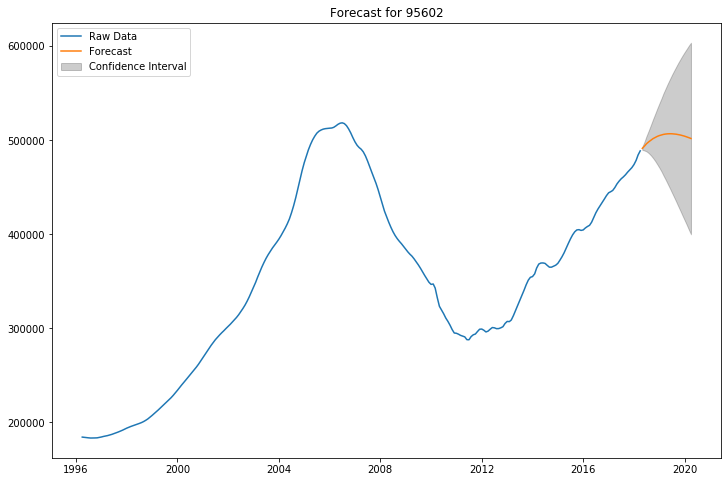

In [380]:
arima_forecast(ts, geog_area, city, county, p_values, d_values, q_values, best_cfg, confint=2, run_pdq = False)

### Zip code 95602 (Auburn):  Strong investment opportunity with minimal downside

By the model prediction, I would expect to see a 11.831% change in price by April 1, 2020.
At the lower bound of the confidence interval, I would expect to see a -7.957% change in price by April 1, 2020.
At the upper bound of the confidence interval, I would expect to see a 31.619% change in price by April 1, 2020.

## SacMetro:  96150 (South Lake Tahoe) -- 

### Set up dataframe

In [381]:
geog_area = '96150'

In [382]:
city = 'South Lake Tahoe'

In [383]:
county = 'El Dorado'

In [384]:
ts = df_sac.loc[df_sac['Zip'] == geog_area]

In [385]:
ts.head()

,Metro,MetroState,CountyName,City,Zip,value
time,,,,,,
1996-04-01,Sacramento,Sacramento CA,El Dorado,South Lake Tahoe,96150,132800.0
1996-05-01,Sacramento,Sacramento CA,El Dorado,South Lake Tahoe,96150,132500.0
1996-06-01,Sacramento,Sacramento CA,El Dorado,South Lake Tahoe,96150,132400.0
1996-07-01,Sacramento,Sacramento CA,El Dorado,South Lake Tahoe,96150,132400.0
1996-08-01,Sacramento,Sacramento CA,El Dorado,South Lake Tahoe,96150,132600.0


In [386]:
ts = ts.resample('MS').asfreq()

In [387]:
ts.head()

,Metro,MetroState,CountyName,City,Zip,value
time,,,,,,
1996-04-01,Sacramento,Sacramento CA,El Dorado,South Lake Tahoe,96150,132800.0
1996-05-01,Sacramento,Sacramento CA,El Dorado,South Lake Tahoe,96150,132500.0
1996-06-01,Sacramento,Sacramento CA,El Dorado,South Lake Tahoe,96150,132400.0
1996-07-01,Sacramento,Sacramento CA,El Dorado,South Lake Tahoe,96150,132400.0
1996-08-01,Sacramento,Sacramento CA,El Dorado,South Lake Tahoe,96150,132600.0


### Visualizations

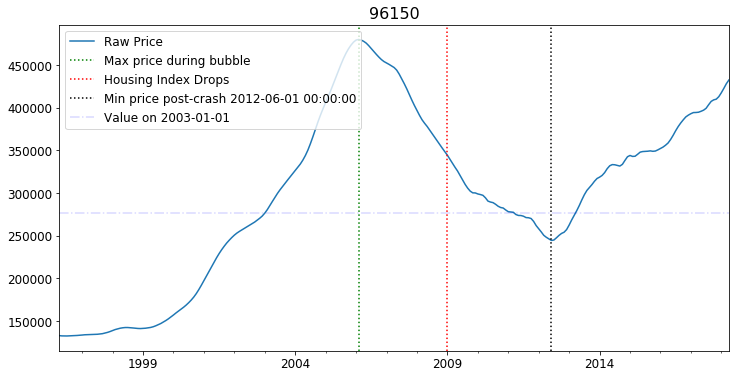

In [388]:
plot_single_geog(df_melt, geog_area, 'value', 'Zip', figsize=(12, 6), fontsize1=12, fontsize2=16)

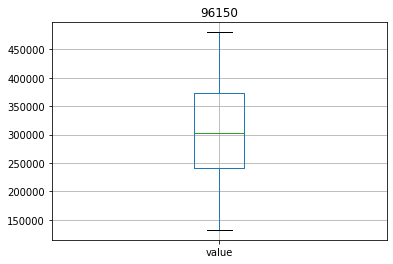

In [389]:
ts.boxplot(column = 'value')
plt.title(geog_area);


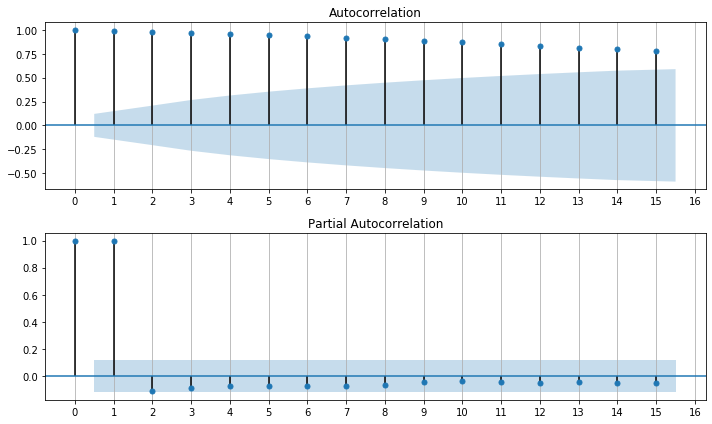

In [390]:
plot_acf_pacf(ts.value)

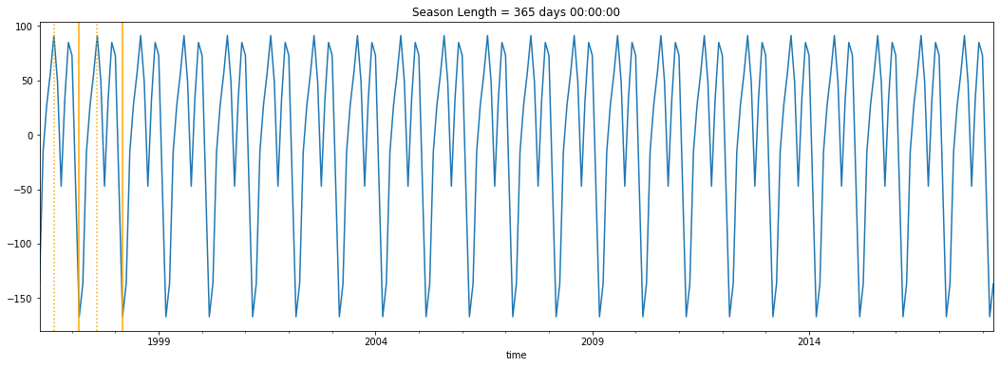

In [391]:
plot_seasonal_decomp(ts.value);

# Note that seasonality isn't much of a factor here; maximum difference of about $700 over the course of a year

### ARIMA parameters tuning

In [ ]:
p_values = [0, 1, 2, 4, 6, 8, 10]
d_values = range(0, 3)
q_values = range(0, 3)


In [ ]:
# order_tuples_96150, mse_results_96150, best_cfg_96150, best_score_96150 = eval_params_and_lists(ts.value, p_values, d_values, q_values)


From previous analyses:  Best ARIMA(2, 1, 2) MSE=700451.029

In [392]:
best_cfg = (2,1,2)
best_cfg

(2, 1, 2)

In [ ]:
# results_table_96150 = pd.DataFrame({'Order':order_tuples_96150, 'MSEs':mse_results_96150})
# results_table_96150

### ARIMA modeling and forecasting results

In [393]:
print_results_lists()   # make sure that the lists are correct to this point; 
                        # use pop_results_lists() to remove last item

(['95616',
  '95619',
  '95864',
  '95831',
  '95811',
  '95818',
  '95630',
  '96140',
  '95672',
  '95636',
  '95709',
  '95746',
  '95614',
  '95663',
  '95623',
  '95747',
  '95765',
  '95602',
  '95602'],
 ['Davis',
  'Diamond Springs',
  'Arden-Arcade',
  'Sacramento_Pocket',
  'Sacramento_DosRios',
  'Sacramento_LandPark',
  'Folsom',
  'Carnelian Bay',
  'Rescue',
  'Somerset',
  'Camino',
  'Granite Bay',
  'Cool',
  'Penryn',
  'El Dorado',
  'Roseville',
  'Rocklin',
  'Auburn',
  'Auburn'],
 ['Yolo',
  'El Dorado',
  'Sacramento',
  'Sacramento',
  'Sacramento',
  'Sacramento',
  'Sacramento',
  'Placer',
  'El Dorado',
  'El Dorado',
  'El Dorado',
  'Placer',
  'El Dorado',
  'Placer',
  'El Dorado',
  'Placer',
  'Placer',
  'Placer',
  'Placer'],
 [(2, 1, 2),
  (2, 1, 2),
  (8, 0, 2),
  (6, 0, 2),
  (10, 1, 0),
  (6, 2, 2),
  (2, 2, 0),
  (4, 2, 1),
  (8, 2, 0),
  (8, 2, 1),
  (8, 0, 2),
  (6, 1, 2),
  (8, 0, 2),
  (6, 1, 1),
  (6, 1, 2),
  (4, 1, 2),
  (4, 1, 2),
  (4,

In [394]:
pop_results_lists()

(['95616',
  '95619',
  '95864',
  '95831',
  '95811',
  '95818',
  '95630',
  '96140',
  '95672',
  '95636',
  '95709',
  '95746',
  '95614',
  '95663',
  '95623',
  '95747',
  '95765',
  '95602'],
 ['Davis',
  'Diamond Springs',
  'Arden-Arcade',
  'Sacramento_Pocket',
  'Sacramento_DosRios',
  'Sacramento_LandPark',
  'Folsom',
  'Carnelian Bay',
  'Rescue',
  'Somerset',
  'Camino',
  'Granite Bay',
  'Cool',
  'Penryn',
  'El Dorado',
  'Roseville',
  'Rocklin',
  'Auburn'],
 ['Yolo',
  'El Dorado',
  'Sacramento',
  'Sacramento',
  'Sacramento',
  'Sacramento',
  'Sacramento',
  'Placer',
  'El Dorado',
  'El Dorado',
  'El Dorado',
  'Placer',
  'El Dorado',
  'Placer',
  'El Dorado',
  'Placer',
  'Placer',
  'Placer'],
 [(2, 1, 2),
  (2, 1, 2),
  (8, 0, 2),
  (6, 0, 2),
  (10, 1, 0),
  (6, 2, 2),
  (2, 2, 0),
  (4, 2, 1),
  (8, 2, 0),
  (8, 2, 1),
  (8, 0, 2),
  (6, 1, 2),
  (8, 0, 2),
  (6, 1, 1),
  (6, 1, 2),
  (4, 1, 2),
  (4, 1, 2),
  (4, 0, 2)],
 [717863.06,
  355774.45,


For 96150 (South Lake Tahoe):
Best ARIMA order = (2, 1, 2)
                             ARIMA Model Results                              
Dep. Variable:                D.value   No. Observations:                  264
Model:                 ARIMA(2, 1, 2)   Log Likelihood               -2087.931
Method:                       css-mle   S.D. of innovations            649.754
Date:                Tue, 17 Mar 2020   AIC                           4187.862
Time:                        15:32:46   BIC                           4209.318
Sample:                    05-01-1996   HQIC                          4196.484
                         - 04-01-2018                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
const          1087.9188    970.299      1.121      0.263    -813.832    2989.670
ar.L1.D.value     0.2575      0.054      4.770      0.000      

(['95616',
  '95619',
  '95864',
  '95831',
  '95811',
  '95818',
  '95630',
  '96140',
  '95672',
  '95636',
  '95709',
  '95746',
  '95614',
  '95663',
  '95623',
  '95747',
  '95765',
  '95602',
  '96150'],
 ['Davis',
  'Diamond Springs',
  'Arden-Arcade',
  'Sacramento_Pocket',
  'Sacramento_DosRios',
  'Sacramento_LandPark',
  'Folsom',
  'Carnelian Bay',
  'Rescue',
  'Somerset',
  'Camino',
  'Granite Bay',
  'Cool',
  'Penryn',
  'El Dorado',
  'Roseville',
  'Rocklin',
  'Auburn',
  'South Lake Tahoe'],
 ['Yolo',
  'El Dorado',
  'Sacramento',
  'Sacramento',
  'Sacramento',
  'Sacramento',
  'Sacramento',
  'Placer',
  'El Dorado',
  'El Dorado',
  'El Dorado',
  'Placer',
  'El Dorado',
  'Placer',
  'El Dorado',
  'Placer',
  'Placer',
  'Placer',
  'El Dorado'],
 [(2, 1, 2),
  (2, 1, 2),
  (8, 0, 2),
  (6, 0, 2),
  (10, 1, 0),
  (6, 2, 2),
  (2, 2, 0),
  (4, 2, 1),
  (8, 2, 0),
  (8, 2, 1),
  (8, 0, 2),
  (6, 1, 2),
  (8, 0, 2),
  (6, 1, 1),
  (6, 1, 2),
  (4, 1, 2),
  (4,

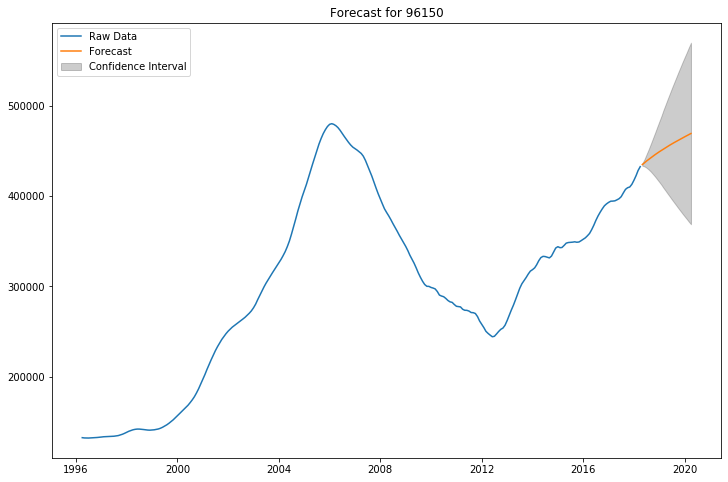

In [395]:
arima_forecast(ts, geog_area, city, county, p_values, d_values, q_values, best_cfg, confint=2, run_pdq = False)

### Zip code  (South Lake Tahoe):  Good potential investment opportunity, with some downside but significant potential upside

By the model prediction, I would expect to see a 8.539% change in price by April 1, 2020.
At the lower bound of the confidence interval, I would expect to see a -14.673% change in price by April 1, 2020.
At the upper bound of the confidence interval, I would expect to see a 31.75% change.

## SacMetro:  95650 (Loomis) -- Excellent investment opportunity with limited downside and large potential upside

### Set up dataframe

In [396]:
geog_area = '95650'

In [397]:
city = 'Loomis'

In [398]:
county = 'Placer'

In [399]:
ts = df_sac.loc[df_sac['Zip'] == geog_area]

In [400]:
ts.head()

,Metro,MetroState,CountyName,City,Zip,value
time,,,,,,
1996-04-01,Sacramento,Sacramento CA,Placer,Loomis,95650,192900.0
1996-05-01,Sacramento,Sacramento CA,Placer,Loomis,95650,193200.0
1996-06-01,Sacramento,Sacramento CA,Placer,Loomis,95650,193400.0
1996-07-01,Sacramento,Sacramento CA,Placer,Loomis,95650,193500.0
1996-08-01,Sacramento,Sacramento CA,Placer,Loomis,95650,193700.0


In [401]:
ts = ts.resample('MS').asfreq()

In [402]:
ts.head()

,Metro,MetroState,CountyName,City,Zip,value
time,,,,,,
1996-04-01,Sacramento,Sacramento CA,Placer,Loomis,95650,192900.0
1996-05-01,Sacramento,Sacramento CA,Placer,Loomis,95650,193200.0
1996-06-01,Sacramento,Sacramento CA,Placer,Loomis,95650,193400.0
1996-07-01,Sacramento,Sacramento CA,Placer,Loomis,95650,193500.0
1996-08-01,Sacramento,Sacramento CA,Placer,Loomis,95650,193700.0


### Visualizations

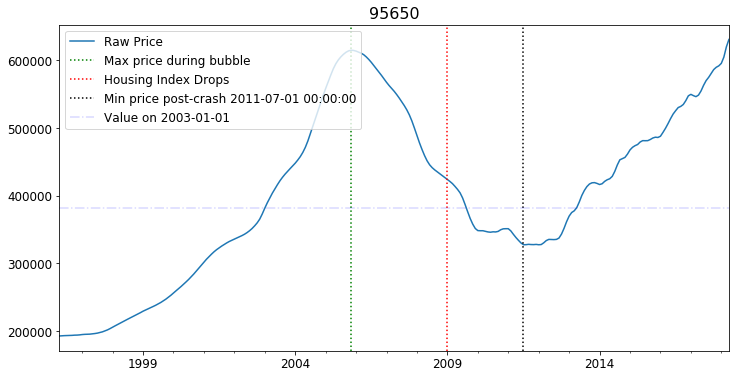

In [403]:
plot_single_geog(df_melt, geog_area, 'value', 'Zip', figsize=(12, 6), fontsize1=12, fontsize2=16)

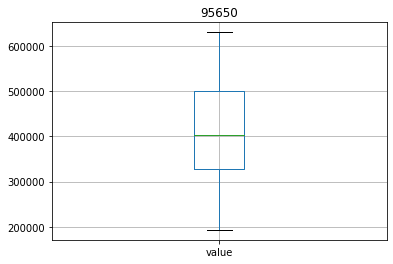

In [404]:
ts.boxplot(column = 'value')
plt.title(geog_area);


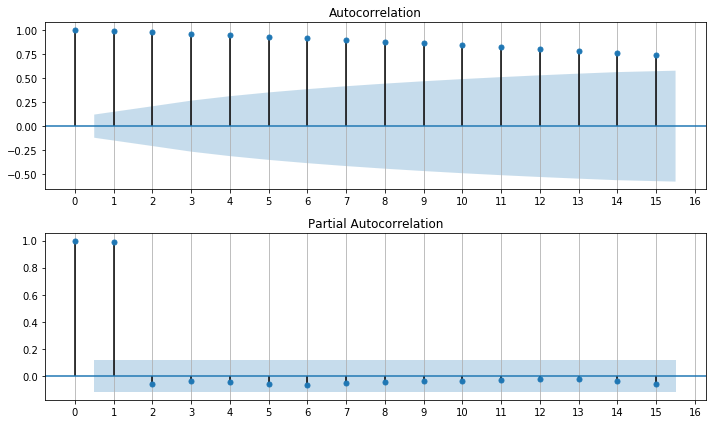

In [405]:
plot_acf_pacf(ts.value)

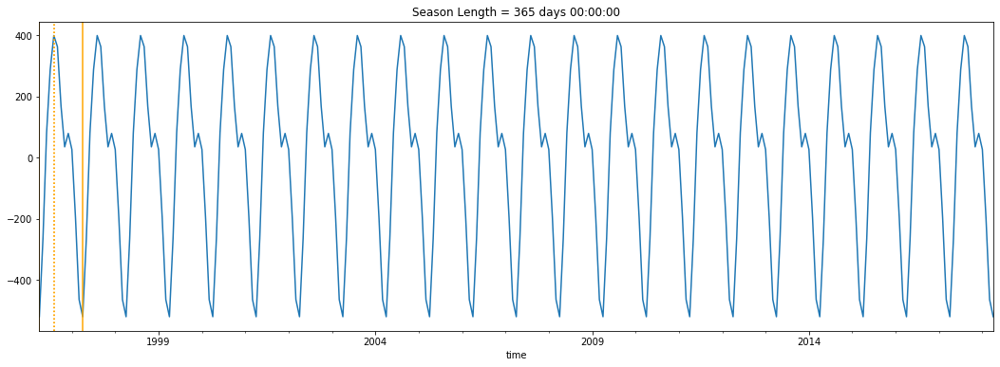

In [406]:
plot_seasonal_decomp(ts.value);

# Note that seasonality isn't much of a factor here; maximum difference of about $700 over the course of a year

### ARIMA parameters tuning

In [ ]:
p_values = [0, 1, 2, 4, 6, 8, 10]
d_values = range(0, 3)
q_values = range(0, 3)


In [ ]:
# order_tuples_95650, mse_results_95650, best_cfg_95650, best_score_95650 = eval_params_and_lists(ts.value, p_values, d_values, q_values)


From previous analyses:  Best ARIMA(8, 1, 2) MSE=3366956.253


In [407]:
best_cfg = (8,1,2)
best_cfg

(8, 1, 2)

In [ ]:
# results_table_95650 = pd.DataFrame({'Order':order_tuples_95650, 'MSEs':mse_results_95650})
# results_table_95650

### ARIMA modeling and forecasting results

In [408]:
print_results_lists()   # make sure that the lists are correct to this point; 
                        # use pop_results_lists() to remove last item

(['95616',
  '95619',
  '95864',
  '95831',
  '95811',
  '95818',
  '95630',
  '96140',
  '95672',
  '95636',
  '95709',
  '95746',
  '95614',
  '95663',
  '95623',
  '95747',
  '95765',
  '95602',
  '96150'],
 ['Davis',
  'Diamond Springs',
  'Arden-Arcade',
  'Sacramento_Pocket',
  'Sacramento_DosRios',
  'Sacramento_LandPark',
  'Folsom',
  'Carnelian Bay',
  'Rescue',
  'Somerset',
  'Camino',
  'Granite Bay',
  'Cool',
  'Penryn',
  'El Dorado',
  'Roseville',
  'Rocklin',
  'Auburn',
  'South Lake Tahoe'],
 ['Yolo',
  'El Dorado',
  'Sacramento',
  'Sacramento',
  'Sacramento',
  'Sacramento',
  'Sacramento',
  'Placer',
  'El Dorado',
  'El Dorado',
  'El Dorado',
  'Placer',
  'El Dorado',
  'Placer',
  'El Dorado',
  'Placer',
  'Placer',
  'Placer',
  'El Dorado'],
 [(2, 1, 2),
  (2, 1, 2),
  (8, 0, 2),
  (6, 0, 2),
  (10, 1, 0),
  (6, 2, 2),
  (2, 2, 0),
  (4, 2, 1),
  (8, 2, 0),
  (8, 2, 1),
  (8, 0, 2),
  (6, 1, 2),
  (8, 0, 2),
  (6, 1, 1),
  (6, 1, 2),
  (4, 1, 2),
  (4,

For 95650 (Loomis):
Best ARIMA order = (8, 1, 2)
                             ARIMA Model Results                              
Dep. Variable:                D.value   No. Observations:                  264
Model:                 ARIMA(8, 1, 2)   Log Likelihood               -2201.328
Method:                       css-mle   S.D. of innovations           1000.078
Date:                Tue, 17 Mar 2020   AIC                           4426.656
Time:                        15:33:43   BIC                           4469.568
Sample:                    05-01-1996   HQIC                          4443.899
                         - 04-01-2018                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
const          1659.4699   1494.999      1.110      0.268   -1270.675    4589.615
ar.L1.D.value     0.4151      0.082      5.034      0.000       0.253    

(['95616',
  '95619',
  '95864',
  '95831',
  '95811',
  '95818',
  '95630',
  '96140',
  '95672',
  '95636',
  '95709',
  '95746',
  '95614',
  '95663',
  '95623',
  '95747',
  '95765',
  '95602',
  '96150',
  '95650'],
 ['Davis',
  'Diamond Springs',
  'Arden-Arcade',
  'Sacramento_Pocket',
  'Sacramento_DosRios',
  'Sacramento_LandPark',
  'Folsom',
  'Carnelian Bay',
  'Rescue',
  'Somerset',
  'Camino',
  'Granite Bay',
  'Cool',
  'Penryn',
  'El Dorado',
  'Roseville',
  'Rocklin',
  'Auburn',
  'South Lake Tahoe',
  'Loomis'],
 ['Yolo',
  'El Dorado',
  'Sacramento',
  'Sacramento',
  'Sacramento',
  'Sacramento',
  'Sacramento',
  'Placer',
  'El Dorado',
  'El Dorado',
  'El Dorado',
  'Placer',
  'El Dorado',
  'Placer',
  'El Dorado',
  'Placer',
  'Placer',
  'Placer',
  'El Dorado',
  'Placer'],
 [(2, 1, 2),
  (2, 1, 2),
  (8, 0, 2),
  (6, 0, 2),
  (10, 1, 0),
  (6, 2, 2),
  (2, 2, 0),
  (4, 2, 1),
  (8, 2, 0),
  (8, 2, 1),
  (8, 0, 2),
  (6, 1, 2),
  (8, 0, 2),
  (6, 1, 

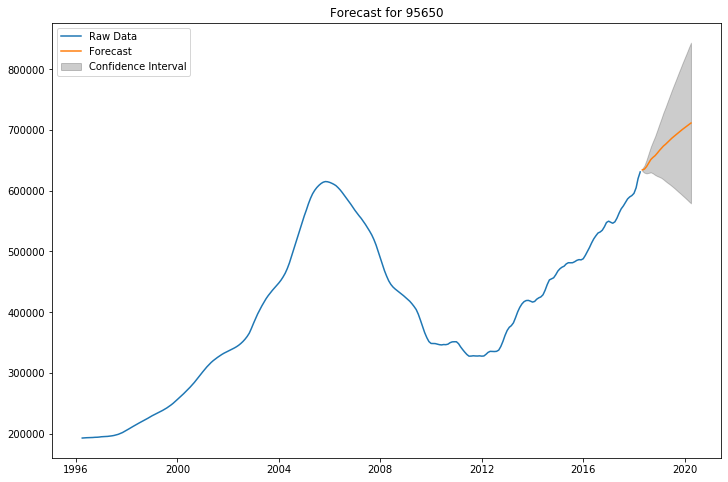

In [409]:
arima_forecast(ts, geog_area, city, county, p_values, d_values, q_values, best_cfg, confint=2, run_pdq = False)

### Zip code 95650 (Loomis):  Excellent investment opportunity with limited downside and large potential upside

By the model prediction, I would expect to see a 12.756% change in price by April 1, 2020.
At the lower bound of the confidence interval, I would expect to see a -8.199% change in price by April 1, 2020.
At the upper bound of the confidence interval, I would expect to see a 33.712% change in price by April 1, 2020.


# Summary of findings

## Create summary dataframe

In [410]:
print_lengths()

geog_areas:  20
cities:  20
counties 20
orders:  20
predicted_prices:  20
lower_bound_prices:  20
upper_bound_prices:  20
last_values:  20
pred_pct_changes:  20
lower_pct_changes:  20
upper_pct_changes:  20


In [411]:

print_results_lists()

(['95616',
  '95619',
  '95864',
  '95831',
  '95811',
  '95818',
  '95630',
  '96140',
  '95672',
  '95636',
  '95709',
  '95746',
  '95614',
  '95663',
  '95623',
  '95747',
  '95765',
  '95602',
  '96150',
  '95650'],
 ['Davis',
  'Diamond Springs',
  'Arden-Arcade',
  'Sacramento_Pocket',
  'Sacramento_DosRios',
  'Sacramento_LandPark',
  'Folsom',
  'Carnelian Bay',
  'Rescue',
  'Somerset',
  'Camino',
  'Granite Bay',
  'Cool',
  'Penryn',
  'El Dorado',
  'Roseville',
  'Rocklin',
  'Auburn',
  'South Lake Tahoe',
  'Loomis'],
 ['Yolo',
  'El Dorado',
  'Sacramento',
  'Sacramento',
  'Sacramento',
  'Sacramento',
  'Sacramento',
  'Placer',
  'El Dorado',
  'El Dorado',
  'El Dorado',
  'Placer',
  'El Dorado',
  'Placer',
  'El Dorado',
  'Placer',
  'Placer',
  'Placer',
  'El Dorado',
  'Placer'],
 [(2, 1, 2),
  (2, 1, 2),
  (8, 0, 2),
  (6, 0, 2),
  (10, 1, 0),
  (6, 2, 2),
  (2, 2, 0),
  (4, 2, 1),
  (8, 2, 0),
  (8, 2, 1),
  (8, 0, 2),
  (6, 1, 2),
  (8, 0, 2),
  (6, 1, 

In [ ]:
population = [45500, 4359, 92186, 42952, 1037, 7630, 21825, 74111, 1170, 4592, 1000, 4354, 22482, 3882, 2468, 3986,
             72437, 41810, 18290, 30000, 12600]
len(population)

In [ ]:
invest_rec = ['mediocre','good', 'poor', 'poor', 'good', 'mediocre', 'poor', 'mediocre', 'excellent', 
              'excellent', 'good', 'poor', 'good', 'mediocre', 'excellent', 'good', 'mediocre', 'excellent', 
              'excellent', 'good', 'excellent']
len(invest_rec)

In [ ]:
df_findings = pd.DataFrame({'ZIP code': geog_areas, '2018 value': last_values, 'City': cities, 
                            'Pop': population, 'County': counties, 'Investment rating': invest_rec, 
                            'Predicted % Change': pred_pct_changes, 'Worst Case % Change': lower_pct_changes,
                            'Best Case % Change': upper_pct_changes, 'Predicted':predicted_prices, 
                            'Worst Case':lower_bound_prices, 'Best Case':upper_bound_prices})


In [ ]:
df_findings

In [ ]:
df_findings = df_findings.set_index('ZIP code')

In [ ]:
df_findings

In [ ]:
df_findings.sort_values('Predicted % Change', ascending = False, inplace=True)

In [ ]:
df_findings

## Visualizations

### Visualization of semi-finalist ZIP codes


In [ ]:
fig, ax = plot_ts_zips(df_sac, geog_areas, nrows=11, ncols=2, figsize=(18, 50), legend=True)


### Visualization of semi-finalist ZIP codes, labeled with ZIP *AND* city


#### Create function to automate plotting of semifinalist ZIP codes with city and ZIP labels

In [ ]:
def zip_semifinalists(df, dict_zip_city, col = 'value', nrows=11, ncols=2, figsize=(18, 40), legend=True):

    fig = plt.figure(figsize=figsize)

    for i, key in enumerate(dict_zip_city.keys(), start=1):
        ax = fig.add_subplot(nrows, ncols, i)   
        ts = df[col].loc[df['Zip'] == dict_zip_city[key]]
        ts = ts.rename(dict_zip_city[key])
        try: 
            max_ = ts.loc['2004':'2011'].idxmax()  
        except:
            continue

        crash = '01-2009'
        min_ = ts.loc[crash:].idxmin()
        val_2003 = ts.loc['2003-01-01']
        ts.plot(ax=ax, fontsize=12)   
        plt.title(f'{key} ({dict_zip_city[key]})', fontsize=16)
        plt.xlabel('')

        ax.axvline(max_, label = 'Maximum value during bubble', color = 'orange', ls=':')               
        ax.axvline(crash, label = 'Housing market declines', color='black')                         
        ax.axvline(min_, label = 'Minimum value after crash', color = 'red', ls=':')
        ax.axhline(val_2003, label='Value on 2003-01-01', color = 'blue', ls='-.', alpha=0.15)

        if legend:
            ax.legend(loc='upper left', prop={'size': 10})

        fig.tight_layout()
        
    return fig, ax


#### Create dictionary of each ZIP code and the city to which it belongs



In [ ]:
dict_semifinal_city_zip = dict(zip(cities, geog_areas))

In [ ]:
dict_semifinal_city_zip

In [ ]:
dict_semifinal_city_zip = dict(sorted(dict_semifinal_city_zip.items()))

In [ ]:
dict_semifinal_city_zip

In [ ]:
len(dict_semifinal_city_zip)

#### Run function to generate plots for all ZIP codes

In [ ]:
zip_semifinalists(df_sac, dict_semifinal_city_zip, col = 'value', nrows=11, ncols=2, figsize=(18, 40), legend=True);

### Create 6 ZIP plots at one time (PowerPoint-friendlier format)

#### Need to first create subset dictionaries to plot over

In [ ]:
def return_slice(dictionary, m, n):
    sub_dict = {k: dictionary[k] for k in list(dictionary)[m:n]}
    return sub_dict


In [ ]:
dict_semi_0_6 = return_slice(dict_semifinal_city_zip, 0, 6)
dict_semi_0_6

In [ ]:
dict_semi_6_12 = return_slice(dict_semifinal_city_zip, 6, 12)
dict_semi_6_12

In [ ]:
dict_semi_12_18 = return_slice(dict_semifinal_city_zip, 12, 18)
dict_semi_12_18

In [ ]:
dict_semi_18_21 = return_slice(dict_semifinal_city_zip, 18, 21)
dict_semi_18_21

#### Run function on subset dictionaries

In [ ]:
zip_semifinalists(df_sac, dict_semi_0_6, col = 'value', nrows=3, ncols=2, figsize=(16, 12), legend=True);

In [ ]:
zip_semifinalists(df_sac, dict_semi_6_12, col = 'value', nrows=3, ncols=2, figsize=(16, 12), legend=True);

In [ ]:
zip_semifinalists(df_sac, dict_semi_12_18, col = 'value', nrows=3, ncols=2, figsize=(16, 12), legend=True);

In [ ]:
zip_semifinalists(df_sac, dict_semi_18_21, col = 'value', nrows=3, ncols=2, figsize=(16, 12), legend=True);

## Recommended ZIP Codes

### Decision-making process

*First,* I sorted ZIP codes based on __predicted return__.  This is how the summary table is sorted.  

*Second,* I considered the potential __worst-case valuation scenario__.  
- There are a few ZIP codes that have relatively good predicted valuations over the two-year time horizon, but also have substantial potential downside.  Examples include Carnelian Bay, Somerset, Diamond Springs, Tahoma, El Dorado, and Roseville.  
- Because of the significant possible downsides of these ZIP codes, I put them in the 'maybe' column.  I subsequently removed them after the considerations below.

*Third,* I reviewed the potential __best-case valuation scenario,__ just to see how much potential upside the ZIP code could yield.  
- Since time series predictions are so uncertain--as illustrated by the large differences between the upper bound and lower bound values--I don't put much weight on the upper end of potential yields.  
- Predicted values as well as downside risk are more important, but looking at the best-case scenario can suggest whether a higher return is more likely.  

*Finally,* I looked at the __population__ in each ZIP code, as well as the __geographic location__ of the ZIP code.  Doing this caused me to modify my initial assessment (and prompted me to analyze more ZIP codes).  
- Several of the "maybe"s on the chart are for very small towns clustered around Lake Tahoe.  I would recommend against selecting more than one of these ZIP codes for the top 5.  
   - For one thing, the towns are very small, so the pool of potential investment opportunities in each is small. 
   - For another thing, many of the homes in these towns are vacation homes, so a significant economic downturn could cause a significant drop in prices.  
   - Third, the region's economy is based almost entirely on tourism (especially skiing in the winter and water sports in the summer).  Economic downturns could depress housing values in the near term, while larger trends such as climate change may have a significant long-term effect (e.g., less natural snowpack in the winter). 


### Top 5 ZIP codes the Sacramento Metro region:

1.  *Rescue, CA (95672).*  While the population is fairly small, average home values are high.  Home values for the ZIP code in 4/1/2020 are forecasted to be ___32% higher___ than they are now.  Furthermore, the downside is very limited (~3%) and the upside is potentially large (68%).

2.  *Penryn, CA (95663).*  The population here is small, but average home values are even higher than Rescue.  While Rescue is in El Dorado County, Penryn is in Placer County, offering a bit of geographic diversity.  Penryn's home values are predicted to rise ___almost 14% higher___ by 4/1/2020.  Downside is limited (8.3% at the lower bound) and upside is potentially substantial (over 35%).  

3.  *Auburn, CA (95602).* Auburn's population is significantly larger than the first two, offering additional investment opportunities and stablity within one ZIP code.  Its location in the foothills of the Sierra Nevada is desireable for many homebuyers, as evidenced by the average home value.  Home values are predicted to ___increase 11.8%___ over 24 months, with minimal downside (-8% at the lower bound) and substantial potential upside (31.6%).

4.  *Rocklin, CA (95765).*  This ZIP code's population (almost 42,000) is larger than Auburn, Rescue, and Penryn put together, and so offers a wider range of opportunities, both expensive and affordable.  The model predicts an ___11.8% increase___ in home values, with a potential lower-bound downside of -8.5% and a large potential upside at 32%.  

5.  *Granite Bay, CA (95746).*  This ZIP code represents an affluent community on the west-northwest side of Folsom Lake.  Home values in this very desireable location are expected to ___increase 7.9%___, with a potential downside of -9.6% and significant possible upside of 25.4%



### Maps

#### Sacramento metro area county map

<center><img src='images/Sac_metro_counties_map.png' height=80% width=80%>

#### El Dorado County

<center><img src='images/ElDorado_Cty_map.png' height=80% width=80%>

#### Placer County

<center><img src='images/Placer_cty_map.png' height=80% width=80%>

#### Rescue, CA (95672) ZIP code map (El Dorado County)  (https://california.hometownlocator.com/)

<center><img src='images/Rescue_95672_map.png' height=50% width=50%>

#### Penryn, CA (95663) ZIP code map (Placer County) (https://california.hometownlocator.com/)

<center><img src='images/Penryn_95663_map.png' height=50% width=50%>

#### Auburn, CA (95602) ZIP code map (Placer County) (https://california.hometownlocator.com/)

<center><img src='images/Auburn_95602_map.png' height=50% width=50%>

#### Rocklin, CA (95765) ZIP code map (Placer County) (https://california.hometownlocator.com/)

<center><img src='images/Rocklin_95765_map.png' height=50% width=50%>

#### Granite Bay, CA (95746) ZIP code map (Placer County) (https://california.hometownlocator.com/)

<center><img src='images/GraniteBay_95746_map.png' height=50% width=50%>

# Ancillary functions

## Search metro area by str.contains

In [ ]:
# df_metro_values[df_metro_values['MetroState'].str.contains('New York', regex=False)]


## Creating df_metro_values (US Metros df with *Metro* mean values)

In [ ]:
df_metro_values = df_melt.groupby(['MetroState', 'State', 'time']).mean().reset_index()

In [ ]:
df_metro_values.head()

In [ ]:
df_metro_values = df_metro_values.set_index('time')

In [ ]:
df_metro_values.drop('SizeRank', axis=1, inplace=True)

In [ ]:
df_metro_values.head()

In [ ]:
df_metro_values.MetroState.value_counts().head()

In [ ]:
df_metro_values.nunique()

In [ ]:
df_metro_values.info()

## df_geog:  Function for creating a dataframe based on particular geographic unit (e.g., MetroState area, City, CountyName)

In [ ]:
def df_geog(df, col, geog):
    
    '''Creates subset dataframe containing just the geographic unit 
    (e.g., 'MetroState' == 'Sacramento CA', 'City' == 'Davis', etc.) of interest.  
    It is necessary to set df equal to a dataframe with the appropriate geographic grouping: 
    e.g., to plot values by city in a metro aree, df = df_metro_cities, col = 'MetroState',
    geog = 'Sacramento CA' (or metro area of interest). 
    '''
    df_metro_cities_geog = df.loc[df[col] == geog]
    return df_metro_cities_geog


## Plotting functions

### Plotting function:  plot_single_geog function (plots a single geographic unit)

In [ ]:
# Be sure to use df with appropriate value grouping (e.g., metro, city, zip)

def plot_single_geog(df, col = 'value', col2 = 'MetroState', metunit = 'Sacramento CA', figsize=(12, 6), fontsize1=12, fontsize2=16):
    
    ''' Plots housing values for individual geographic unit, e.g., MetroState, City, County.  
    Be sure to use the appropriate dataframe for the selected grouping (df_metro_cities for 
    cities in a metro area, for example).  Specify nrows, ncols, and figsize to match size of list.
    '''
    
    ts = df[col].loc[df[col2] == metunit]
    ax = ts.plot(figsize=figsize, title = metunit, fontsize=fontsize2, label = 'Raw Price')
    plt.xlabel('')

    max_ = ts.loc['2004':'2010'].idxmax()  
    crash = '01-2009'
    min_ = ts.loc[crash:].idxmin()
    val_2003 = ts.loc['2003-01-01']

    ax.axvline(max_, label='Max price during bubble', color = 'green', ls=':')
    ax.axvline(crash, label = 'Housing Index Drops', color='red', ls=':')
    ax.axvline(min_, label=f'Min price post-crash {min_}', color = 'black', ls=':')
    ax.axhline(val_2003, label='Value on 2003-01-01', color = 'blue', ls='-.', alpha=0.15)

    ax.legend(loc='upper left', fontsize=fontsize1)



### Plotting function:  Combining line plot, boxplot, ACF, PACF, and seasonal decomposition

In [ ]:
# doesn't work in current form

def plotting_eda(df, geog_area, col1='value', col2 = 'Zip', figsize_plot = (12, 6), fontsize1=14, 
                 fontsize2=18, figsize_box=(8, 4), figsize_acf = (10, 6), legend=True, 
                 set_ylim = False, ylim = 800000, lags=15):
    
    from statsmodels.tsa.seasonal import seasonal_decompose
    from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
    from pandas.plotting import autocorrelation_plot, lag_plot
    
#     ts = df[col1].loc[df[col2] == geog_area]
    single_zip_boxplot(df, geog_area, figsize=figsize_box)    
    plot_single_geog(df, geog_area, col1, col2, figsize=figsize_plot)
    plot_acf_pacf(ts, figsize_acf, lags)
    plot_seasonal_decomp(ts)
    

## ARIMA modeling and forecasting results

In [ ]:
p_values = [0, 1, 2, 4, 8, 10]
d_values = range(0, 3)
q_values = range(0, 3)

# geog_areas = []
# cities = []
# orders = []
# predicted_prices = []
# lower_bound_prices = [] 
# upper_bound_prices = []
# last_values = []
# pred_pct_changes = []
# lower_pct_changes = []
# upper_pct_changes = []


def arima_forecast(ts, city, geog_area, p_values, d_values, q_values, best_pdq, confint=2, run_pdq = False):     # months = 24 by default
    geog_areas.append(geog_area)
    cities.append(city)
    
    # evaluate parameters
    print(f'For {geog_area} ({city}):')
    p_values = [0, 1, 2, 4, 8, 10]
    d_values = range(0, 3)
    q_values = range(0, 3)
    warnings.filterwarnings("ignore")
    
    if run_pdq:
        best_cfg, best_score = eval_arima_models(ts, p_values, d_values, q_values)     # returns order (variable best_cfg)
        order = best_cfg
    else:
        order = best_pdq
        
    print(f'Best ARIMA order = {order}')
    model_fit = arima_zipcode(ts, order)                                # returns model_fit
    actual_forecast, forecast_confint, std_error = forecast(model_fit)  # returns actual_forecast, forecast_confint, std_error
    df_forecast = forecast_df(actual_forecast, std_error, forecast_confint, col = 'time',     # returns df_forecast with future predictions
                              daterange = pd.date_range(start='2018-05-01', end='2020-04-01', freq='MS'))
    df_new = concat_values_forecast(ts, df_forecast)                    # concatenates historical and forecasted values into df_new
    plot_forecast(df_new, geog_area)                            # plots forecast with the label of geog_area
    forecasted_price, forecasted_lower, forecasted_upper = forecast_values(df_new, date = '2020-04-01')   # returns forecasted_price, forecasted_lower, forecasted_upper
    pred = forecasted_price
    low = forecasted_lower
    high = forecasted_upper
    last = df_new['value'].loc['2018-04-01']
    pred_pct_change = (((pred - last) / last) * 100)
    print(f'By the model prediction, I would expect to see a {round(pred_pct_change, 3)}% change in price by April 1, 2020.')
    lower_pct_change = (((low - last) / last) * 100)
    print(f'At the lower bound of the confidence interval, I would expect to see a {round(lower_pct_change, 3)}% change in price by April 1, 2020.')
    upper_pct_change = (((high - last) / last) * 100)
    print(f'At the upper bound of the confidence interval, I would expect to see a {round(upper_pct_change, 3)}% change in price by April 1, 2020.')
#     print(round(pred_pct_change, 3), round(lower_pct_change, 3), round(upper_pct_change, 3))
#     pred_pct_change, lower_pct_change, upper_pct_change = pred_best_worst(pred, low, high, last)
#                                                                 # returns predicted, worst-case (2 conf. intervals below),     
#                                                                 # and best-case (2 conf. intervals above) values
    orders.append(order)
    predicted_prices.append(forecasted_price)
    lower_bound_prices.append(forecasted_lower)
    upper_bound_prices.append(forecasted_upper)
    last_values.append(last)
    pred_pct_changes.append(pred_pct_change)
    lower_pct_changes.append(lower_pct_change)
    upper_pct_changes.append(upper_pct_change)
    return geog_areas, cities, orders, predicted_prices, lower_bound_prices, upper_bound_prices, last_values, pred_pct_changes, lower_pct_changes, upper_pct_changes
#     return geog_areas, cities, orders, predicted_prices, lower_bound_prices, upper_bound_prices, last_values, pred_pct_changes, lower_pct_changes, upper_pct_changes
           # returns the following as lists:  geog_areas, cities, orders, predicted_prices, lower_bound_prices, 
           # upper_bound_prices, last_values, pred_pct_changes, lower_pct_changes, upper_pct_changes


## Parameter fine-tuning function

In [ ]:
# def arima_predict_error(X, arima_order):
#     train_size = int(len(X) * .85)
#     train, test = X[0:train_size], X[train_size:]
#     predictions = list()
#     history = [x for x in train]
#     for t in range(len(test)):
#         model = ARIMA(history, order=arima_order)
#         model_fit = model.fit(disp=0)
#         y_hat = model_fit.forecast()[0]
#         predictions.append(y_hat)
#         history.append(test[t])
#     error = mean_squared_error(test, predictions)
#     return error

# def eval_arima_models(dataset, p_values, d_values, q_values):
#     dataset_value = dataset['value']
#     dataset_value = dataset_value.astype('float32')
# #     best_score, best_cfg = float("inf"), None
#     for p in p_values:
#         for d in d_values:
#             for q in q_values:
#                 order = (p,d,q)
#                 try:
#                     mse = arima_predict_error(dataset_value, order)
#                     if mse < best_score:
#                         best_score, best_cfg = mse, order
#                     print('ARIMA%s MSE=%.3f' % (order,mse))
#                 except:
#                     continue
#     print('Best ARIMA%s MSE=%.3f' % (best_cfg, best_score))
#     return best_cfg, best_score


In [ ]:
# def arima_predict_error(X, arima_order):
#     train_size = int(len(X) * .85)
#     train, test = X[0:train_size], X[train_size:]
#     predictions = list()
#     history = [x for x in train]
#     for t in range(len(test)):
#         model = ARIMA(history, order=arima_order)
#         model_fit = model.fit(disp=0)
#         y_hat = model_fit.forecast()[0]
#         predictions.append(y_hat)
#         history.append(test[t])
#     error = mean_squared_error(test, predictions)
#     return error



In [ ]:
# def eval_arima_models(ts, p_values, d_values, q_values):
#     ts_value = ts['value']
#     ts_value = ts_value.astype('float32')
# #     best_score, best_cfg = float("inf"), None
#     for p in p_values:
#         for d in d_values:
#             for q in q_values:
#                 order = (p,d,q)
#                 try:
#                     mse = arima_predict_error(ts_value, order)
#                     if mse < best_score:
#                         best_score, best_cfg = mse, order
#                     print('ARIMA%s MSE=%.3f' % (order,mse))
#                 except:
#                     continue
#     print('Best ARIMA%s MSE=%.3f' % (best_cfg, best_score))
#     return best_cfg, best_score


In [ ]:
# Original function from Jeff's Mod4 project starter notebook 


# import warnings
# from statsmodels.tsa.arima_model import ARIMA
# from sklearn.metrics import mean_squared_error

# # evaluate an ARIMA model for a given order (p,d,q)
# def evaluate_arima_model(X, arima_order):
#     # prepare training dataset
#     train_size = int(len(X) * 0.66)
#     train, test = X[0:train_size], X[train_size:]
#     history = [x for x in train]
#     # make predictions
#     predictions = list()
#     for t in range(len(test)):
#         model = ARIMA(history, order=arima_order)
#         model_fit = model.fit(disp=0)
#         yhat = model_fit.forecast()[0]
#         predictions.append(yhat)
#         history.append(test[t])
#     # calculate out of sample error
#     error = mean_squared_error(test, predictions)
#     return error

# # evaluate combinations of p, d and q values for an ARIMA model
# def evaluate_models(dataset, p_values, d_values, q_values):
#     dataset = dataset.astype('float32')
#     best_score, best_cfg = float("inf"), None
#     for p in p_values:
#         for d in d_values:
#             for q in q_values:
#                 order = (p,d,q)
#                 try:
#                     mse = evaluate_arima_model(dataset, order)
#                     if mse < best_score:
#                         best_score, best_cfg = mse, order
#                     print('ARIMA%s MSE=%.3f' % (order,mse))
#                 except:
#                     continue
#     print('Best ARIMA%s MSE=%.3f' % (best_cfg, best_score))
#     return best_cfg, best_score   # adding to Jeff's function; output will be taken into forecast function that follows


# # evaluate parameters
# p_values = [0, 1, 2, 4, 6, 8, 10]
# d_values = range(0, 3)
# q_values = range(0, 3)
# warnings.filterwarnings("ignore")
# # evaluate_models(df_kc_melt.values, p_values, d_values, q_values)

### ARIMA model fit

In [ ]:
model_fit = arima_zipcode(ts, order = order)

### ARIMA forecast function -- run parameter optimization

In [ ]:
# def arima_predict_error(X, arima_order):
#     train_size = int(len(X) * .85)
#     train, test = X[0:train_size], X[train_size:]
#     predictions = list()
#     history = [x for x in train]
#     for t in range(len(test)):
#         model = ARIMA(history, order = arima_order)
#         model_fit = model.fit(disp=0)
#         y_hat = model_fit.forecast()[0]
#         predictions.append(y_hat)
#         history.append(test[t])
#     error = mean_squared_error(test, predictions)
#     return error

# def eval_arima_models(ts, p_values, d_values, q_values):
#     ts_value = ts['value']
#     ts_value = ts_value.astype('float32')
#     best_score, best_cfg = float("inf"), None
#     for p in p_values:
#         for d in d_values:
#             for q in q_values:
#                 order = (p,d,q)
#                 try:
#                     mse = arima_predict_error(ts_value, order)
#                     if mse < best_score:
#                         best_score, best_cfg = mse, order
#                     print('ARIMA%s MSE=%.3f' % (order,mse))
#                 except:
#                     continue
#     print('Best ARIMA%s MSE=%.3f' % (best_cfg, best_score))
#     return best_cfg, best_score


p_values = [0, 1, 2, 4, 6, 8, 10]
d_values = range(0, 3)
q_values = range(0, 3)

def arima_forecast_run_pdq(ts, geog_area, city, county, p_values, d_values, q_values, confint=2):     # months = 24 by default
    
    # evaluate parameters
    print(f'For {geog_area} ({city}):')
    p_values = [0, 1, 2, 4, 6, 8, 10]
    d_values = range(0, 3)
    q_values = range(0, 3)
    warnings.filterwarnings("ignore")
    
    eval_arima_models(ts, p_values, d_values, q_values)     # returns order (variable best_cfg)
    order = best_cfg
    
    print(f'Best ARIMA order = {order}')
    model_fit = arima_zipcode(ts, order)                                # returns model_fit
    actual_forecast, forecast_confint, std_error = forecast(model_fit)  # returns actual_forecast, forecast_confint, std_error
    df_forecast = forecast_df(actual_forecast, std_error, forecast_confint, col = 'time',     # returns df_forecast with future predictions
                              daterange = pd.date_range(start='2018-05-01', end='2020-04-01', freq='MS'))
    df_new = concat_values_forecast(ts, df_forecast)                    # concatenates historical and forecasted values into df_new
    plot_forecast(df_new, geog_area)                            # plots forecast with the label of geog_area
    forecasted_price, forecasted_lower, forecasted_upper = forecast_values(df_new, date = '2020-04-01')   # returns forecasted_price, forecasted_lower, forecasted_upper
    pred = forecasted_price
    low = forecasted_lower
    high = forecasted_upper
    last = df_new['value'].loc['2018-04-01']
    pred_pct_change = (((pred - last) / last) * 100)
    lower_pct_change = (((low - last) / last) * 100)
    upper_pct_change = (((high - last) / last) * 100)
       
    geog_areas.append(geog_area)
    cities.append(city)
    counties.append(county)
    orders.append(order)
    predicted_prices.append(round(forecasted_price, 2))
    lower_bound_prices.append(round(forecasted_lower, 2))
    upper_bound_prices.append(round(forecasted_upper, 2))
    last_values.append(last)
    pred_pct_changes.append(round(pred_pct_change, 2))
    lower_pct_changes.append(round(lower_pct_change, 2))
    upper_pct_changes.append(round(upper_pct_change, 2))
    
    print(f'By the model prediction, I would expect to see a {round(pred_pct_change, 3)}% change in price by April 1, 2020.')
    print(f'At the lower bound of the confidence interval, I would expect to see a {round(lower_pct_change, 3)}% change in price by April 1, 2020.')
    print(f'At the upper bound of the confidence interval, I would expect to see a {round(upper_pct_change, 3)}% change in price by April 1, 2020.')

    return geog_areas, cities, counties, orders, predicted_prices, lower_bound_prices, upper_bound_prices, last_values, pred_pct_changes, lower_pct_changes, upper_pct_changes


In [282]:
# original function

p_values = [0, 1, 2, 4, 6, 8, 10]
d_values = range(0, 3)
q_values = range(0, 3)

def arima_forecast(ts, geog_area, city, county, p_values, d_values, q_values, best_pdq, confint=2, run_pdq = False):     # months = 24 by default
    
    # evaluate parameters
    print(f'For {geog_area} ({city}):')
    p_values = [0, 1, 2, 4, 6, 8, 10]
    d_values = range(0, 3)
    q_values = range(0, 3)
    warnings.filterwarnings("ignore")
    
    if run_pdq:
        best_cfg, best_score = eval_arima_models(ts, p_values, d_values, q_values)     # returns order (variable best_cfg)
        order = best_cfg
    else:
        order = best_pdq
        
    print(f'Best ARIMA order = {order}')
    model_fit = arima_zipcode(ts, order)                                # returns model_fit
    actual_forecast, forecast_confint, std_error = forecast(model_fit)  # returns actual_forecast, forecast_confint, std_error
    df_forecast = forecast_df(actual_forecast, std_error, forecast_confint, col = 'time',     # returns df_forecast with future predictions
                              daterange = pd.date_range(start='2018-05-01', end='2020-04-01', freq='MS'))
    df_new = concat_values_forecast(ts, df_forecast)                    # concatenates historical and forecasted values into df_new
    plot_forecast(df_new, geog_area)                            # plots forecast with the label of geog_area
    forecasted_price, forecasted_lower, forecasted_upper = forecast_values(df_new, date = '2020-04-01')   # returns forecasted_price, forecasted_lower, forecasted_upper
    pred = forecasted_price
    low = forecasted_lower
    high = forecasted_upper
    last = df_new['value'].loc['2018-04-01']
    pred_pct_change = (((pred - last) / last) * 100)
    lower_pct_change = (((low - last) / last) * 100)
    upper_pct_change = (((high - last) / last) * 100)
       
    geog_areas.append(geog_area)
    cities.append(city)
    counties.append(county)
    orders.append(order)
    predicted_prices.append(round(forecasted_price, 2))
    lower_bound_prices.append(round(forecasted_lower, 2))
    upper_bound_prices.append(round(forecasted_upper, 2))
    last_values.append(last)
    pred_pct_changes.append(round(pred_pct_change, 2))
    lower_pct_changes.append(round(lower_pct_change, 2))
    upper_pct_changes.append(round(upper_pct_change, 2))
    
    print(f'By the model prediction, I would expect to see a {round(pred_pct_change, 3)}% change in price by April 1, 2020.')
    print(f'At the lower bound of the confidence interval, I would expect to see a {round(lower_pct_change, 3)}% change in price by April 1, 2020.')
    print(f'At the upper bound of the confidence interval, I would expect to see a {round(upper_pct_change, 3)}% change in price by April 1, 2020.')

    return geog_areas, cities, counties, orders, predicted_prices, lower_bound_prices, upper_bound_prices, last_values, pred_pct_changes, lower_pct_changes, upper_pct_changes


### Create forecast model

In [ ]:
# actual_forecast, std_error, forecast_confint  

### Create dataframe to hold these values and join to existing dataframe

In [ ]:
# df_forecast = forecast_df(actual_forecast, forecast_confint, std_error)

### Create df_new with historical and forecasted values

In [ ]:
def concat_values_forecast(ts, df_forecast):
    df_new = pd.concat([ts, df_forecast])
    df_new = df_new.rename(columns = {0: 'value'})
    return df_new

In [ ]:
# df_new = concat_values_forecast(ts, df_forecast)

In [ ]:
# df_new.head()

### Plot forecast results

In [ ]:
# Define function

def plot_forecast(df, figsize=(12,8), geog_area='95616'):
    fig = plt.figure(figsize=figsize)
    plt.plot(df['value'], label='Raw Data')
    plt.plot(df['forecast'], label='Forecast')
    plt.fill_between(df.index, df['forecast_lower'], df['forecast_upper'], color='k', alpha = 0.2, 
                 label='Confidence Interval')
    plt.legend(loc = 'upper left')
    plt.title(f'Forecast for {geog_area}')


In [ ]:
# plot_forecast(df_new)

### Figure out percent change in home values

In [ ]:
# Define functions

def forecast_values(df=df, date = '2020-04-01'):
    forecasted_price = df.loc[date, 'forecast']
    forecasted_lower = df.loc[date, 'forecast_lower']
    forecasted_upper = df.loc[date, 'forecast_upper']    
    return forecasted_price, forecasted_lower, forecasted_upper


In [ ]:
# forecasted_price, forecasted_lower, forecasted_upper = forecast_values(df_new)

In [ ]:
# forecasted_price, forecasted_lower, forecasted_upper

In [ ]:
def last_value(df, date = '2018-04-01'):
    last_value = df.loc[date, 'value']
    return last_value


In [ ]:
# last_value = last_value(df_new)

In [ ]:
# last_value

### Compute and print predicted, best, and worst case scenarios

In [ ]:
def pred_best_worst(pred, low, high, last, date='April 1, 2020'):
    
    '''Prints out predicted, best-case, and worst-case scencarios from forecast'''
    
    pred_pct_change = (((pred - last) / last) * 100)
    print(f'By the model prediction, I would expect to see a {round(pred_pct_change, 3)}% change in price by April 1, 2020.')
    lower_pct_change = ((low - last) / last) * 100
    print(f'At the lower bound of the confidence interval, I would expect to see a {round(lower_pct_change, 3)}% change in price by April 1, 2020.')
    upper_pct_change = ((high - last) / last) * 100
    print(f'At the upper bound of the confidence interval, I would expect to see a {round(upper_pct_change, 3)}% change in price by April 1, 2020.')
    return round(pred_pct_change, 3), round(lower_pct_change, 3), round(upper_pct_change, 3)
        

In [ ]:
# pred, lower, upper = pred_best_worst(pred=forecasted_price, low=forecasted_lower, high=forecasted_upper, last=last_value, date='April 1, 2020')


### Lists and construction of dataframe (old)

In [ ]:
zipcodes = ['95616', '95619', '95864', '95831', '96142', '95811', '95818', '95630', '96140', '95672', '95636', 
            '95709','95746', '95614', '95663', '95623', '95747', '95765', '95602', '96150' , '95650']
len(zipcodes)

In [ ]:
last_value_2018 = [last_value_95616, last_value_95619, last_value_95864, last_value_95831, last_value_96142, last_value_95811,
                  last_value_95818, last_value_95630, last_value_96140, last_value_95672, last_value_95636, last_value_95709,
                  last_value_95746, last_value_95614, last_value_95663, last_value_95623, last_value_95747, last_value_95765, 
                   last_value_95602, last_value_96150, last_value_95650]

In [ ]:
len(last_value_2018)
# last_value_2018

In [ ]:
cities = ['Davis', 'Diamond Springs', 'Arden-Arcade', 'Sacramento_Pocket', 'Tahoma', 'Sacramento_DosRios', 'Sacramento_LandPark', 'Folsom', 
          'Carnelian Bay', 'Rescue', 'Somerset', 'Camino', 'Granite Bay', 'Cool', 'Penryn', 'El Dorado', 
         'Roseville', 'Rocklin', 'Auburn', 'South Lake Tahoe', 'Loomis']
len(cities)
cities

In [ ]:
county = ['Yolo', 'El Dorado', 'Sacramento', 'Sacramento', 'El Dorado', 'Sacramento', 'Sacramento', 'Sacramento', 
          'Placer', 'El Dorado', 'El Dorado', 'El Dorado', 'Placer', 'El Dorado', 'Placer', 'El Dorado', 
          'Placer', 'Placer', 'Placer', 'El Dorado', 'Placer']
print(len(county))

In [ ]:
pred_value_pct_change = [davis_95616_pred, diamond_springs_95619_pred, arden_95864_pred, sac_pocket_95831_pred, tahoma_96142_pred, 
              sac_95811_pred, sac_95818_pred, folsom_95630_pred, cb_96140_pred, rescue_95672_pred, 
              somerset_95636_pred, camino_95709_pred, gb_95746_pred, cool_95614_pred, penryn_95663_pred, 
             eldorado_95623_pred, roseville_95747_pred, rocklin_95765_pred, auburn_95602_pred, slt_96150_pred, loomis_95650_pred]


In [ ]:
len(pred_value_pct_change)

In [ ]:
worst_case_pct_change = [davis_95616_lower, diamond_springs_95619_low, arden_95864_low, sac_pocket_95831_low, tahoma_96142_low, 
              sac_95811_low, sac_95818_low, folsom_95630_low, cb_96140_low, rescue_95672_low, 
              somerset_95636_low, camino_95709_low, gb_95746_low, cool_95614_low, penryn_95663_low, eldorado_95623_low, 
             roseville_95747_low, rocklin_95765_low, auburn_95602_low, slt_96150_low, loomis_95650_low]

In [ ]:
len(worst_case_pct_change)

In [ ]:
best_case_pct_change = [davis_95616_upper, diamond_springs_95619_high, arden_95864_high, sac_pocket_95831_high, tahoma_96142_high, 
             sac_95811_high, sac_95818_high, folsom_95630_high, cb_96140_high, rescue_95672_high, 
             somerset_95636_high, camino_95709_high, gb_95746_high, cool_95614_high, penryn_95663_high, eldorado_95623_high, 
            roseville_95747_high, rocklin_95765_high, auburn_95602_high, slt_96150_high, loomis_95650_high]

In [ ]:
len(best_case_pct_change)

In [ ]:
df_findings = pd.DataFrame({'ZIP code': zipcodes, '2018 value': last_value_2018, 'City': cities, 'Pop': population, 'County': county, 
                            'Investment rating': invest_rec, 'Predicted':pred_value_pct_change, 'Worst Case':worst_case_pct_change, 
                            'Best Case':best_case_pct_change})

In [ ]:
df_findings

In [ ]:
df_findings.set_index('ZIP code', inplace=True)

# Notebook spacer

# Notebook spacer

# Notebook spacer